#Notebook for NLU project

This notebook contains the source code of the models that were tested: 

- Simple LSTM from LAB 10
- Improved BiLSTM with specific loss function (Focal Loss) and loss weighting (Randomly Weighted Loss)
- BERT fine tuning

The notebook contains a header with some initialization and then each section contains the corrisponding model with results on both ATIS and SNIPS. A better distributed version of ATIS is tested as well. 

Comments and further analysis of the results are in the final report

###Task 

The task to perform both **Slot filling** and **Intent classification** tasks.

In the literature there are proofs that models trained jointly on both tasks perform better than individual task specific models. 

####Slot filling
The sequence labelling task is defined as:
- Given a sequence of tokens $w = {w_1, w_2, ..., w_n}$,
- defining a sequence of labels as $l = {l_1, l_2, ..., l_n}$
- compute the sequence $\hat{l}$ such as $\hat{l} = \underset{l}{\operatorname{argmax}} P(l|w)$ 

\
An example from ATIS dataset is the following: 

| Slot Filling | | | | | | | | | | | | | |
|----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |
| Input sequence: |i |'d |like |to |see |all |the |economy |fares |from |baltimore |to | philadelphia|
| Output sequence: | O |O |O |O |O |O |O |B-economy |O |O |B-fromloc.city_name |O |B-toloc.city_name|



####Intent classification
The intent classification problem is defined as follows:
- Given a sequence of tokens $w = {w_[1](https://), w_2, ..., w_n}$,
- And a set of labels $L$ where $l \in L$
- estimate the label $\hat{l}$ such as $\hat{l} = \underset{l}{\operatorname{argmax}} P(l|w)$ 

An example from ATIS dataset is the following:

| Intent Classification | | | | | | | | | | | | | |
|----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |----- |
| Input sequence: |i |'d |like |to |see |all |the |economy |fares |from |baltimore |to | philadelphia|
| Output label: | airfare |



###Dataset
The datasets that are used in the evaluation are ATIS (Airline Travel Information Systems) and SNIPS

####ATIS

Airline Travel Information Systems (ATIS) dataset is made of entries as such

```json
[
    {
        "utterance": "i want to fly from boston at 838 am and arrive in denver at 1110 in the morning",
        "slots": "O O O O O B-fromloc.city_name O B-depart_time.time I-depart_time.time O O O B-toloc.city_name O B-arrive_time.time O O B-arrive_time.period_of_day",
        "intent": "flight"
    },
    ...
]
```

####SNIPS

SNIPS dataset is made of entries as such

```json
[
    {
        "utterance": "listen to westbam alumb allergic on google music",
        "slots": "O O B-artist O B-album O B-service I-service",
        "intent": "PlayMusic"
    },
    ...
 ]
```

# Setup
In this part of the notebook, the initial setup is done.

That includes:

- Install required libraries
- Required imports
- Dataset and DataLoader classes
- Train, Dev and Test sets
- creation of a more balanced ATIS dataset
- Other utility functions used throught the notebook

## Install and import libraries

In [1]:
##install transformers, which is required for BERT and AlBERT
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.7 MB 9.5 MB/s 
     |████████████████████████████████| 101 kB 13.5 MB/s 
     |████████████████████████████████| 6.6 MB 83.4 MB/s 


In [2]:
##classic  libraries
import os
import json
from pprint import pprint
import random
import numpy as np
from collections import Counter
from copy import deepcopy
from collections import OrderedDict

##data plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import colorsys
import itertools
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

##train test splitting library form sklearn
from sklearn.model_selection import train_test_split
##confusion matrix from sklearn
from sklearn.metrics import confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix
## TSNE from sklearn for feature plotting
from sklearn.manifold import TSNE
# required
from functools import partial


##import of torch libraries for neural networks
import torch
import torch.nn as nn
import torch.utils.data as data
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence
import torch.optim as optim

##BERT and AlBERT
from transformers import BertTokenizer,BertModel

##evaluation
from sklearn.metrics import classification_report
##tqdm
from tqdm import tqdm
##custom evaluate from conll script
from conll import evaluate

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  
print(device)
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
PAD_TOKEN = 0
UNK_TOKEN = 1

##unzip dataset in the current folder. Requires to insert the dataset here
! rm -rf data
! unzip data.zip

cuda
Archive:  data.zip
   creating: data/
   creating: data/ATIS/
   creating: data/ATIS/original/
  inflating: data/ATIS/original/atis.test.ctf  
  inflating: data/ATIS/original/atis.train.ctf  
  inflating: data/ATIS/test.json     
  inflating: data/ATIS/train.json    
  inflating: data/README.md          
   creating: data/SNIPS/
   creating: data/SNIPS/original/
   creating: data/SNIPS/original/test/
  inflating: data/SNIPS/original/test/label  
  inflating: data/SNIPS/original/test/seq.in  
  inflating: data/SNIPS/original/test/seq.out  
   creating: data/SNIPS/original/train/
  inflating: data/SNIPS/original/train/label  
  inflating: data/SNIPS/original/train/seq.in  
  inflating: data/SNIPS/original/train/seq.out  
   creating: data/SNIPS/original/valid/
  inflating: data/SNIPS/original/valid/label  
  inflating: data/SNIPS/original/valid/seq.in  
  inflating: data/SNIPS/original/valid/seq.out  
  inflating: data/SNIPS/test.json    
  inflating: data/SNIPS/train.json   
  infl

## Dataset preparation

This part is dedicated to prepare the dataset, from reading it from file to creating a DataLoader for the models

###Dataset reader

Dataset reader function for both ATIS and SNIPS

In [3]:
##dataset JSON reader
def load_data(path):
    '''
    input: path/to/data
    output: json 
    '''
    dataset = []
    with open(path) as f:
        dataset = json.loads(f.read())
    return dataset

In [4]:
##create two raw datasets

tmp_train_raw_ATIS = load_data(os.path.join('data','ATIS','train.json'))
test_raw_ATIS = load_data(os.path.join('data','ATIS','test.json'))
print('Train samples ATIS:', len(tmp_train_raw_ATIS))
print('Test samples ATIS:', len(test_raw_ATIS))

train_raw_SNIPS = load_data(os.path.join('data','SNIPS','train.json'))
dev_raw_SNIPS = load_data(os.path.join('data','SNIPS','valid.json'))
test_raw_SNIPS = load_data(os.path.join('data','SNIPS','test.json'))
print('Train samples SNIPS:', len(train_raw_SNIPS))
print('Test samples SNIPS:', len(test_raw_SNIPS))

Train samples ATIS: 4978
Test samples ATIS: 893
Train samples SNIPS: 13084
Test samples SNIPS: 700


###Dev set
In the original split the developement set is missing. To train and find the best hyperparameter of our network the dev set is fundamental. Therefore it is required to create it starting from the **traning** set by doing a stratified sampling from training set.

In [5]:
##function to split dataset in train,dev and test
def dataset_split(tmp_train_raw,test_raw):
    '''
    input: tmp_train_raw,test_raw two datasets for train and test
    output: train_raw,dev_raw,test_raw three datasets splitted correctly
    '''
    ##First we get the 10% of dataset, then we compute the percentage of these examples 
    portion = round(((len(tmp_train_raw) + len(test_raw)) * 0.10)/(len(tmp_train_raw)),2)
    ##Stratify as cross validation
    intents = [x['intent'] for x in tmp_train_raw]
    count_y = Counter(intents)
    Y = []
    X = []
    mini_Train = []
    for id_y, y in enumerate(intents):
        if count_y[y] > 1: ##Some intents have only one instance, we put them in training
            X.append(tmp_train_raw[id_y])
            Y.append(y)
        else:
            mini_Train.append(tmp_train_raw[id_y])
    ##Random Stratify -> cross validation
    X_train, X_dev, y_train, y_dev = train_test_split(X, Y, test_size=portion, random_state=26, shuffle=True,stratify=Y)
    ##We add the examples with only one instance
    X_train.extend(mini_Train)
    train_raw = X_train
    dev_raw = X_dev

    return train_raw,dev_raw,test_raw


In [6]:
train_raw_ATIS,dev_raw_ATIS,test_raw_ATIS = dataset_split(tmp_train_raw_ATIS,test_raw_ATIS)
##Dataset size ATIS
print('TRAIN size ATIS:', len(train_raw_ATIS))
print('DEV size ATIS:', len(dev_raw_ATIS))
print('TEST size ATIS:', len(test_raw_ATIS))

print('')
# train_raw_SNIPS,dev_raw_SNIPS,test_raw_SNIPS = dataset_split(tmp_train_raw_SNIPS,test_raw_SNIPS)
##Dataset size SNIPS
print('TRAIN size SNIPS:', len(train_raw_SNIPS))
print('DEV size SNIPS:', len(dev_raw_SNIPS))
print('TEST size SNIPS:', len(test_raw_SNIPS))

TRAIN size ATIS: 4381
DEV size ATIS: 597
TEST size ATIS: 893

TRAIN size SNIPS: 13084
DEV size SNIPS: 700
TEST size SNIPS: 700


### Train Dev Test Slot and Intent distribution

In [7]:
def slot_intent_distribution(train_raw,dev_raw,test_raw):

    y_train_slot = [l for x in train_raw for l in x['slots'].split()]
    y_dev_slot = [l for x in dev_raw for l in x['slots'].split()]
    y_test_slot = [l for x in test_raw for l in x['slots'].split()]

    ## slots distribution
    print('Train:')
    pprint({k:round(v/len(y_train_slot),3)*100 for k, v in sorted(Counter(y_train_slot).items())})
    print('Dev:'), 
    pprint({k:round(v/len(y_dev_slot),3)*100 for k, v in sorted(Counter(y_dev_slot).items())})
    print('Test:') 
    pprint({k:round(v/len(y_test_slot),3)*100 for k, v in sorted(Counter(y_test_slot).items())})
    print('='*89)

    train_slot = set(y_train_slot)
    dev_slot = set(y_dev_slot)
    test_slot = set(y_test_slot)

    print('Slot labels that occour in dev but not in train')
    pprint(dev_slot.difference(train_slot))
    print('Slot labels that occour in test but not in train')
    pprint(test_slot.difference(train_slot))
    print('Slot labels that occour in test but not in train or dev')
    pprint(test_slot.difference(train_slot.union(dev_slot)))
    
    y_train_intent = [x['intent'] for x in train_raw]
    y_dev_intent = [x['intent'] for x in dev_raw]
    y_test_intent = [x['intent'] for x in test_raw]

    ##Intent distribution
    print('Train:')
    pprint({k:round(v/len(y_train_intent),3)*100 for k, v in sorted(Counter(y_train_intent).items())})
    print('Dev:'), 
    pprint({k:round(v/len(y_dev_intent),3)*100 for k, v in sorted(Counter(y_dev_intent).items())})
    print('Test:')
    pprint({k:round(v/len(y_test_intent),3)*100 for k, v in sorted(Counter(y_test_intent).items())})
    print('='*89)
    train_intent = set(y_train_intent)
    dev_intent = set(y_dev_intent)
    test_intent = set(y_test_intent)
    print('Intent labels that occour in dev but not in train')
    pprint(dev_intent.difference(train_intent))
    print('Intent labels that occour in test but not in train')
    pprint(test_intent.difference(train_intent))
    print('Intent labels that occour in test but not in train or dev')
    pprint(test_intent.difference(train_intent.union(dev_intent)))

In [8]:
slot_intent_distribution(train_raw_ATIS,dev_raw_ATIS,test_raw_ATIS)

Train:
{'B-aircraft_code': 0.1,
 'B-airline_code': 0.2,
 'B-airline_name': 1.2,
 'B-airport_code': 0.1,
 'B-airport_name': 0.1,
 'B-arrive_date.date_relative': 0.0,
 'B-arrive_date.day_name': 0.2,
 'B-arrive_date.day_number': 0.1,
 'B-arrive_date.month_name': 0.1,
 'B-arrive_date.today_relative': 0.0,
 'B-arrive_time.end_time': 0.0,
 'B-arrive_time.period_mod': 0.0,
 'B-arrive_time.period_of_day': 0.1,
 'B-arrive_time.start_time': 0.0,
 'B-arrive_time.time': 0.4,
 'B-arrive_time.time_relative': 0.3,
 'B-city_name': 0.4,
 'B-class_type': 0.4,
 'B-connect': 0.1,
 'B-cost_relative': 0.6,
 'B-day_name': 0.0,
 'B-day_number': 0.0,
 'B-days_code': 0.0,
 'B-depart_date.date_relative': 0.1,
 'B-depart_date.day_name': 1.6,
 'B-depart_date.day_number': 0.7000000000000001,
 'B-depart_date.month_name': 0.6,
 'B-depart_date.today_relative': 0.2,
 'B-depart_date.year': 0.0,
 'B-depart_time.end_time': 0.0,
 'B-depart_time.period_mod': 0.1,
 'B-depart_time.period_of_day': 1.0999999999999999,
 'B-depar

In [9]:
slot_intent_distribution(train_raw_SNIPS,dev_raw_SNIPS,test_raw_SNIPS)

Train:
{'B-album': 0.1,
 'B-artist': 1.5,
 'B-best_rating': 0.8999999999999999,
 'B-city': 1.0999999999999999,
 'B-condition_description': 0.4,
 'B-condition_temperature': 0.4,
 'B-country': 0.7000000000000001,
 'B-cuisine': 0.2,
 'B-current_location': 0.2,
 'B-entity_name': 0.5,
 'B-facility': 0.1,
 'B-genre': 0.1,
 'B-geographic_poi': 0.2,
 'B-location_name': 0.5,
 'B-movie_name': 0.6,
 'B-movie_type': 0.6,
 'B-music_item': 1.3,
 'B-object_location_type': 0.4,
 'B-object_name': 2.4,
 'B-object_part_of_series_type': 0.3,
 'B-object_select': 0.8,
 'B-object_type': 2.6,
 'B-party_size_description': 0.3,
 'B-party_size_number': 0.8,
 'B-playlist': 1.7000000000000002,
 'B-playlist_owner': 0.8999999999999999,
 'B-poi': 0.1,
 'B-rating_unit': 0.8999999999999999,
 'B-rating_value': 1.6,
 'B-restaurant_name': 0.3,
 'B-restaurant_type': 1.0999999999999999,
 'B-served_dish': 0.2,
 'B-service': 0.6,
 'B-sort': 0.4,
 'B-spatial_relation': 1.0,
 'B-state': 0.8,
 'B-timeRange': 1.6,
 'B-track': 0.2

###Lang class
This class is used to map unique ids to tokens, intents and slots as in a deep model it is required to used numbers and not strings. 

The mapping is a unique progessive number for each unique token, intent, slot


**Original**
```json
[
    {
      "intent": "flight",
      "slots": "O O O O B-fromloc.city_name O B-toloc.city_name B-toloc.state_name",
      "utterance": "which flights are between boston and baltimore washington"},
    ...
]
```
**Mapped**

```json
[
    {
      "intent": "23",
      "slots": "tensor([67, 67, 67, 67, 12, 67,  7, 51], dtype=torch.int32)",
      "utterance": "tensor([2, 3, 4, 5, 6, 7, 8, 9], dtype=torch.int32)"
      },
    ...
]
```

In [10]:
class Lang():
    def __init__(self, words, intents, slots, cutoff=0):
        self.word2id = self.w2id(words, cutoff=cutoff, unk=True)
        self.slot2id = self.lab2id(slots)
        self.intent2id = self.lab2id(intents, pad=False)
        # sorting
        self.word2id = {k: v for k, v in sorted(self.word2id.items(), key=lambda item: item[0])}
        self.slot2id = {k: v for k, v in sorted(self.slot2id.items(), key=lambda item: item[0])}
        self.intent2id = {k: v for k, v in sorted(self.intent2id.items(), key=lambda item: item[0])}
        # reverse
        self.id2word = {v:k for k, v in self.word2id.items()}
        self.id2slot = {v:k for k, v in self.slot2id.items()}
        self.id2intent = {v:k for k, v in self.intent2id.items()}
    def w2id(self, elements, cutoff=None, unk=True):
        elements = sorted(elements)
        vocab = {'[PAD]': PAD_TOKEN}
        if unk:
            vocab['[UNK]'] = len(vocab)
        count = Counter(elements)
        for k, v in count.items():
            if v > cutoff:
                vocab[k] = len(vocab)
        return vocab
    
    def lab2id(self, elements, pad=True):
        elements = sorted(elements)
        vocab = {}
        if pad:
            vocab['[PAD]'] = PAD_TOKEN
        for elem in elements:
                vocab[elem] = len(vocab)
        return vocab

In [11]:
##ATIS processing
words_ATIS = sum([x['utterance'].split() for x in train_raw_ATIS], []) ##No set() since we want to computethe cutoff
corpus_ATIS = train_raw_ATIS + dev_raw_ATIS + test_raw_ATIS ##We do not want unk labels
slots_ATIS = set(sum([line['slots'].split() for line in corpus_ATIS],[]))
intents_ATIS = set([line['intent'] for line in corpus_ATIS])
lang_ATIS = Lang(words_ATIS, intents_ATIS, slots_ATIS, cutoff=0)
##SNIPS processing
words_SNIPS = sum([x['utterance'].split() for x in train_raw_SNIPS], []) ##No set() since we want to computethe cutoff
corpus_SNIPS = train_raw_SNIPS + dev_raw_SNIPS + test_raw_SNIPS ##We do not want unk labels
slots_SNIPS = set(sum([line['slots'].split() for line in corpus_SNIPS],[]))
intents_SNIPS = set([line['intent'] for line in corpus_SNIPS])
lang_SNIPS = Lang(words_SNIPS, intents_SNIPS, slots_SNIPS, cutoff=0)

In [12]:
##ATIS
print(f"n° Words ATIS : {len(lang_ATIS.word2id)}")
print(f"n° Slots ATIS : {len(lang_ATIS.slot2id)}")
print(f"n° Intents ATIS : {len(lang_ATIS.intent2id)}")

##SNIPS
print(f"n° Words SNIPS : {len(lang_SNIPS.word2id)}")
print(f"n° Slots SNIPS : {len(lang_SNIPS.slot2id)}")
print(f"n° Intents SNIPS : {len(lang_SNIPS.intent2id)}")

n° Words ATIS : 853
n° Slots ATIS : 130
n° Intents ATIS : 26
n° Words SNIPS : 11420
n° Slots SNIPS : 73
n° Intents SNIPS : 7


###Dataset class

This class is an subclass of pytorch Dataset. It is used to load correctly the data. 

Implements `__len__()` and  `__getitem__()` which are required in Dataset





In [13]:
##extend dataset as normal dataset and dataloader
class IntentsAndSlots (data.Dataset):
    ##Mandatory methods are __init__, __len__ and __getitem__
    def __init__(self, dataset, lang, unk='[UNK]'):
        self.utterances = []
        self.intents = []
        self.slots = []
        self.unk = unk
        for x in dataset:
            self.utterances.append(x['utterance'])
            self.slots.append(x['slots'])
            self.intents.append(x['intent'])
        self.utt_ids = self.mapping_seq(self.utterances, lang.word2id)
        self.slot_ids = self.mapping_seq(self.slots, lang.slot2id)
        self.intent_ids = self.mapping_lab(self.intents, lang.intent2id)

    def __len__(self):
        return len(self.utterances)

    def __getitem__(self, idx):
        utt = torch.tensor(self.utt_ids[idx],dtype=torch.int)
        slots = torch.tensor(self.slot_ids[idx],dtype=torch.int)
        intent = self.intent_ids[idx]
        sample = {'utterance': utt, 'slots': slots, 'intent': intent}
        return sample
    
    ##Auxiliary methods
    def mapping_lab(self, data, mapper):
        return [mapper[x] if x in mapper else mapper[self.unk] for x in data]
    
    def mapping_seq(self, data, mapper): ##Map sequences to number
        res = []
        for seq in data:
            tmp_seq = []
            for x in seq.split():
                if x in mapper:
                    tmp_seq.append(mapper[x])
                else:
                    tmp_seq.append(mapper[self.unk])
            res.append(tmp_seq)
        return res


In [14]:
##Create dataset ATIS
train_dataset_ATIS = IntentsAndSlots(train_raw_ATIS, lang_ATIS)
dev_dataset_ATIS = IntentsAndSlots(dev_raw_ATIS, lang_ATIS)
test_dataset_ATIS = IntentsAndSlots(test_raw_ATIS, lang_ATIS)

##Create dataset SNIPS
train_dataset_SNIPS = IntentsAndSlots(train_raw_SNIPS, lang_SNIPS)
dev_dataset_SNIPS = IntentsAndSlots(dev_raw_SNIPS, lang_SNIPS)
test_dataset_SNIPS = IntentsAndSlots(test_raw_SNIPS, lang_SNIPS)

Here the an example of final result. 
Original raw item vs Mapped item

In [15]:
## raw item ATIS
pprint(train_raw_ATIS[0])
## mapped item ATIS
pprint(train_dataset_ATIS[0])
##raw item SNIPS
pprint(train_raw_SNIPS[0])
##mapped item SNIPS
pprint(train_dataset_SNIPS[0])

{'intent': 'flight',
 'slots': 'O O O O B-fromloc.city_name O B-toloc.city_name B-toloc.state_name',
 'utterance': 'which flights are between boston and baltimore washington'}
{'intent': 14,
 'slots': tensor([129, 129, 129, 129,  49, 129,  79,  82], dtype=torch.int32),
 'utterance': tensor([832, 372, 191, 219, 224, 180, 210, 817], dtype=torch.int32)}
{'intent': 'PlayMusic',
 'slots': 'O O B-artist O B-album O B-service I-service',
 'utterance': 'listen to westbam alumb allergic on google music'}
{'intent': 3,
 'slots': tensor([72, 72,  2, 72,  1, 72, 33, 66], dtype=torch.int32),
 'utterance': tensor([ 6017, 10282, 11038,   655,   624,  7448,  4285,  7000],
       dtype=torch.int32)}


###Dataloader
To split the dataset into batches and add padding it is required use the DataLoader class. 

Padding is required as utterances are not uniform in length and we need to create a single tensor. That is handled by *collate_fn*

Also sequence packing is used in order to skip the computation over padded sequences, as the padding element is not relevant for computation. This speeds up training. 

In [16]:
def collate_fn(data):
    def merge(sequences):
        '''
        merge from batch * sent_len to batch * max_len 
        '''
        lengths = [len(seq) for seq in sequences]
        max_len = 1 if max(lengths)==0 else max(lengths)
        ##Pad token is zero in our case
        ##So we create a matrix full of PAD_TOKEN (i.e. 0) with the shape 
        ##batch_size X maximum length of a sequence
        padded_seqs = torch.LongTensor(len(sequences),max_len).fill_(PAD_TOKEN)
        for i, seq in enumerate(sequences):
            end = lengths[i]
            padded_seqs[i, :end] = seq ##We copy each sequence into the matrix
        ##print(padded_seqs)
        padded_seqs = padded_seqs.detach()  ##We remove these tensors from the computational graph
        return padded_seqs, lengths
    ##Sort data by seq lengths
    data.sort(key=lambda x: len(x['slots']), reverse=True) 
    new_item = {}
    for key in data[0].keys():
        new_item[key] = [d[key] for d in data]
    ##We just need one length for packed pad seq, since len(utt) == len(slots)
    src_utt, _ = merge(new_item['utterance'])
    y_slots, y_lengths = merge(new_item["slots"])
    intent = torch.LongTensor(new_item["intent"])
    
    src_utt = src_utt.to(device) ##We load the Tensor on our seleceted device
    y_slots = y_slots.to(device)
    intent = intent.to(device)
    y_lengths = torch.LongTensor(y_lengths).to(device)
    
    new_item["utterances"] = src_utt
    new_item["intents"] = intent
    new_item["y_slots"] = y_slots
    new_item["slots_len"] = y_lengths
    return new_item


In [17]:
##Dataloader instantiation ATIS
train_loader_ATIS = DataLoader(train_dataset_ATIS, batch_size=128, collate_fn=collate_fn,  shuffle=True)
dev_loader_ATIS = DataLoader(dev_dataset_ATIS, batch_size=64, collate_fn=collate_fn)
test_loader_ATIS = DataLoader(test_dataset_ATIS, batch_size=64, collate_fn=collate_fn)

##Dataloader instantiation SNIPS
train_loader_SNIPS = DataLoader(train_dataset_SNIPS, batch_size=128, collate_fn=collate_fn,  shuffle=True)
dev_loader_SNIPS = DataLoader(dev_dataset_SNIPS, batch_size=64, collate_fn=collate_fn)
test_loader_SNIPS = DataLoader(test_dataset_SNIPS, batch_size=64, collate_fn=collate_fn)

### Balanced ATIS

Because the standard division of train and test set of ATIS, the labels are not evenly distributed. Some labels that are present in the test set but not in the train set. This obviously hinders perfomances.

Here I create an alternate split of train, dev, and test, which is more balanced. This should increase the performances of the models

In [18]:
##function to split dataset in train,dev and test evenly
def dataset_split_even(dataset_raw,size):
    '''
    input:  two datasets for train and test
    output: train_raw,dev_raw,test_raw three datasets splitted correctly
    '''
    
    already_inserted = [False for i in dataset_raw]
    ##Stratify as cross validation
    intents = [x['intent'] for x in dataset_raw]
    slots = [l for x in dataset_raw for l in x['slots'].split()]
    count_intents = Counter(intents)
    count_slots = Counter(slots)
    Y = []
    X = []
    mini_Train = []
    for id, data in enumerate(dataset_raw):
        if count_intents[dataset_raw[id]['intent']]<=1:
            mini_Train.append(dataset_raw[id])
            already_inserted[id] = True
        else:
            for token in data['slots'].split():
                if count_slots[token] <= 1 and not already_inserted[id]: 
                    mini_Train.append(dataset_raw[id])
                    already_inserted[id] = True
        if not already_inserted[id]:
            X.append(dataset_raw[id])
            Y.append(dataset_raw[id]['intent'])
    ##Random Stratify -> cross validation

    X_train, X_dev, y_train, y_dev = train_test_split(X, Y, test_size=size, random_state=26, shuffle=True,stratify=Y)
    ##We add the examples with only one instance
    X_train.extend(mini_Train)
    train_raw = X_train
    dev_raw = X_dev
    return train_raw,dev_raw


In [19]:
tmp_train_raw_ATIS, dev_raw_remix_ATIS  = dataset_split_even((train_raw_ATIS+dev_raw_ATIS+test_raw_ATIS),597)
train_raw_remix_ATIS, test_raw_remix_ATIS  = dataset_split_even(tmp_train_raw_ATIS,893)

In [20]:
slot_intent_distribution(train_raw_remix_ATIS,dev_raw_remix_ATIS,test_raw_remix_ATIS)

Train:
{'B-aircraft_code': 0.1,
 'B-airline_code': 0.3,
 'B-airline_name': 1.2,
 'B-airport_code': 0.0,
 'B-airport_name': 0.1,
 'B-arrive_date.date_relative': 0.0,
 'B-arrive_date.day_name': 0.2,
 'B-arrive_date.day_number': 0.1,
 'B-arrive_date.month_name': 0.1,
 'B-arrive_date.today_relative': 0.0,
 'B-arrive_time.end_time': 0.0,
 'B-arrive_time.period_mod': 0.0,
 'B-arrive_time.period_of_day': 0.1,
 'B-arrive_time.start_time': 0.0,
 'B-arrive_time.time': 0.4,
 'B-arrive_time.time_relative': 0.3,
 'B-booking_class': 0.0,
 'B-city_name': 0.4,
 'B-class_type': 0.4,
 'B-compartment': 0.0,
 'B-connect': 0.1,
 'B-cost_relative': 0.6,
 'B-day_name': 0.0,
 'B-day_number': 0.0,
 'B-days_code': 0.0,
 'B-depart_date.date_relative': 0.1,
 'B-depart_date.day_name': 1.7000000000000002,
 'B-depart_date.day_number': 0.7000000000000001,
 'B-depart_date.month_name': 0.7000000000000001,
 'B-depart_date.today_relative': 0.1,
 'B-depart_date.year': 0.0,
 'B-depart_time.end_time': 0.0,
 'B-depart_time.p

In [21]:
##Dataset size ATIS
print('TRAIN size remix ATIS:', len(train_raw_remix_ATIS))
print('DEV size remix ATIS:', len(dev_raw_remix_ATIS))
print('TEST size remix ATIS:', len(test_raw_remix_ATIS))


TRAIN size remix ATIS: 4381
DEV size remix ATIS: 597
TEST size remix ATIS: 893


In [22]:
train_dataset_remix_ATIS = IntentsAndSlots(train_raw_remix_ATIS, lang_ATIS)
dev_dataset_remix_ATIS = IntentsAndSlots(dev_raw_remix_ATIS, lang_ATIS)
test_dataset_remix_ATIS = IntentsAndSlots(test_raw_remix_ATIS, lang_ATIS)

train_loader_remix_ATIS = DataLoader(train_dataset_remix_ATIS, batch_size=128, collate_fn=collate_fn,  shuffle=True)
dev_loader_remix_ATIS = DataLoader(dev_dataset_remix_ATIS, batch_size=64, collate_fn=collate_fn)
test_loader_remix_ATIS = DataLoader(test_dataset_remix_ATIS, batch_size=64, collate_fn=collate_fn)


##Helper functions

In this part there are some helper functions that are used throughout the notebook.



###Function to randomly initialize the weights
This is a generic function that randomly initialize the parameters of RNN networks and linear layers. 

In [23]:
def init_weights(mat):
    '''
        function to initialize the weights
    '''
    for m in mat.modules():
        if type(m) in [nn.GRU, nn.LSTM, nn.RNN]:
            for name, param in m.named_parameters():
                if 'weight_ih' in name:
                    for idx in range(4):
                        mul = param.shape[0]//4
                        torch.nn.init.xavier_uniform_(param[idx*mul:(idx+1)*mul])
                elif 'weight_hh' in name:
                    for idx in range(4):
                        mul = param.shape[0]//4
                        torch.nn.init.orthogonal_(param[idx*mul:(idx+1)*mul])
                elif 'bias' in name:
                    param.data.fill_(0)
        else:
            if type(m) in [nn.Linear]:
                torch.nn.init.uniform_(m.weight, -0.01, 0.01)
                if m.bias != None:
                    m.bias.data.fill_(0.01)

###Ragged list filler

When averaging results of multiple runs, due to early stopping some runs have less samples than others. 

The list of losses will be a ragged list. 

Using this function is possible to fill the data with NaNand get a numpy array.

In [24]:
##https://stackoverflow.com/questions/32037893/numpy-fix-array-with-rows-of-different-lengths-by-filling-the-empty-elements-wi

def numpy_fillna(data):
    '''
    input: data - list of list of triples
    output: out - array of shape (len(list),max nested len(list),3) 
    '''
    ##Get lengths of each row of data
    lens = np.array([len(i) for i in data])
    ##Mask of valid places in each row
    mask = np.arange(lens.max()) < lens[:,None]
    ##Setup output array and put elements from data into masked positions
    out = np.empty((*mask.shape,3))
    out[:] = np.nan
    out[mask] = np.concatenate(data)
    return out

###Loss plotter

Simple function to plot losses across multiple runs.

Receives as input two array with `shape : (num_runs, epochs, loss)`, one for train and one for dev.



In [25]:
def plot_loss(losses_train,losses_dev,sampling_rate,label='',color_train='#1f77b4',color_dev='#ff983d'):
    '''
    function to plot the losses
    input: 
    - losses_train  : array of shape (num_runs,epochs,loss) for train losses, 
    - losses_dev    : array of shape (num_runs,epochs,loss) for dev losses,
    - label         : label of the plot,
    - color_train   : color of train
    - color_dev     : color of dev
    '''
    plt.figure(num = 3, figsize=(10, 10)).patch.set_facecolor('white')
    plt.title(label)
    plt.ylabel('Loss')
    plt.xlabel('Epochs')

    ##space of sampling 
    ##TO DO use real sampling not fake

    ##x = np.linspace(1,n_epochs,losses_train.shape[1])
    x = np.asarray([x*sampling_rate for x in range(1,losses_train.shape[1]+1)])
    ##mean of train
    train_mean = np.nanmean(np.asarray(losses_train),axis=0)
    ##mean of dev
    dev_mean = np.nanmean(np.asarray(losses_dev),axis=0)
    ##train minimum
    train_min = np.nanmin(np.asarray(losses_train),axis=0)
    ##train maximum
    train_max = np.nanmax(np.asarray(losses_train),axis=0)
    ##dev minimum
    dev_min = np.nanmin(np.asarray(losses_dev),axis=0)
    ##dev maximum
    dev_max = np.nanmax(np.asarray(losses_dev),axis=0)

    ##plot train
    plt.plot(x, train_mean, label='Train loss',color=color_train)
    plt.fill_between(x,train_min, train_max,facecolor=color_train, alpha=0.25)

    ##plot dev
    plt.plot(x, dev_mean, label='Dev loss',color=color_dev)
    plt.fill_between(x,dev_min, dev_max,facecolor=color_dev, alpha=0.25)

    plt.legend()
    plt.savefig(label)
    plt.show()

###Classification report mean

To get results that are more statistically relevant, the the models are trained multiple times and the results are then averaged. This function is used to average the classification reports

In [26]:
def result_mean(results):
  results_mean = {}
  for d in results:
    ##pprint(d.items())
    for k_label,v_label in d.items():
      ##pprint(v_label)
      if type(v_label)==dict:
        try:
          for k_metric,v_metric in v_label.items():
            try:
              results_mean[k_label][k_metric] += v_metric 
            except KeyError:
              results_mean[k_label][k_metric] = v_metric
        except KeyError:
          results_mean[k_label] = v_label
      else:
        try:
          results_mean[k_label] += v_label
        except KeyError:
            results_mean[k_label] = v_label

  for k_label,v_label in results_mean.items():
    if type(v_label)==dict:
      for k_metric,v_metric in v_label.items():
        results_mean[k_label][k_metric] /= len(results) 
    else:
      results_mean[k_label]/= len(results)
      pass
  return results_mean

### Error test

Some functions that are later used for error analisys

In [27]:
# output a list of errors on slot
def slot_errors(ref_slots,hyp_slots):
    test_errors = []
    for ref,hyp in zip(ref_slots,hyp_slots):
        def element_check(rf,hp):
            for i,j in zip(rf,hp):
                if i[1]!=j[1]:
                    # pprint((i,j))
                    return False
            return True
        if not element_check(ref,hyp):
            utterance = [r[0] for r in ref]
            ref_sl = [r[1] for r in ref]
            hyp_sl = [h[1] for h in hyp]
            test_errors.append({'utterance':' '.join(utterance),'ref_slots':' '.join(ref_sl),'hyp_slots':' '.join(hyp_sl)})
    return test_errors

In [28]:
# output a list of errors on intent
def intent_errors(ref_int,hyp_int,ref_slots):
    test_errors = []
    for ref,hyp,rf_s  in zip(ref_int,hyp_int,ref_slots):
        if ref!=hyp:
            utterance = [r[0] for r in rf_s]
            test_errors.append({'utterance':' '.join(utterance),'ref_intent':ref,'hyp_intent':hyp})
    return test_errors

### Feature Plotter

Plots the features on a embedding space using T-distributed Stochastic Neighbor Embedding. If a model is performing well, the plot should result in nicely clustered data. 

In [29]:
# function to plot embeddings of images in loader
def plot_features(features,ref,hyp,class_mapping,color_map,name=None):
    # get ref labels
    ref_colors = coloring(ref,color_map)
    # get hyp labels
    hyp_colors = coloring(hyp,color_map)
    # compute TSNE
    tsne = TSNE(n_components=2,  learning_rate='auto', init='pca')
    tsne_out = tsne.fit_transform(features)
    # plot features
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.scatter(tsne_out[:,0], tsne_out[:,1],c=ref_colors)
    ax1.set_title('Reference Embedding')
    # plot features
    ax2.scatter(tsne_out[:,0], tsne_out[:,1],c=hyp_colors)
    ax2.set_title('Hypothesis Embedding')
    markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for idx,color in color_map.items()]
    inv_map = {v: k for k, v in class_mapping.items()}
    cols = len(class_mapping)//30
    cols = max(cols,1)
    plt.legend(markers, [inv_map[k] for k,v in color_map.items()], numpoints=1,loc=(1.25,0),ncol=cols)
    if name!=None:
        plt.savefig(name)
    plt.show()

In [30]:
# function to plot embeddings of images in loader
def plot_features_single(features,ref,hyp,class_mapping,color_map,name=None):
    # get ref labels
    ref_colors = coloring(ref,color_map)
    # get hyp labels
    hyp_colors = coloring(hyp,color_map)
    # compute TSNE
    tsne = TSNE(n_components=2,  learning_rate='auto', init='pca')
    tsne_out = tsne.fit_transform(features)
    # plot features
    fig, (ax1) = plt.subplots(1, 1, figsize=(5, 5))
    # sizes = [72 for i in features]
    ax1.scatter(tsne_out[:,0], tsne_out[:,1],c=ref_colors)
    ax1.set_title('Reference Embedding')
    # plot features
    # ax2.scatter(tsne_out[:,0], tsne_out[:,1],c=hyp_colors)
    # ax2.set_title('Hypothesis Embedding')
    # markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for idx,color in color_map.items()]
    # inv_map = {v: k for k, v in class_mapping.items()}
    # cols = len(class_mapping)//30
    # cols = max(cols,1)
    # plt.legend(markers, [inv_map[k] for k,v in color_map.items()], numpoints=1,loc=(1.25,0),ncol=cols)
    if name!=None:
        plt.savefig(name)
    plt.show()

In [31]:
def color_map(class_labels):
    colormap = {}
    for k,i in class_labels.items():
        j = i/len(class_labels)
        (h, s, v) = (0.0+j, 0.5, 1)
        (r, g, b) = colorsys.hsv_to_rgb(h, s, v)
        colormap[i] = (round(r,2),round(g,2),round(b,2))
    return colormap

In [32]:
def coloring(labels,colormap):
    colors = []
    for i in labels:
        colors.append(colormap[i])
    return colors

In [33]:
def embeddings_extractor_np(model,loader):
    slot,intent,utt_encoded,last_hidden = [],[],[],[]
    count = 0
    for i in loader:
        try:
            sl,inte,utt,l = model(i['utterances'],i['slots_len'],i['slot_mask'],features = True)
        except KeyError:
            sl,inte,utt,l = model(i['utterances'],i['slots_len'],features = True)
        sl = sl.cpu().detach().numpy()
        inte = inte.cpu().detach().numpy()
        utt = utt.cpu().detach().numpy()
        l = l.cpu().detach().numpy()
        inte = np.argmax(inte,axis=1)
        intent.append(inte)
        last_hidden.append(l)
        # pprint((inte.shape,l.shape))
        sl = np.argmax(sl,axis=1)
        # pprint((sl.shape,utt.shape))
        slot_tmp = []
        utt_tmp = []
        for (b_id,sent),ut,leng in zip(enumerate(sl),utt,i['slots_len']):
            slot_tmp.append(sent[:leng])
            utt_tmp.append(ut[:leng])
        # pprint(slot_tmp[-1].shape)
        # pprint(utt_tmp[-1].shape)
        slot_tmp = np.concatenate(slot_tmp,axis=0)
        utt_tmp = np.concatenate(utt_tmp,axis=0)
        pprint((slot_tmp.shape,utt_tmp.shape))
        slot.append(slot_tmp)
        utt_encoded.append(utt_tmp)
    intent = np.concatenate(intent,axis=0)
    last_hidden = np.concatenate(last_hidden,axis=0)

    slot  = np.concatenate(slot,axis=0)
    utt_encoded = np.concatenate(utt_encoded,axis=0)
    return slot,intent,utt_encoded,last_hidden

# Baseline LAB 10 model

A generic LSTM with two fully connected heads, one for each downstream task that was presented in the Lab 10 of the course. This model will be used as a baseline to check results for later more complex models

baseline.svg

In [ ]:
class ModelIAS(nn.Module):
  def __init__(self, hid_size, out_slot, out_int, emb_size, vocab_len, n_layer=1, pad_index=0):
      super(ModelIAS, self).__init__()
      ##emb_size = word embedding size
      ##hid_size = hidden size
      ##out_slot = output size for slot filling
      ##out_int = ouput size for intent class
      self.embedding = nn.Embedding(vocab_len, emb_size, padding_idx=pad_index)
      self.utt_encoder = nn.LSTM(emb_size, hid_size, n_layer, bidirectional=False)    
      self.slot_out = nn.Linear(hid_size, out_slot)
      self.intent_out = nn.Linear(hid_size, out_int)
      
  def forward(self, utterance, seq_lengths, features=False):
      ##utterance.size() = batch_size X seq_len
      utt_emb = self.embedding(utterance) ##utt_emb.size() = batch_size X seq_len X emb_size
      utt_emb = utt_emb.permute(1,0,2) ##we need seq len first -> seq_len X batch_size X emb_size
      ##pack_padded_sequence avoid computation over pad tokens reducing the computational cost    
      packed_input = pack_padded_sequence(utt_emb, seq_lengths.cpu().numpy())
      ##Process the batch
      packed_output, (last_hidden, cell) = self.utt_encoder(packed_input) 
      ##Unpack the sequence
      utt_encoded, input_sizes = pad_packed_sequence(packed_output)
      ##Get the last hidden state
      last_hidden = last_hidden[-1,:,:]
      ##Compute slot logits
      slots = self.slot_out(utt_encoded)
      ##Compute intent logits
      intent = self.intent_out(last_hidden)
      ##Slot size: seq_len, batch size, classes 
      slots = slots.permute(1,2,0) ##We need this for computing the loss
      ##Slot size: batch_size, classes, seq_len
      if features:
          return slots,intent,utt_encoded.permute(1,0,2),last_hidden
      else:
          return slots, intent

####Train Loop and Evaluation Loop
Two functions `train_loop()` and `evaluate_loop()` one for training the model and the other for evaluating it.

To compute the performances on the slot filling task it will used the evaluate function from the **conll script**, while for the intent classification **classification_report** from scikitlearn. 

In [ ]:
def train_loop(data, optimizer, criterion_slots, criterion_intents,clip, model):
    '''
    function to train the model

    input
    - data : dataset
    - optimizer : optimizer 
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - model : model to be trained

    output
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    '''
    model.train()
    loss_array = []

    for sample in data:
        optimizer.zero_grad() ##Zeroing the gradient
        slots, intent = model(sample['utterances'], sample['slots_len'])
        loss_intent = criterion_intents(intent, sample['intents'])
        loss_slot = criterion_slots(slots, sample['y_slots'])
        loss = loss_intent + loss_slot 
        loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
        loss.backward() ##Compute the gradient
        ##clip the gradient to avoid explosioning gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)  
        optimizer.step() ##Update the weights
    return np.asarray(loss_array)

def eval_loop(data, criterion_slots, criterion_intents, model, lang):
    '''
    function to evaluate the model
    
    input
    - data : dataset
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - model : model to be trained
    - lang : language class Lang used for the dataset

    output
    - results_slot : evaluation of slot filling using conll evaluate,
    - report_intent: evaluation of intent classification using scikitlearn classification report,
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    - matrix_slot: confusion matrix on slot filling
    - matrix_intent confusion matrix on intent classification
    '''
    model.eval()
    loss_array = []
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    #softmax = nn.Softmax(dim=1) ##Use Softmax if you need the actual probability
    with torch.no_grad(): ##It used to avoid the creation of computational graph
        for sample in data:
            slots, intents = model(sample['utterances'], sample['slots_len'])
            loss_intent = criterion_intents(intents, sample['intents'])
            loss_slot = criterion_slots(slots, sample['y_slots'])
            loss = loss_intent + loss_slot 
            loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
            
            ##Intent inference
            out_intents = [lang.id2intent[x] 
                           for x in torch.argmax(intents, dim=1).tolist()] 
            gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
            ref_intents.extend(gt_intents)
            hyp_intents.extend(out_intents)
            
            ##Slot inference 
            output_slots = torch.argmax(slots, dim=1)
            for id_seq, seq in enumerate(output_slots):
                length = sample['slots_len'].tolist()[id_seq]
                utt_ids = sample['utterance'][id_seq][:length].tolist()
                gt_ids = sample['y_slots'][id_seq].tolist()
                gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
                utterance = [lang.id2word[elem] for elem in utt_ids]
                to_decode = seq[:length].tolist()
                ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
                tmp_seq = []
                for id_el, elem in enumerate(to_decode):
                    ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                    tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
                hyp_slots.append(tmp_seq)
    try:            
        results_slot = evaluate(ref_slots, hyp_slots)
    except Exception as ex:
        ##Sometimes the model predics a class that is not in REF
        print(ex)
        ref_s = set([x[1] for x in ref_slots])
        hyp_s = set([x[1] for x in hyp_slots])
        print(hyp_s.difference(ref_s))
        
    report_intent = classification_report(ref_intents, hyp_intents, 
                                          zero_division=False, output_dict=True)
    
    matrix_slot = confusion_matrix([token[1] for sent in ref_slots for token in sent], [token[1] for sent in hyp_slots for token in sent],labels=list(lang.slot2id.keys()))
    matrix_intent = confusion_matrix(ref_intents, hyp_intents,labels=list(lang.intent2id.keys()))
    
    return results_slot, report_intent, np.asarray(loss_array), matrix_slot, matrix_intent


In [ ]:
def train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to train a model using patience as early stopping.
    input
    - model : model to be trained
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - losses_train : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    '''
    ##list of recorded losses
    losses_train = []
    losses_dev = []
    ##list of epochs that were sampled for validation
    sampled_epochs = []
    ##best f1 for early stopping
    best_f1 = 0    
    ##patience
    patience = patience
    for x in tqdm(range(1,n_epochs)):
        ##train
        loss = train_loop(train_loader, optimizer, criterion_slots, criterion_intents,clip, model)
        ##every sample rate
        if x % sample_rate == 0:
            ##record epoch
            sampled_epochs.append(x)
            ##record losses on train ( 3 loss array)
            losses_train.append(loss.mean(axis=0))
            ##record losses on dev (3 loss array )
            slot_dev, intent_dev, loss_dev,_,_ = eval_loop(dev_loader, criterion_slots, criterion_intents, model, lang)
            losses_dev.append(loss_dev.mean(axis=0))
            ##early stopping
            f1 = slot_dev['total']['f']
            if f1 > best_f1:
                best_f1 = f1
            else:
                patience -= 1
            if patience <= 0:
                break 
    return losses_train,losses_dev

In [ ]:
def train_multiple(runs,lang,n_epochs,train_loader,dev_loader,test_loader,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to a model using patience as early stopping multiple times
    input
    - runs: number of runs
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - test_loader : test set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - models : list of models trained
    - results_slots : a list of evaluation of slot filling using conll evaluate of length runs,
    - reports_intents: a list of evaluation of intent classification using scikitlearn classification report of length runs,
    - losses_train_mul : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev_mul : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - matrix_slot: a list of confusion matrixes on slot filling of length runs
    - matrix_intent: a list confusion matrixes on intent classification of length runs
    '''
    out_slot = len(lang.slot2id)
    out_int = len(lang.intent2id)
    vocab_len = len(lang.word2id)
    ##list of test results
    results_slots, results_intents = [],[]
    ##list of losses through the run
    losses_train_mul = []
    losses_dev_mul = []
    ##models
    models = []
    slot_matrix = np.zeros((runs,out_slot,out_slot))
    intent_matrix = np.zeros((runs,out_int,out_int))
    for x in range(0, runs):
        model = ModelIAS(hid_size, out_slot, out_int, emb_size, vocab_len, pad_index=PAD_TOKEN).to(device)
        model.apply(init_weights)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        ##train
        losses_train,losses_dev = train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate)
        losses_train_mul.append(losses_train)
        losses_dev_mul.append(losses_dev)
        ##test results
        slot_test, intent_test, loss_test, slot_m, intent_m = eval_loop(test_loader, criterion_slots, criterion_intents, model, lang)
        slot_matrix[x] += slot_m
        intent_matrix[x] += intent_m
        results_slots.append(slot_test)
        results_intents.append(intent_test)
        models.append(model)
    return models,results_slots,results_intents,losses_train_mul,losses_dev_mul,slot_matrix,intent_matrix

In [ ]:
# error function to test the model and sample the predictions used for error
def eval_loop_complete(model, lang, data):
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    for sample in data:
        ##Intent inference
        slots,intents = model.forward(sample['utterances'],sample['slots_len'])

        out_intents = [lang.id2intent[x] 
                        for x in torch.argmax(intents, dim=1).tolist()] 
        gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
        ref_intents.extend(gt_intents)
        hyp_intents.extend(out_intents)

        ##Slot inference 
        output_slots = torch.argmax(slots, dim=1)
        for id_seq, seq in enumerate(output_slots):
            length = sample['slots_len'].tolist()[id_seq]
            # i need ignore the [CLS] and [SEP] tokens!
            utt_ids = sample['utterance'][id_seq][:length].tolist()
            gt_ids = sample['y_slots'][id_seq].tolist()
            gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
            utterance = [lang.id2word[elem] for elem in utt_ids]
            to_decode = seq[:length].tolist()
            ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
            tmp_seq = []
            for id_el, elem in enumerate(to_decode):
                ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
            hyp_slots.append(tmp_seq)
    return ref_slots,hyp_slots,ref_intents,hyp_intents,
                

###Training

To have reliable results on small corpora train and test the model will be done several times over. At the end, the results are averaged.

In [ ]:
##parameters for training
hid_size = 200
emb_size = 300
lr = 0.0001 ##learning rate
clip = 5 ##Clip the gradient
runs = 3 ##runs
n_epochs = 200 ##epochs for each run
patience_max = 3 ##patience for early stopping for each run. Computed every sample_rate steps
sample_rate = 5
criterion_slots = nn.CrossEntropyLoss(ignore_index=PAD_TOKEN)
criterion_intents = nn.CrossEntropyLoss()

####ATIS

Train multiple times on ATIS

In [ ]:
models, slot_test_ATIS,intent_test_ATIS,losses_train_ATIS,losses_dev_ATIS, slot_matrix_ATIS, intent_matrix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_ATIS,dev_loader_ATIS,test_loader_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 92%|█████████▏| 184/199 [01:50<00:08,  1.67it/s]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./baseline_ATIS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./baseline_ATIS_{i}.pth").to(device))

##### Results

Here we display the results

In [ ]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_ATIS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
state_code,1.0,1.0,1.0,1.0
flight_stop,1.0,1.0,1.0,21.0
connect,1.0,1.0,1.0,6.0
flight_days,1.0,1.0,1.0,10.0
fromloc.state_code,1.0,1.0,1.0,23.0
...,...,...,...,...
booking_class,1.0,0.0,0.0,1.0
return_date.date_relative,0.0,0.0,0.0,3.0
stoploc.airport_code,1.0,0.0,0.0,1.0
toloc.country_name,1.0,0.0,0.0,1.0


Display results on intent classification task

In [ ]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
airline,0.983,1.000,0.991,38.0
abbreviation,0.943,1.000,0.971,33.0
flight,0.952,0.988,0.970,632.0
airfare,0.899,0.986,0.941,48.0
ground_service,0.881,1.000,0.936,36.0
weighted avg,0.913,0.934,0.918,893.0
airport,1.000,0.815,0.898,18.0
capacity,1.000,0.762,0.865,21.0
distance,1.000,0.767,0.862,10.0
ground_fare,1.000,0.571,0.727,7.0


In [ ]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9335572974990668


In [ ]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.920618203 +- 0.001349244
Intent Acc 0.933557297 +- 0.001396662


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

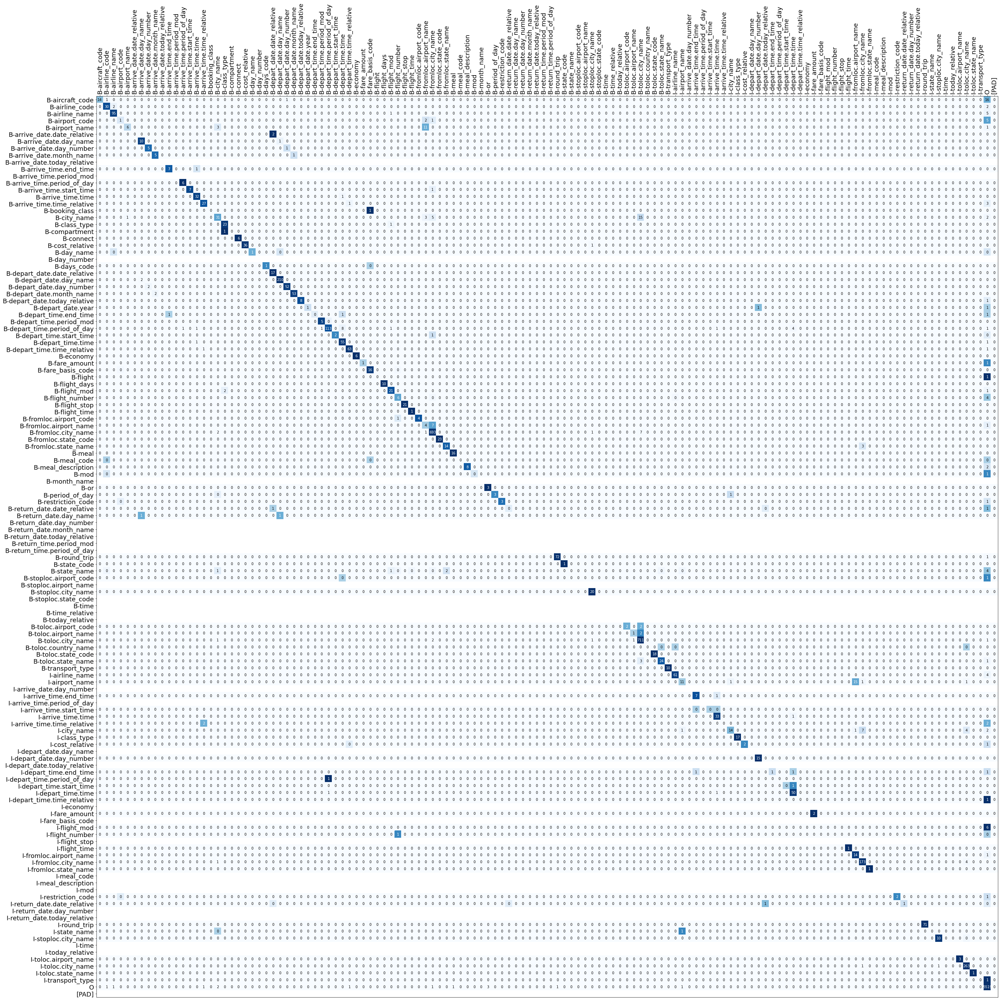

In [ ]:
slot_matrix_ATIS_mean = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_mean/ slot_matrix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_ATIS_norm.shape[0]):
    if np.sum(slot_matrix_ATIS_norm[i]) > 0.0:
        for j in range(slot_matrix_ATIS_norm.shape[1]):
            color = "white" if slot_matrix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

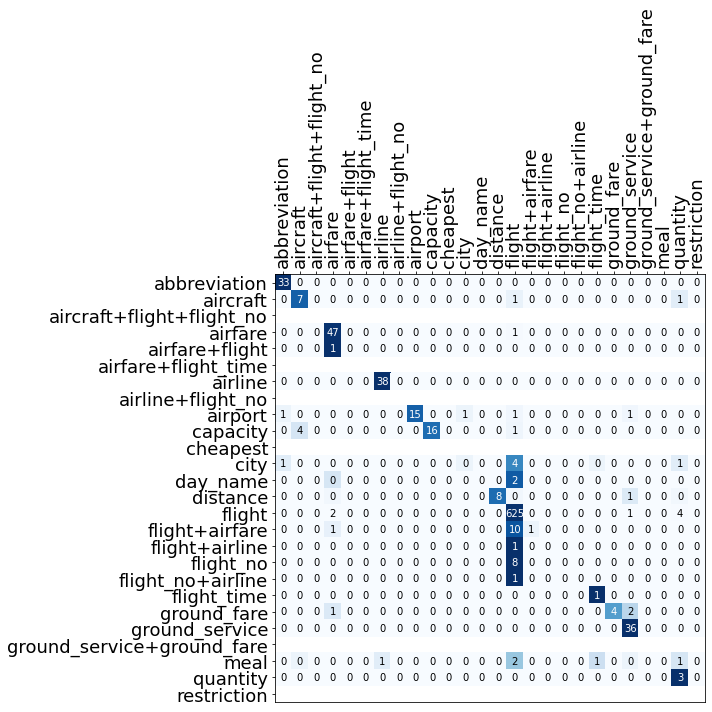

In [ ]:
intent_matrix_ATIS_mean = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_mean/ intent_matrix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_ATIS_norm.shape[0]):
    if np.sum(intent_matrix_ATIS_norm[i]) > 0.0:
        for j in range(intent_matrix_ATIS_norm.shape[1]):
            color = "white" if intent_matrix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_ATIS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_ATIS)

((744,), (744, 200))
((861,), (861, 200))
((708,), (708, 200))
((637,), (637, 200))
((667,), (667, 200))
((649,), (649, 200))
((595,), (595, 200))
((679,), (679, 200))
((520,), (520, 200))
((463,), (463, 200))
((651,), (651, 200))
((564,), (564, 200))
((667,), (667, 200))
((793,), (793, 200))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_ATIS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_ATIS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_ATIS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_ATIS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


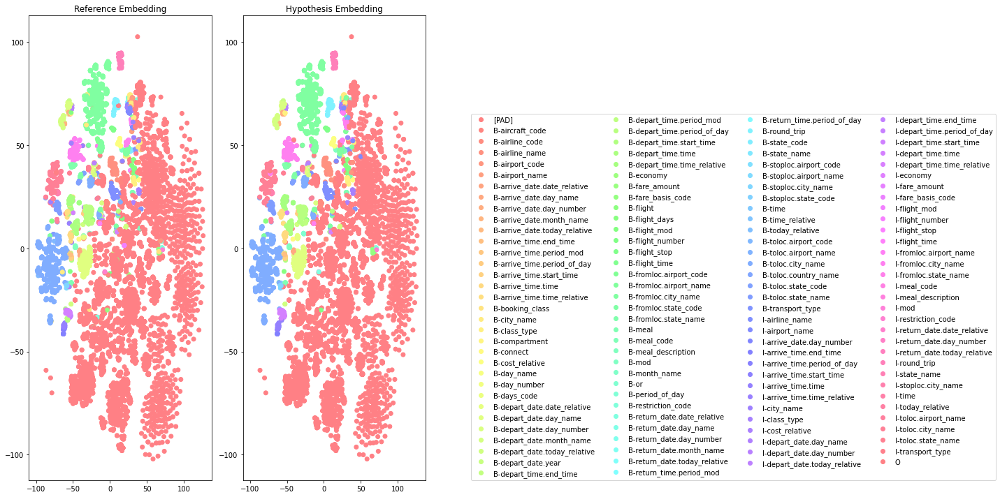

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name = 'baseline_slots_embeddings_ATIS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


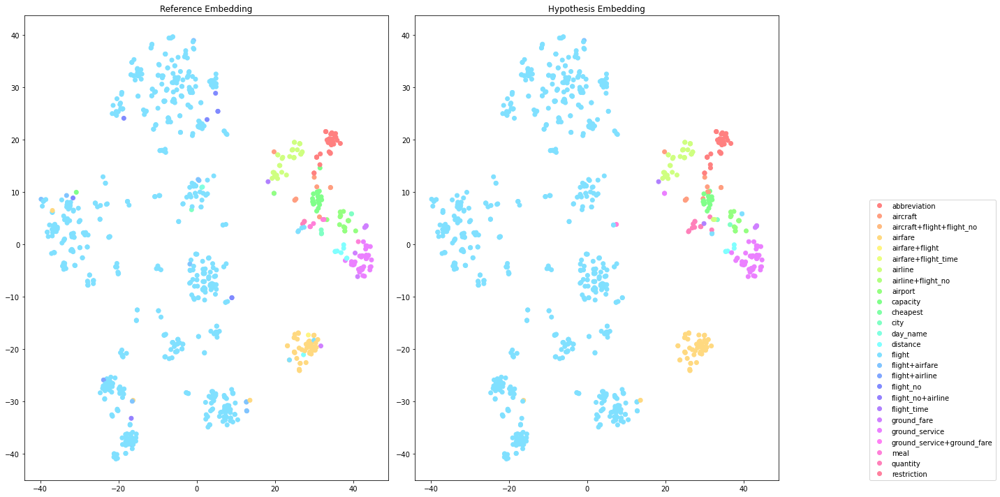

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='baseline_intent_embeddings_ATIS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_ATIS)

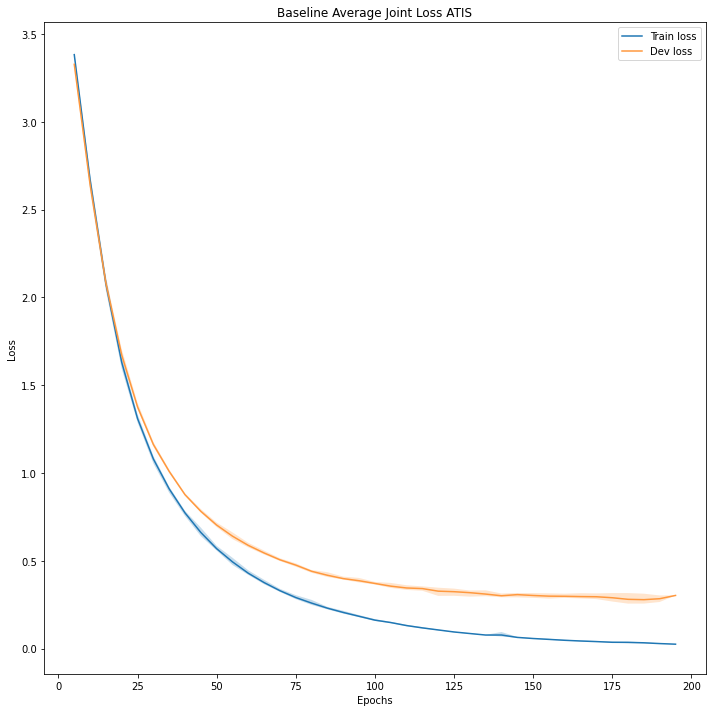

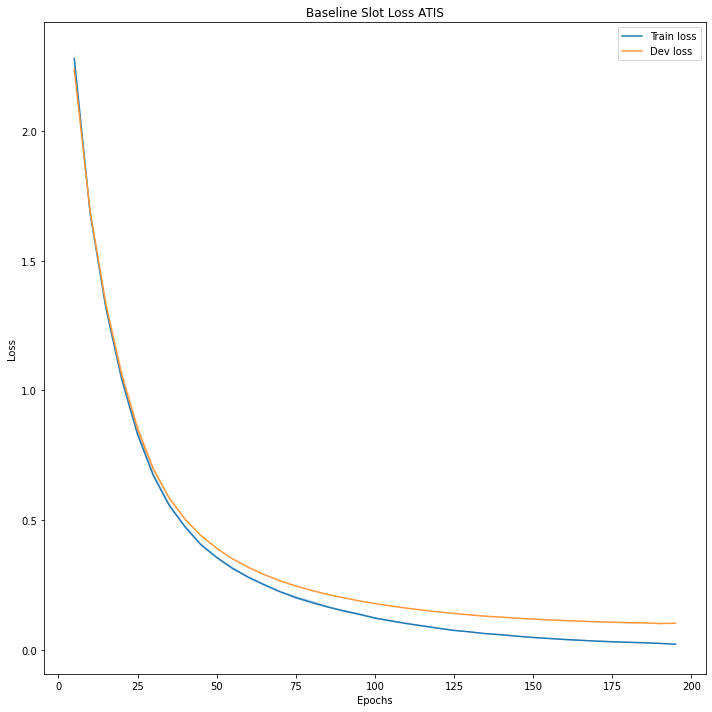

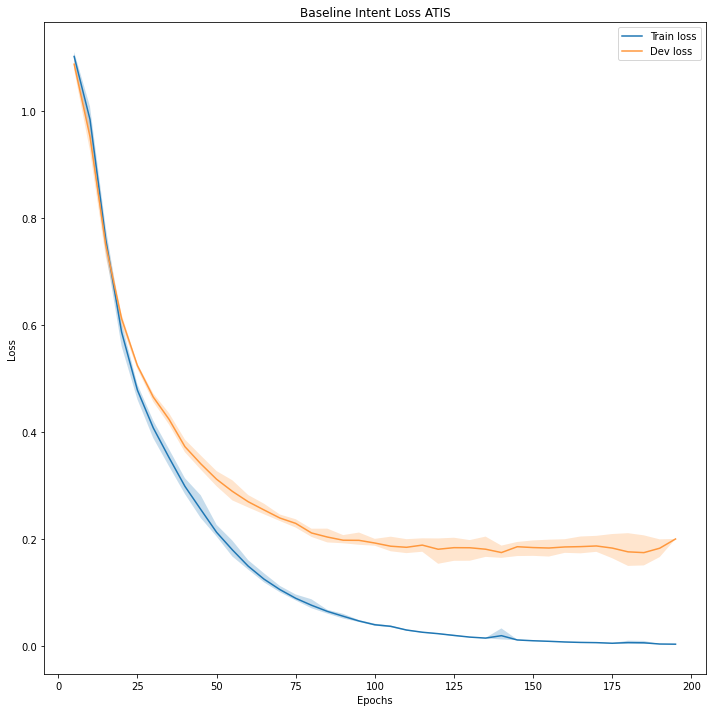

In [ ]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Baseline Average Joint Loss ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Baseline Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Baseline Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_ATIS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': 'on next wednesday flight from kansas city to chicago should '
              'arrive in chicago around 7 pm return flight on thursday'}


In [ ]:
pprint(len(test_slot_errors))

185


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'flight',
 'ref_intent': 'flight+airfare',
 'utterance': 'show flight and prices kansas city to chicago on next wednesday '
              'arriving in chicago by 7 pm'}


In [ ]:
pprint(len(test_intent_errors))

61


#### Remix ATIS

Here is tried a new divison of ATIS, but more balanced, in order to avoid the case of having labels that are present in the test set but not in the train or dev sets.

Train multiple times on remix ATIS

In [ ]:
models, slot_test_remix_ATIS,intent_test_remix_ATIS,losses_train_remix_ATIS,losses_dev_remix_ATIS, slot_matrix_remix_ATIS, intent_matrix_remix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_remix_ATIS,dev_loader_remix_ATIS,test_loader_remix_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

100%|██████████| 199/199 [01:57<00:00,  1.70it/s]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./baseline_remix_ATIS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./baseline_remix_ATIS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_remix_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_remix_ATIS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
state_code,1.000,1.00,1.000,2.0
flight_days,1.000,1.00,1.000,6.0
cost_relative,1.000,1.00,1.000,58.0
day_name,1.000,1.00,1.000,1.0
days_code,1.000,1.00,1.000,1.0
...,...,...,...,...
return_date.date_relative,0.194,0.25,0.217,4.0
return_date.month_name,1.000,0.00,0.000,1.0
return_date.day_number,1.000,0.00,0.000,1.0
meal_code,0.000,0.00,0.000,1.0


Display results on intent classification task

In [ ]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
capacity,1.000,1.000,1.000,6.0
distance,1.000,1.000,1.000,4.0
ground_service,0.978,1.000,0.989,44.0
flight,0.981,0.990,0.986,655.0
weighted avg,0.965,0.967,0.965,893.0
abbreviation,0.932,1.000,0.964,27.0
airline,0.989,0.900,0.941,30.0
airfare,0.919,0.949,0.934,72.0
quantity,0.958,0.875,0.914,8.0
flight_time,1.000,0.833,0.908,8.0


In [ ]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9671519223590893


In [ ]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_remix_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_remix_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.944380373 +- 0.002544121
Intent Acc 0.967151922 +- 0.002301013


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

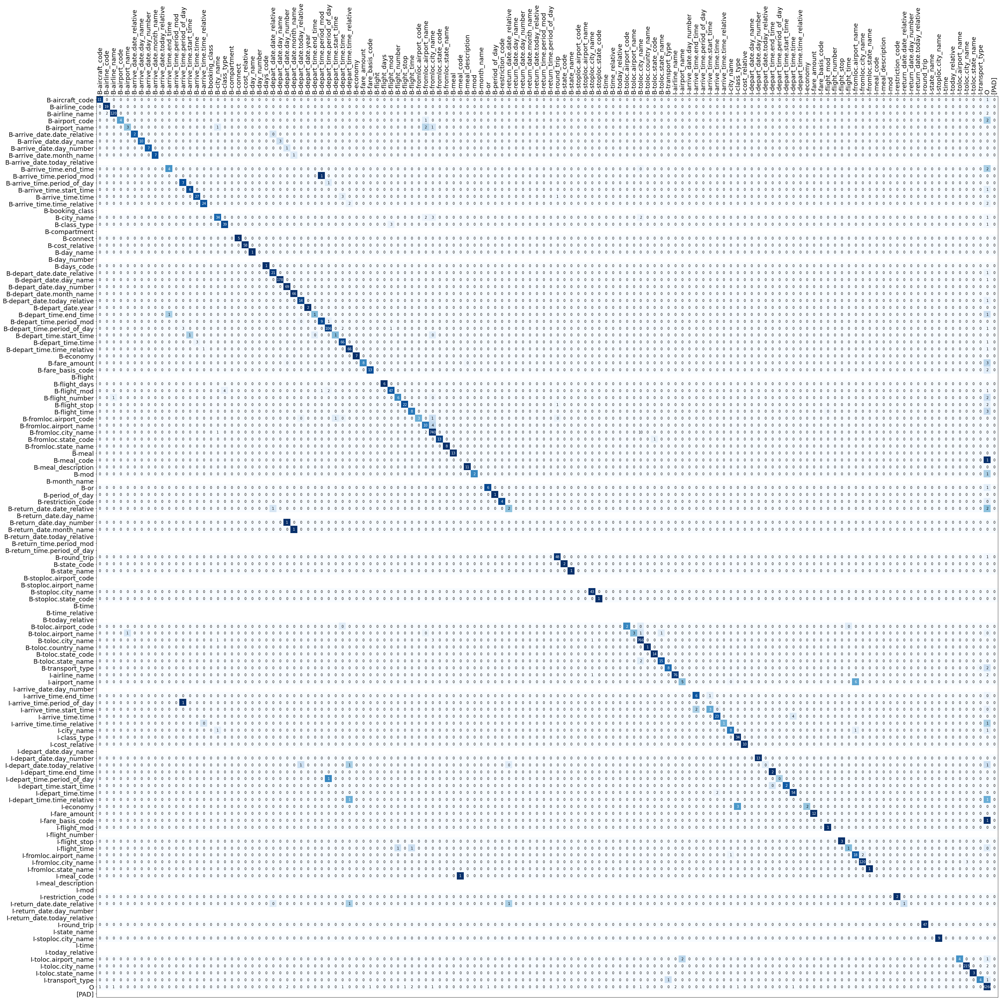

In [ ]:
slot_matrix_remix_ATIS_mean = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_remix_ATIS_norm =  slot_matrix_remix_ATIS_mean/ slot_matrix_remix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_remix_ATIS_norm.shape[0]):
    if np.sum(slot_matrix_remix_ATIS_norm[i]) > 0.0:
        for j in range(slot_matrix_remix_ATIS_norm.shape[1]):
            color = "white" if slot_matrix_remix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_remix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

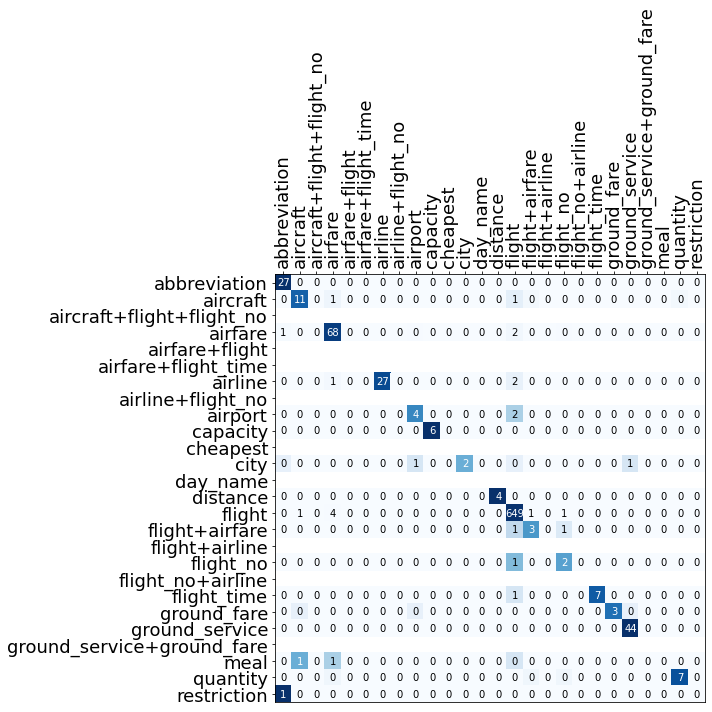

In [ ]:
intent_matrix_remix_ATIS_mean = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_remix_ATIS_norm =  intent_matrix_remix_ATIS_mean/ intent_matrix_remix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_remix_ATIS_norm.shape[0]):
    if np.sum(intent_matrix_remix_ATIS_norm[i]) > 0.0:
        for j in range(intent_matrix_remix_ATIS_norm.shape[1]):
            color = "white" if intent_matrix_remix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_remix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_remix_ATIS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_remix_ATIS)

((709,), (709, 200))
((669,), (669, 200))
((778,), (778, 200))
((674,), (674, 200))
((653,), (653, 200))
((709,), (709, 200))
((699,), (699, 200))
((750,), (750, 200))
((725,), (725, 200))
((755,), (755, 200))
((719,), (719, 200))
((728,), (728, 200))
((723,), (723, 200))
((687,), (687, 200))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_ATIS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_ATIS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_remix_ATIS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_remix_ATIS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


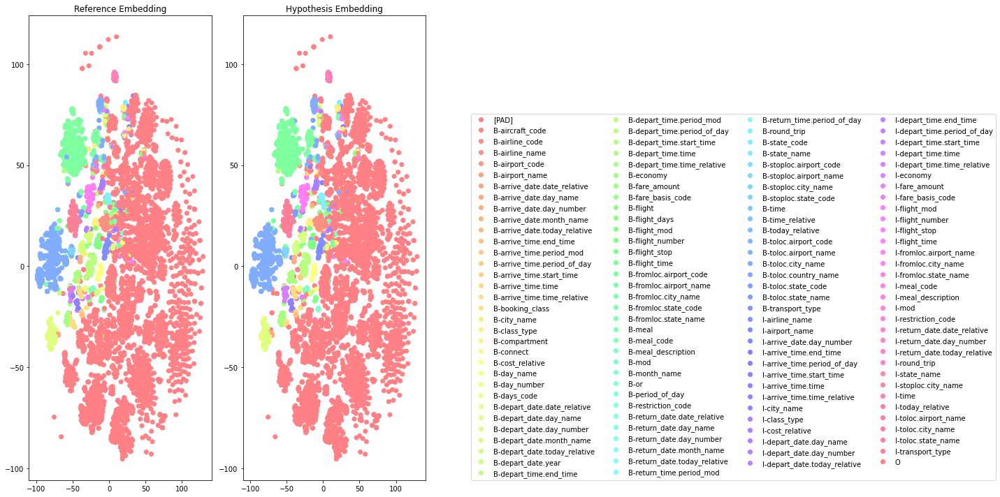

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='baseline_slot_embeddings_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


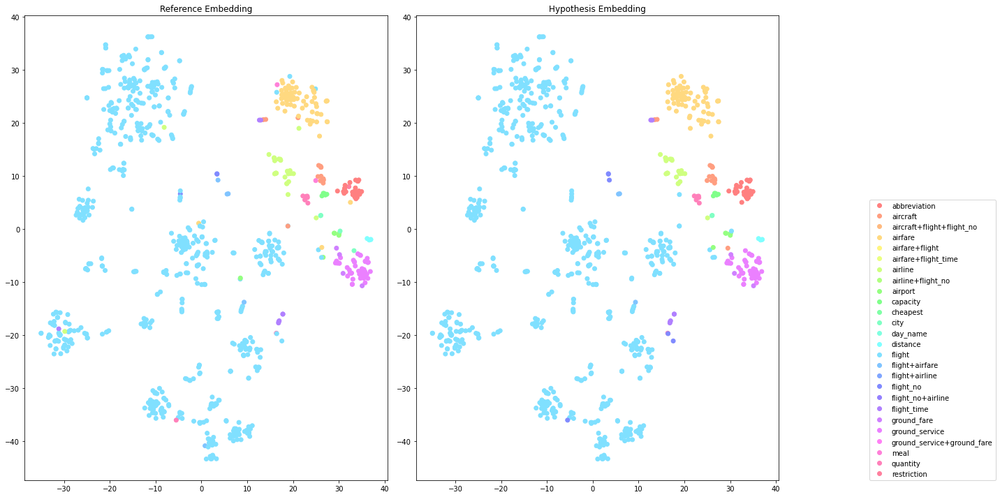

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='baseline_intent_embeddings_remix_ATIS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_remix_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_remix_ATIS)

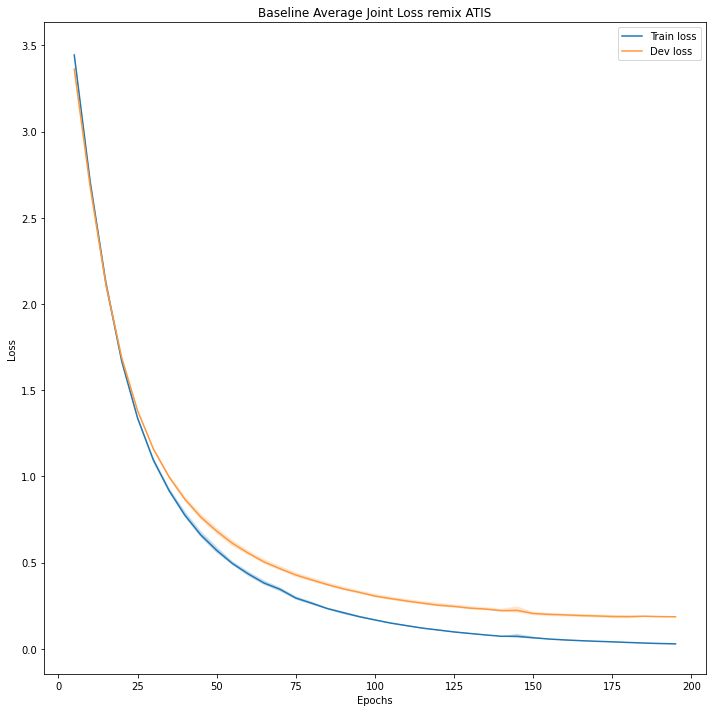

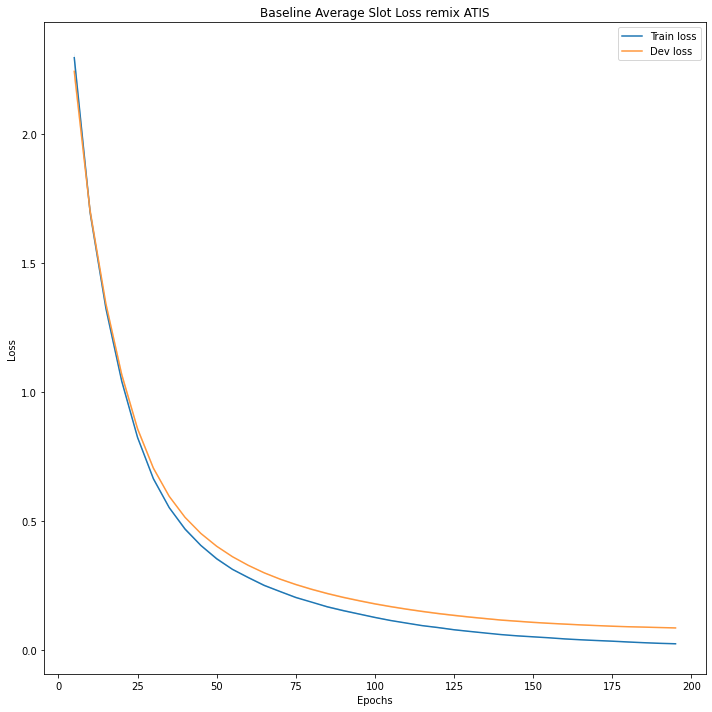

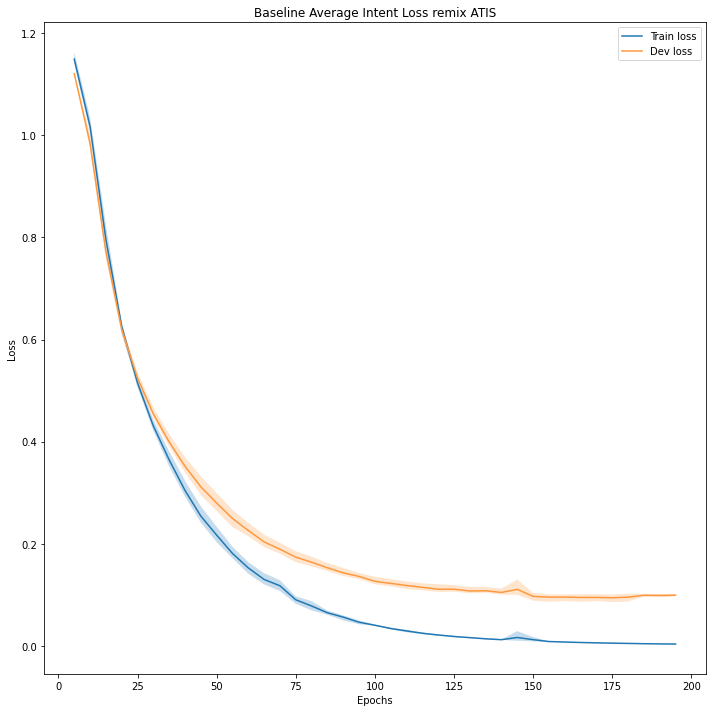

In [ ]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'Baseline Average Joint Loss remix ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'Baseline Average Slot Loss remix ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'Baseline Average Intent Loss remix ATIS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_remix_ATIS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O O B-flight_time O O O B-airline_name O B-airline_name O '
              'I-flight_time O B-depart_date.month_name '
              'B-depart_date.day_number',
 'ref_slots': 'O O O O O B-flight_time O O O B-airline_name O B-airline_name O '
              'B-toloc.airport_code O B-depart_date.month_name '
              'B-depart_date.day_number',
 'utterance': 'could you give me the schedule of flights for american and '
              'delta to dfw on august fifteenth'}


In [ ]:
pprint(len(test_slot_errors))

126


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'airfare',
 'ref_intent': 'airline',
 'utterance': 'show me first class airlines from san francisco to pittsburgh '
              'on next tuesday first class only'}


In [ ]:
pprint(len(test_intent_errors))

27


####SNIPS

Train multiple times on SNIPS

In [ ]:
models, slot_test_SNIPS,intent_test_SNIPS,losses_train_SNIPS,losses_dev_SNIPS, slot_matrix_SNIPS, intent_matrix_SNIPS, = train_multiple(runs,lang_SNIPS,n_epochs,train_loader_SNIPS,dev_loader_SNIPS,test_loader_SNIPS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 52%|█████▏    | 104/199 [02:23<02:10,  1.38s/it]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./baseline_SNIPS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./baseline_SNIPS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_SNIPS_mean = result_mean(slot_test_SNIPS)
intent_test_SNIPS_mean = result_mean(intent_test_SNIPS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_SNIPS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
best_rating,1.000,1.000,1.000,43.0
movie_type,1.000,1.000,1.000,33.0
rating_unit,1.000,0.992,0.996,40.0
condition_temperature,1.000,0.971,0.985,23.0
rating_value,0.975,0.975,0.975,80.0
music_item,0.945,0.990,0.967,104.0
restaurant_type,0.974,0.954,0.964,65.0
current_location,1.000,0.929,0.963,14.0
service,0.958,0.958,0.958,24.0
object_type,0.942,0.969,0.955,162.0


Display results on intent classification task

In [ ]:
intent_test_SNIPS_mean_no_acc = deepcopy(intent_test_SNIPS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_SNIPS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_SNIPS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
RateBook,0.992,0.979,0.985,80.0
BookRestaurant,0.985,0.982,0.984,92.0
AddToPlaylist,0.979,0.984,0.981,124.0
GetWeather,0.971,0.974,0.973,104.0
macro avg,0.961,0.962,0.961,700.0
weighted avg,0.961,0.960,0.960,700.0
PlayMusic,0.910,0.981,0.944,86.0
SearchScreeningEvent,0.967,0.919,0.943,107.0
SearchCreativeWork,0.921,0.913,0.917,107.0


In [ ]:
pprint(intent_test_SNIPS_mean['accuracy'])

0.9604761904761906


In [ ]:
slot_f1s_SNIPS = np.asarray([f['total']['f'] for f in slot_test_SNIPS])
intent_acc_SNIPS = np.asarray([f['accuracy'] for f in intent_test_SNIPS])
print('Slot F1', round(slot_f1s_SNIPS.mean(),9), '+-', round(slot_f1s_SNIPS.std(),9))
print('Intent Acc', round(intent_acc_SNIPS.mean(), 9), '+-', round(intent_acc_SNIPS.std(), 9))

Slot F1 0.802712328 +- 0.004677691
Intent Acc 0.96047619 +- 0.004714045


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

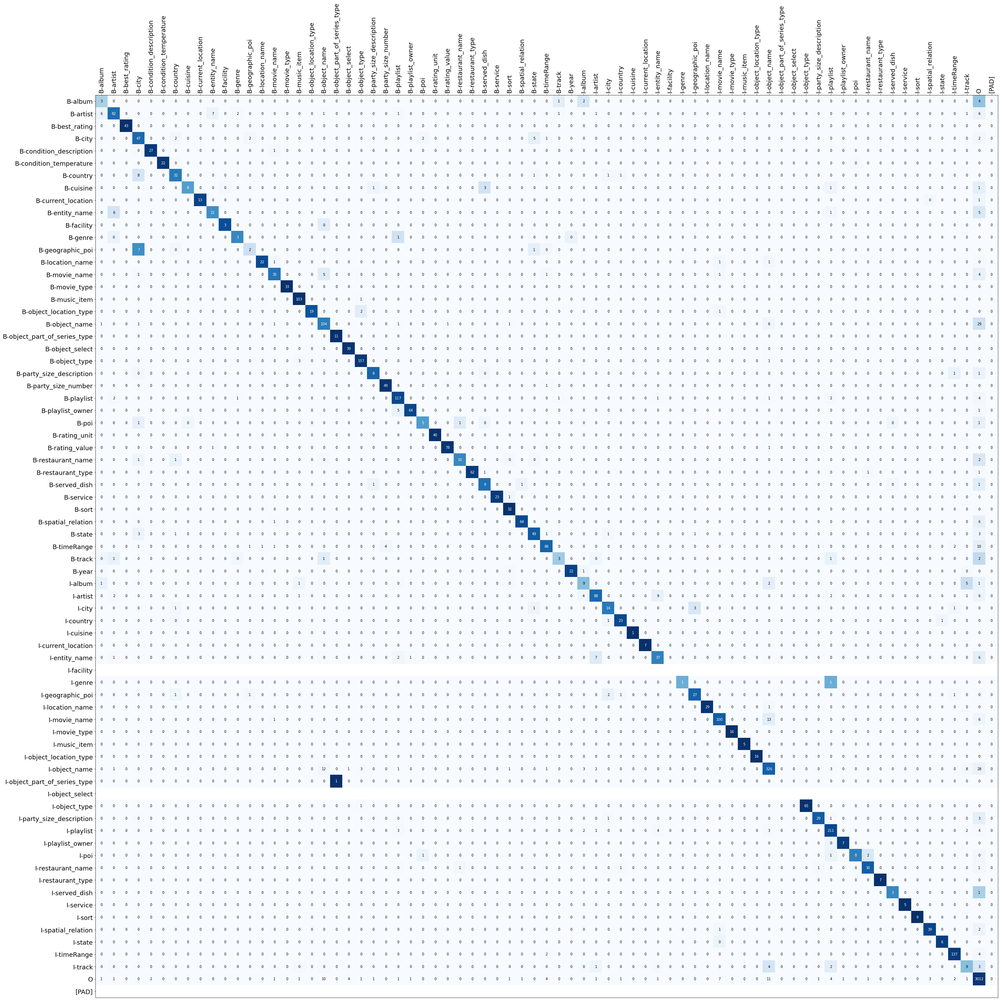

In [ ]:
slot_matrix_SNIPS_mean = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_mean/ slot_matrix_SNIPS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_SNIPS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_SNIPS_norm.shape[0]):
    if np.sum(slot_matrix_SNIPS_norm[i]) > 0.0:
        for j in range(slot_matrix_SNIPS_norm.shape[1]):
            color = "white" if slot_matrix_SNIPS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_SNIPS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_slot_SNIPS')

<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

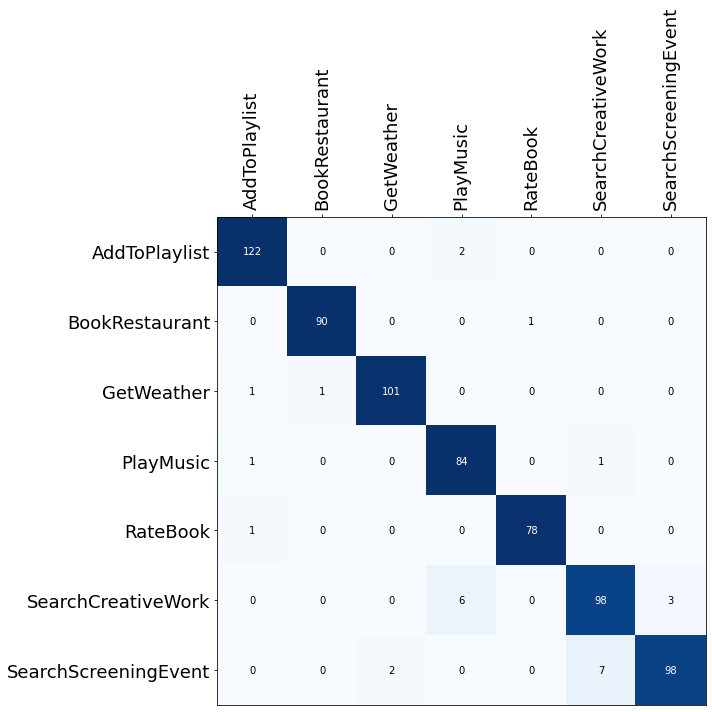

In [ ]:
intent_matrix_SNIPS_mean = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_mean/ intent_matrix_SNIPS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_SNIPS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_SNIPS_norm.shape[0]):
    if np.sum(intent_matrix_SNIPS_norm[i]) > 0.0:
        for j in range(intent_matrix_SNIPS_norm.shape[1]):
            color = "white" if intent_matrix_SNIPS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_SNIPS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_baseline_intent_SNIPS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_SNIPS)

((576,), (576, 200))
((551,), (551, 200))
((580,), (580, 200))
((599,), (599, 200))
((599,), (599, 200))
((610,), (610, 200))
((616,), (616, 200))
((566,), (566, 200))
((564,), (564, 200))
((550,), (550, 200))
((543,), (543, 200))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_SNIPS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_SNIPS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_SNIPS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_SNIPS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


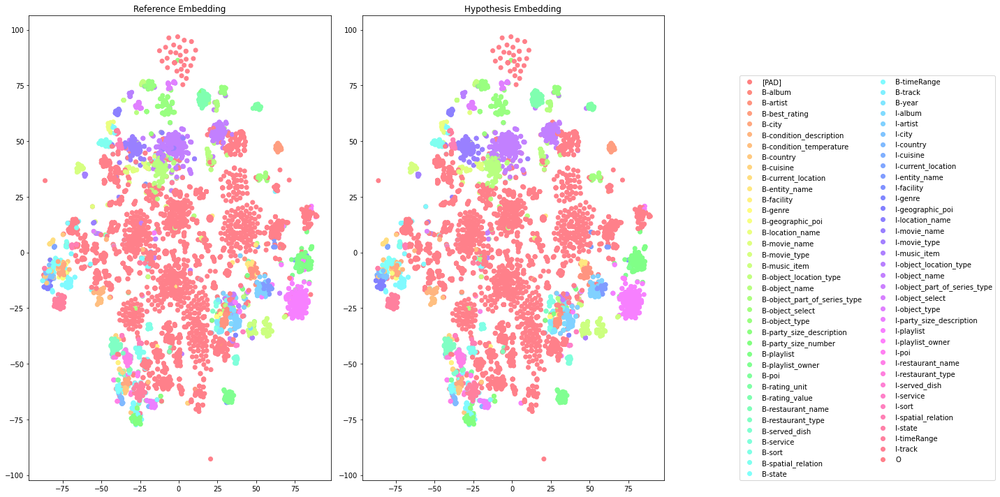

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='baseline_slot_embeddings_SNIPS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


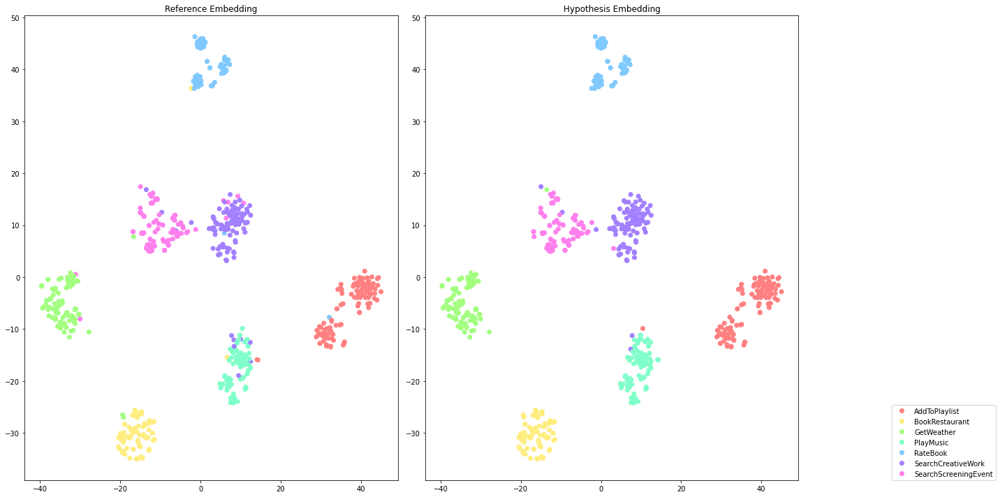

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='baseline_intent_embeddings_SNIPS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_SNIPS = numpy_fillna(losses_train_SNIPS)
losses_dev_SNIPS = numpy_fillna(losses_dev_SNIPS)

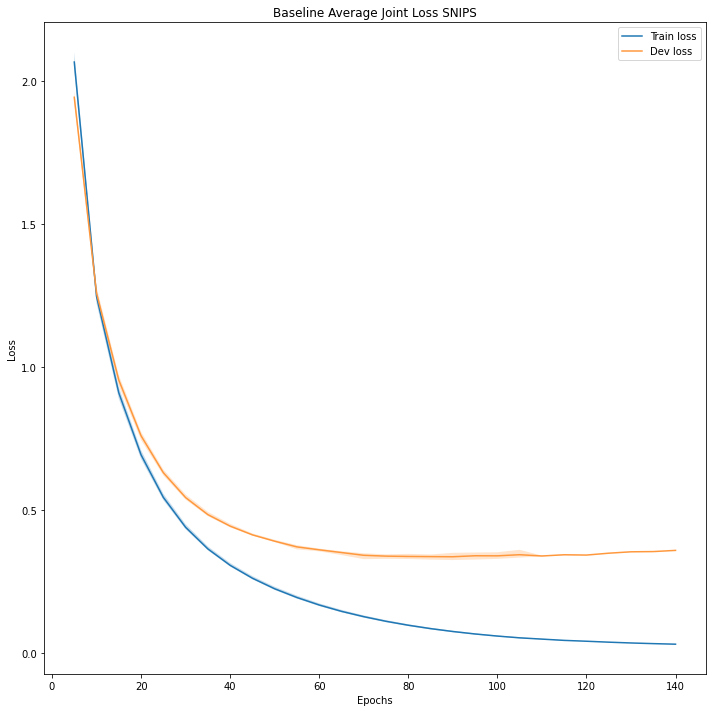

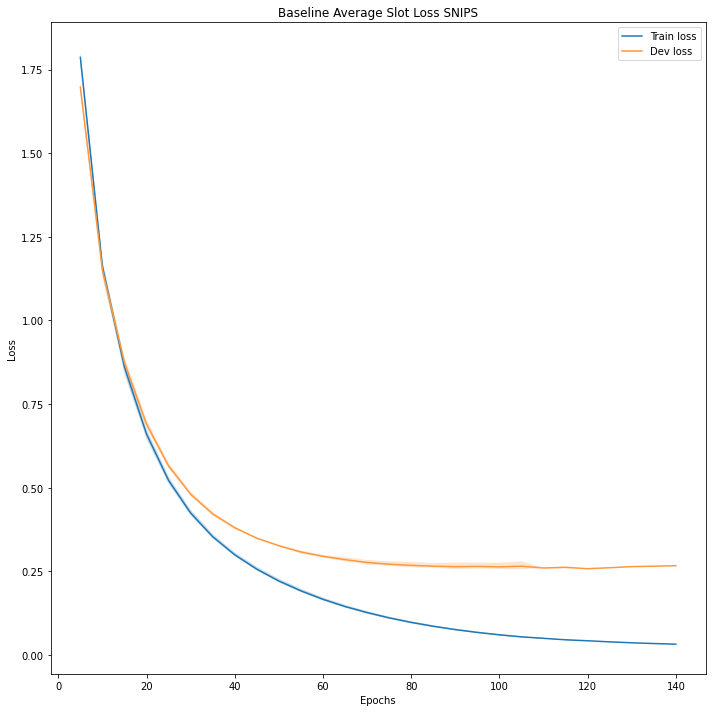

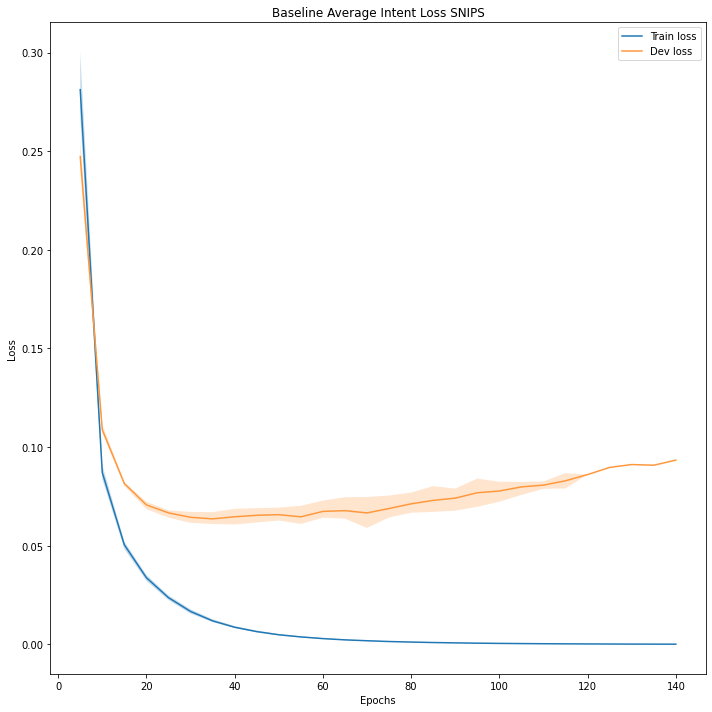

In [ ]:
plot_loss(losses_train_SNIPS[:,:,0],losses_dev_SNIPS[:,:,0],sample_rate,'Baseline Average Joint Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,1],losses_dev_SNIPS[:,:,1],sample_rate,'Baseline Average Slot Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,2],losses_dev_SNIPS[:,:,2],sample_rate,'Baseline Average Intent Loss SNIPS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_SNIPS,test_loader_SNIPS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O O O O O O B-city B-country I-country I-geographic_poi '
              'I-geographic_poi I-geographic_poi O B-timeRange I-timeRange '
              'I-timeRange I-timeRange',
 'ref_slots': 'O O O O O O O O O B-geographic_poi I-geographic_poi '
              'I-geographic_poi I-geographic_poi I-geographic_poi '
              'I-geographic_poi O B-timeRange I-timeRange I-timeRange '
              'I-timeRange',
 'utterance': 'what is the weather going to be like in [UNK] gold rush '
              'national historical park on february the 28th 2034'}


In [ ]:
pprint(len(test_slot_errors))

245


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'PlayMusic',
 'ref_intent': 'BookRestaurant',
 'utterance': 'on june 27 2026 i d like to go to a delaware gastropub'}


In [ ]:
pprint(len(test_intent_errors))

30


#Proposal 1: biLSTM + Pseudo Randomly Weighted Loss + Focal Loss

A slighlty improved LSTM over the baseline model:

- bidirectional LSTM
- increased size of embedding
- increased size of hidden
- increased number of layers for the LSTM
- layer normalization
- dropout
- better early stopping criteria, on both losses instead of slot filling f1 score
- increase number of epochs ( which is not a problem due to early stopping )

Plus:

- Randomly Weighted Loss
- Focal Loss

However it uses a pseudo randomly weighting, with the higher weight applied to the higher loss. This should help improve the results, as higher losses will be weighted more and therefore the model should learn better


BiLSTM.svg

In [ ]:
class ModelBiLSTM(nn.Module):

  def __init__(self, hid_size, out_slot, out_int, emb_size, vocab_len, n_layer=1, pad_index=0):
      super(ModelBiLSTM, self).__init__()
      ##emb_size = word embedding size
      ##hid_size = hidden size
      ##out_slot = output size for slot filling
      ##out_int = ouput size for intent class
      self.embedding = nn.Embedding(vocab_len, emb_size, padding_idx=pad_index)
      self.utt_encoder = nn.LSTM(emb_size, hid_size, n_layer, bidirectional=True)
      ##layer normalization
      self.layer_norm_slot = nn.LayerNorm(hid_size*2)
      ##layer normalization
      self.layer_norm_intent = nn.LayerNorm(hid_size)
      ##apply dropout before last layers
      self.dropout = nn.Dropout(0.1) 
      ##twice because it is a biLSTM, and i use the utt_encoded
      self.slot_out = nn.Linear(hid_size*2, out_slot)
      ##only once because i use only last hidden layer
      self.intent_out = nn.Linear(hid_size, out_int)
      self.leaky_relu = nn.LeakyReLU()
  def forward(self, utterance, seq_lengths,features=False):
      utt_emb = self.embedding(utterance)
      utt_emb = utt_emb.permute(1,0,2) 
      ##pack_padded_sequence avoid computation over pad tokens reducing the computational cost
      packed_input = pack_padded_sequence(utt_emb, seq_lengths.cpu().numpy())
      ##Process the batch
      packed_output, (last_hidden, cell) = self.utt_encoder(packed_input) 
      ##Unpack the sequence
      utt_encoded, input_sizes = pad_packed_sequence(packed_output)
      ##Get the last hidden state
      last_hidden = last_hidden[-1,:,:]
      ##Compute slot filling with dropout

      slots = self.layer_norm_slot(utt_encoded)
      slots = self.dropout(slots)
      slots = self.slot_out(slots)
      slots = slots.permute(1,2,0)

      ##Compute intent classification with dropout
      intent = self.layer_norm_intent(last_hidden)
      intent = self.dropout(intent)
      intent = self.intent_out(intent)
      if features:
          return slots,intent,utt_encoded.permute(1,0,2),last_hidden
      else:
          return slots, intent

### Focal loss 


Because the datasets are very uneven, particularly on ATIS, for the two tasks, the easiest predictions are `flight` and `O`. 

Therefore a simple model can just guess `flight` and `O` and not learn other labels. 

Focal loss solves this issue, by weighting differently examples based on their difficulty. Easy examples have a small loss, whereas harder examples have a higher loss. 

$ FL = -\alpha(1-P_t)^\gamma log(P_t) $

https://gist.github.com/f1recracker/0f564fd48f15a58f4b92b3eb3879149b




In [ ]:
# https://gist.github.com/f1recracker/0f564fd48f15a58f4b92b3eb3879149b

import torch
import torch.nn as nn
import torch.nn.functional as F

class FocalLoss(nn.CrossEntropyLoss):
    ''' Focal loss for classification tasks on imbalanced datasets '''

    def __init__(self, gamma, alpha=None, ignore_index=-100, reduction='none'):
        super().__init__(weight=alpha, ignore_index=ignore_index, reduction='none')
        self.reduction = reduction
        self.gamma = gamma

    def forward(self, input_, target):
        cross_entropy = super().forward(input_, target)
        ##Temporarily mask out ignore index to '0' for valid gather-indices input.
        ##This won't contribute final loss as the cross_entropy contribution
        ##for these would be zero.
        target = target * (target != self.ignore_index).long()
        input_prob = torch.gather(F.softmax(input_, 1), 1, target.unsqueeze(1))
        loss = torch.pow(1 - input_prob, self.gamma) * cross_entropy
        return torch.mean(loss) if self.reduction == 'mean' else torch.sum(loss) if self.reduction == 'sum' else loss

###Train Loop and Evaluation Loop
Two functions `train_loop()` and `evaluate_loop()` one for training the model and the other for evaluating it.

To compute the performances on the slot filling task it will used the evaluate function from the **conll script**, while for the intent classification **classification_report** from scikitlearn. 

In [ ]:
def train_loop(data, optimizer, criterion_slots, criterion_intents,clip, model):
    '''
    function to train the model

    input
    - data : dataset
    - optimizer : optimizer 
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - model : model to be trained

    output
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    '''
    model.train()
    loss_array = []

    for sample in data:
        optimizer.zero_grad() ##Zeroing the gradient
        slots, intent = model(sample['utterances'], sample['slots_len'])
        loss_intent = criterion_intents(intent, sample['intents'])
        loss_slot = criterion_slots(slots, sample['y_slots'])
        weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
        torch.sort(weight)
        if loss_slot<loss_intent:
            loss = weight[0]*loss_slot+ weight[1]*loss_intent
        else: 
            loss = weight[0]*loss_intent+ weight[1]*loss_slot
        loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
        loss.backward() ##Compute the gradient
        ##clip the gradient to avoid explosioning gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)  
        optimizer.step() ##Update the weights
    return np.asarray(loss_array)

def eval_loop(data, criterion_slots, criterion_intents, model, lang):
    '''
    function to evaluate the model
    
    input
    - data : dataset
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - model : model to be trained
    - lang : language class Lang used for the dataset

    output
    - results_slot : evaluation of slot filling using conll evaluate,
    - report_intent: evaluation of intent classification using scikitlearn classification report,
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    - matrix_slot: confusion matrix on slot filling
    - matrix_intent confusion matrix on intent classification
    '''
    model.eval()
    loss_array = []
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    #softmax = nn.Softmax(dim=1) ##Use Softmax if you need the actual probability
    with torch.no_grad(): ##It used to avoid the creation of computational graph
        for sample in data:
            slots, intents = model(sample['utterances'], sample['slots_len'])
            loss_intent = criterion_intents(intents, sample['intents'])
            loss_slot = criterion_slots(slots, sample['y_slots'])
            weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
            torch.sort(weight)
            if loss_slot<loss_intent:
                loss = weight[0]*loss_slot+ weight[1]*loss_intent
            else: 
                loss = weight[0]*loss_intent+ weight[1]*loss_slot
            loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
            
            ##Intent inference
            out_intents = [lang.id2intent[x] 
                           for x in torch.argmax(intents, dim=1).tolist()] 
            gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
            ref_intents.extend(gt_intents)
            hyp_intents.extend(out_intents)
            
            ##Slot inference 
            output_slots = torch.argmax(slots, dim=1)
            for id_seq, seq in enumerate(output_slots):
                length = sample['slots_len'].tolist()[id_seq]
                utt_ids = sample['utterance'][id_seq][:length].tolist()
                gt_ids = sample['y_slots'][id_seq].tolist()
                gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
                utterance = [lang.id2word[elem] for elem in utt_ids]
                to_decode = seq[:length].tolist()
                ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
                tmp_seq = []
                for id_el, elem in enumerate(to_decode):
                    ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                    tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
                hyp_slots.append(tmp_seq)
    try:            
        results_slot = evaluate(ref_slots, hyp_slots)
    except Exception as ex:
        ##Sometimes the model predics a class that is not in REF
        print(ex)
        ref_s = set([x[1] for x in ref_slots])
        hyp_s = set([x[1] for x in hyp_slots])
        print(hyp_s.difference(ref_s))
        
    report_intent = classification_report(ref_intents, hyp_intents, 
                                          zero_division=False, output_dict=True)
    
    matrix_slot = confusion_matrix([token[1] for sent in ref_slots for token in sent], [token[1] for sent in hyp_slots for token in sent],labels=list(lang.slot2id.keys()))
    matrix_intent = confusion_matrix(ref_intents, hyp_intents,labels=list(lang.intent2id.keys()))
    
    return results_slot, report_intent, np.asarray(loss_array), matrix_slot, matrix_intent


In [ ]:
def train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to train a model using patience as early stopping.
    input
    - model : model to be trained
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - losses_train : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    '''
    ##list of recorded losses
    losses_train = []
    losses_dev = []
    ##list of epochs that were sampled for validation
    sampled_epochs = []
    ##early stopping on joint loss
    best_loss_slot,best_loss_intent = float('inf'),float('inf')
    ##patience
    patience_intent,patience_slot = patience,patience
    for x in tqdm(range(1,n_epochs)):
        ##train
        loss = train_loop(train_loader, optimizer, criterion_slots, criterion_intents,clip, model)
        ##every sample rate
        if x % sample_rate == 0:
            ##record epoch
            sampled_epochs.append(x)
            ##record losses on train ( 3 loss array)
            losses_train.append(loss.mean(axis=0))
            ##record losses on dev (3 loss array )
            slot_dev, intent_dev, loss_dev,_,_ = eval_loop(dev_loader, criterion_slots, criterion_intents, model, lang)
            losses_dev.append(loss_dev.mean(axis=0))
            ##early stopping considering mean joint loss on dev set
            if loss_dev.mean(axis=0)[1] < best_loss_slot:
                best_loss_slot = loss_dev.mean(axis=0)[1]
            else:
                patience_slot -= 1
            if loss_dev.mean(axis=0)[2] < best_loss_intent:
                best_loss_intent = loss_dev.mean(axis=0)[2]
            else:
                patience_intent -= 1
            if patience_slot <= 0 and patience_intent <=0:
                break 
    return losses_train,losses_dev

In [ ]:
def train_multiple(runs,lang,n_epochs,train_loader,dev_loader,test_loader,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to a model using patience as early stopping multiple times
    input
    - runs: number of runs
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - test_loader : test set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - models : list of models trained
    - results_slots : a list of evaluation of slot filling using conll evaluate of length runs,
    - reports_intents: a list of evaluation of intent classification using scikitlearn classification report of length runs,
    - losses_train_mul : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev_mul : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - matrix_slot: a list of confusion matrixes on slot filling of length runs
    - matrix_intent: a list confusion matrixes on intent classification of length runs
    '''
    out_slot = len(lang.slot2id)
    out_int = len(lang.intent2id)
    vocab_len = len(lang.word2id)
    ##list of test results
    results_slots, results_intents = [],[]
    ##list of losses through the run
    losses_train_mul = []
    losses_dev_mul = []
    ##models
    models = []
    slot_matrix = np.zeros((runs,out_slot,out_slot))
    intent_matrix = np.zeros((runs,out_int,out_int))
    for x in range(0, runs):
        model = ModelBiLSTM(hid_size, out_slot, out_int, emb_size, vocab_len,n_layer=n_layer, pad_index=PAD_TOKEN).to(device)
        model.apply(init_weights)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        ##train
        losses_train,losses_dev = train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate)
        losses_train_mul.append(losses_train)
        losses_dev_mul.append(losses_dev)
        ##test results
        slot_test, intent_test, loss_test, slot_m, intent_m = eval_loop(test_loader, criterion_slots, criterion_intents, model, lang)
        slot_matrix[x] += slot_m
        intent_matrix[x] += intent_m
        results_slots.append(slot_test)
        results_intents.append(intent_test)
        models.append(model)
    return models,results_slots,results_intents,losses_train_mul,losses_dev_mul,slot_matrix,intent_matrix

In [ ]:
# error function to test the model and sample the predictions used for error
def eval_loop_complete(model, lang, data):
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    for sample in data:
        ##Intent inference
        slots,intents = model.forward(sample['utterances'],sample['slots_len'])

        out_intents = [lang.id2intent[x] 
                        for x in torch.argmax(intents, dim=1).tolist()] 
        gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
        ref_intents.extend(gt_intents)
        hyp_intents.extend(out_intents)

        ##Slot inference 
        output_slots = torch.argmax(slots, dim=1)
        for id_seq, seq in enumerate(output_slots):
            length = sample['slots_len'].tolist()[id_seq]
            # i need ignore the [CLS] and [SEP] tokens!
            utt_ids = sample['utterance'][id_seq][:length].tolist()
            gt_ids = sample['y_slots'][id_seq].tolist()
            gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
            utterance = [lang.id2word[elem] for elem in utt_ids]
            to_decode = seq[:length].tolist()
            ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
            tmp_seq = []
            for id_el, elem in enumerate(to_decode):
                ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
            hyp_slots.append(tmp_seq)
    return ref_slots,hyp_slots,ref_intents,hyp_intents,
                

###Training

To have reliable results on small corpora train and test the model will be done several times over. At the end, the results are averaged.

In [ ]:
##parameters for training
hid_size = 300
emb_size = 400
n_layer = 4
lr = 0.0001 ##learning rate
clip = 5 ##Clip the gradient
runs = 3 ##runs
n_epochs = 200 ##epochs for each run
patience_max = 5 ##patience for early stopping for each run. Computed every sample_rate steps
sample_rate = 5
criterion_slots = FocalLoss(gamma=2,reduction='sum',ignore_index=PAD_TOKEN)
criterion_intents =  FocalLoss(gamma=2,reduction='sum')

####ATIS

Train multiple times on ATIS

In [ ]:
models, slot_test_ATIS,intent_test_ATIS,losses_train_ATIS,losses_dev_ATIS, slot_matrix_ATIS, intent_matrix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_ATIS,dev_loader_ATIS,test_loader_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 37%|███▋      | 74/199 [02:59<05:02,  2.42s/it]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./BiLSTM_ATIS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./BiLSTM_ATIS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_ATIS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
fromloc.airport_code,1.0,1.0,1.0,5.0
flight_time,1.0,1.0,1.0,1.0
state_code,1.0,1.0,1.0,1.0
flight_stop,1.0,1.0,1.0,21.0
arrive_date.date_relative,1.0,1.0,1.0,2.0
...,...,...,...,...
booking_class,1.0,0.0,0.0,1.0
depart_date.year,1.0,0.0,0.0,3.0
stoploc.airport_code,1.0,0.0,0.0,1.0
toloc.country_name,1.0,0.0,0.0,1.0


Display results on intent classification task

In [ ]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
flight_time,1.000,1.000,1.000,1.0
ground_service,0.982,1.000,0.991,36.0
airline,0.976,1.000,0.987,38.0
abbreviation,1.000,0.949,0.973,33.0
flight,0.951,0.990,0.970,632.0
capacity,1.000,0.937,0.967,21.0
airfare,0.946,0.958,0.952,48.0
weighted avg,0.940,0.949,0.940,893.0
aircraft,0.867,0.889,0.875,9.0
airport,0.940,0.796,0.859,18.0


In [ ]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9488615154908548


In [ ]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.945866056 +- 0.000686076
Intent Acc 0.948861515 +- 0.005357484


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

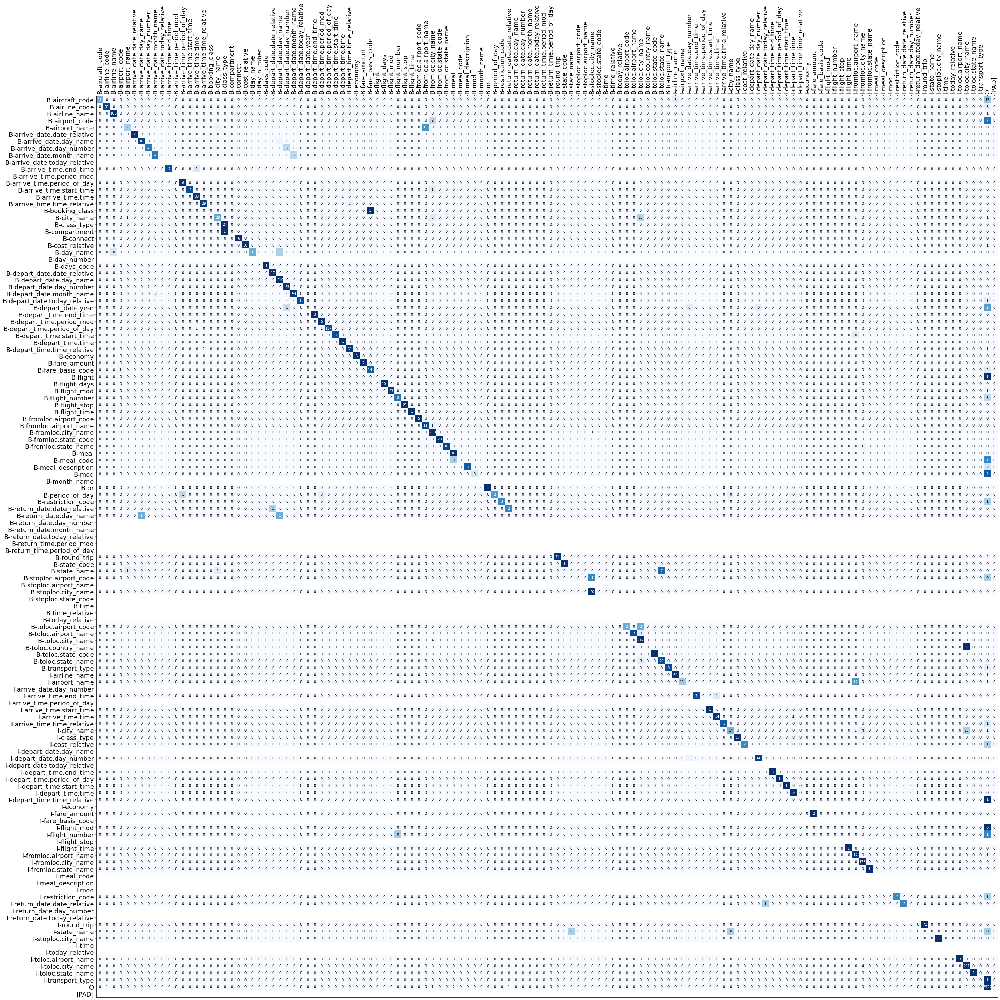

In [ ]:
slot_matrix_ATIS_mean = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_mean/ slot_matrix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_ATIS_norm.shape[0]):
    if np.sum(slot_matrix_ATIS_norm[i]) > 0.0:
        for j in range(slot_matrix_ATIS_norm.shape[1]):
            color = "white" if slot_matrix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

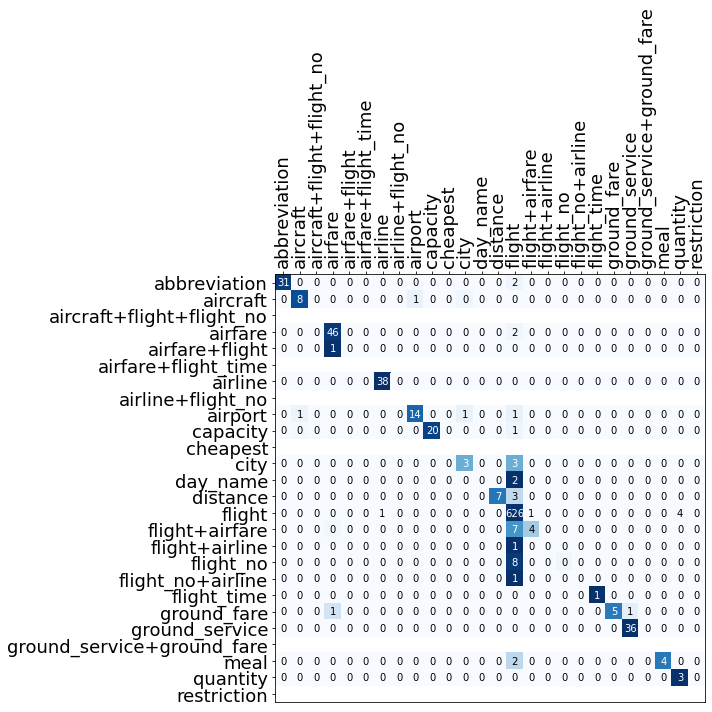

In [ ]:
intent_matrix_ATIS_mean = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_mean/ intent_matrix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_ATIS_norm.shape[0]):
    if np.sum(intent_matrix_ATIS_norm[i]) > 0.0:
        for j in range(intent_matrix_ATIS_norm.shape[1]):
            color = "white" if intent_matrix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_ATIS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_ATIS)

((744,), (744, 600))
((861,), (861, 600))
((708,), (708, 600))
((637,), (637, 600))
((667,), (667, 600))
((649,), (649, 600))
((595,), (595, 600))
((679,), (679, 600))
((520,), (520, 600))
((463,), (463, 600))
((651,), (651, 600))
((564,), (564, 600))
((667,), (667, 600))
((793,), (793, 600))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_ATIS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_ATIS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_ATIS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_ATIS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


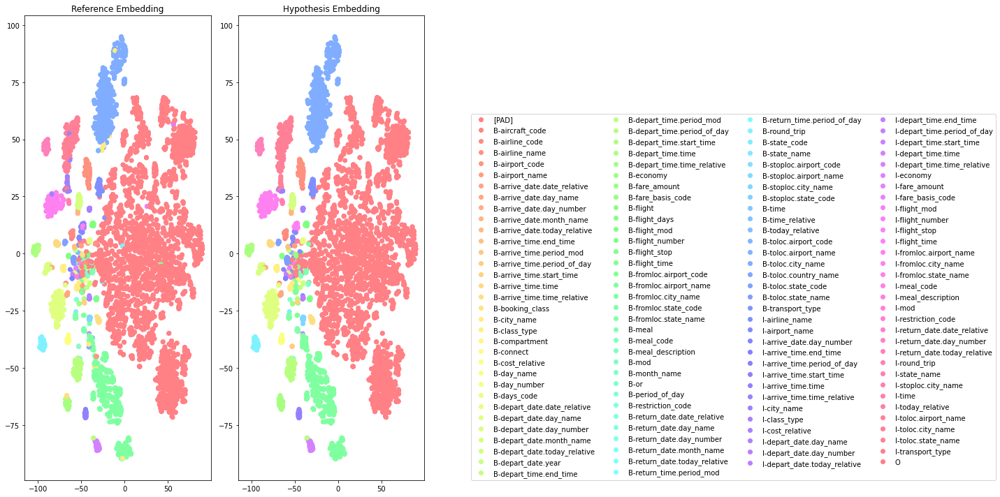

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='BiLSTM_slot_embeddings_ATIS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


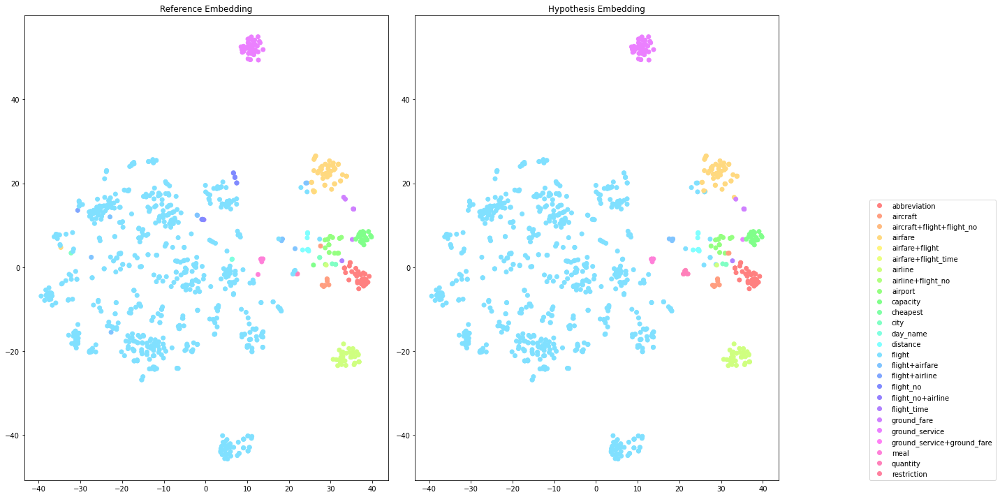

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='BiLSTM_intent_embeddings_ATIS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_ATIS)

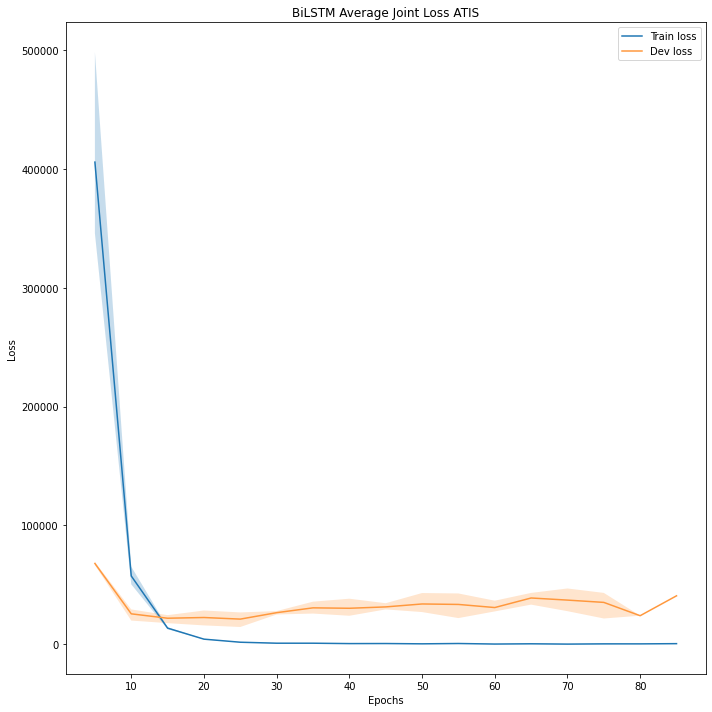

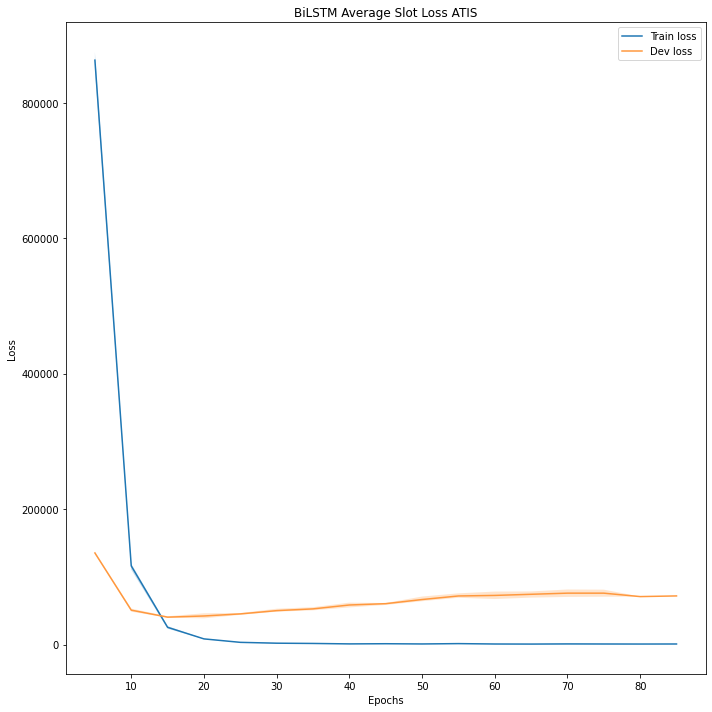

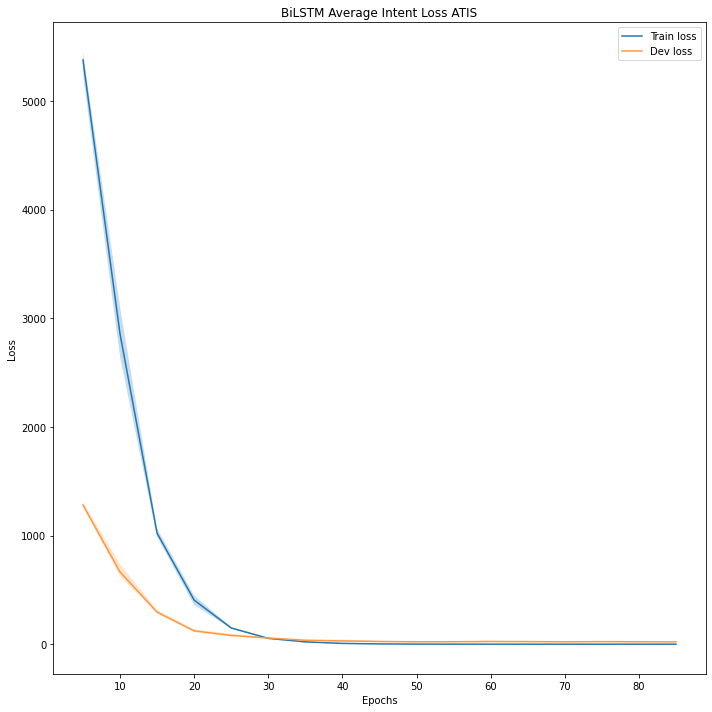

In [ ]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'BiLSTM Average Joint Loss ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'BiLSTM Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'BiLSTM Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_ATIS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': 'on next wednesday flight from kansas city to chicago should '
              'arrive in chicago around 7 pm return flight on thursday'}


In [ ]:
pprint(len(test_slot_errors))

138


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'flight',
 'ref_intent': 'flight+airfare',
 'utterance': 'show flight and prices kansas city to chicago on next wednesday '
              'arriving in chicago by 7 pm'}


In [ ]:
pprint(len(test_intent_errors))

39


#### Remix ATIS

Here is tried a new divison of ATIS, but more balanced, in order to avoid the case of having labels that are present in the test set but not in the train or dev sets.

Train multiple times on remix ATIS

In [ ]:
models, slot_test_remix_ATIS,intent_test_remix_ATIS,losses_train_remix_ATIS,losses_dev_remix_ATIS, slot_matrix_remix_ATIS, intent_matrix_remix_ATIS, = train_multiple(runs,lang_ATIS,n_epochs,train_loader_remix_ATIS,dev_loader_remix_ATIS,test_loader_remix_ATIS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 37%|███▋      | 74/199 [02:58<05:01,  2.41s/it]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./BiLSTM_remix_ATIS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./BiLSTM_remix_ATIS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_remix_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_remix_ATIS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
return_date.month_name,1.000,1.000,1.000,1.0
return_date.day_number,1.000,1.000,1.000,1.0
flight_days,1.000,1.000,1.000,6.0
day_name,1.000,1.000,1.000,1.0
arrive_date.date_relative,1.000,1.000,1.000,2.0
...,...,...,...,...
airport_name,0.786,0.750,0.767,8.0
return_date.date_relative,0.633,0.833,0.719,4.0
fromloc.airport_code,1.000,0.556,0.711,6.0
meal_code,0.000,0.000,0.000,1.0


Display results on intent classification task

In [ ]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
capacity,1.000,1.000,1.000,6.0
distance,1.000,1.000,1.000,4.0
flight,0.978,0.995,0.986,655.0
ground_service,0.992,0.977,0.985,44.0
weighted avg,0.971,0.972,0.971,893.0
abbreviation,0.930,0.988,0.958,27.0
airline,1.000,0.900,0.947,30.0
airfare,0.940,0.931,0.935,72.0
quantity,1.000,0.875,0.933,8.0
airport,1.000,0.833,0.909,6.0


In [ ]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9723777528928705


In [ ]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_remix_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_remix_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.975198398 +- 0.000677555
Intent Acc 0.972377753 +- 0.000527889


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

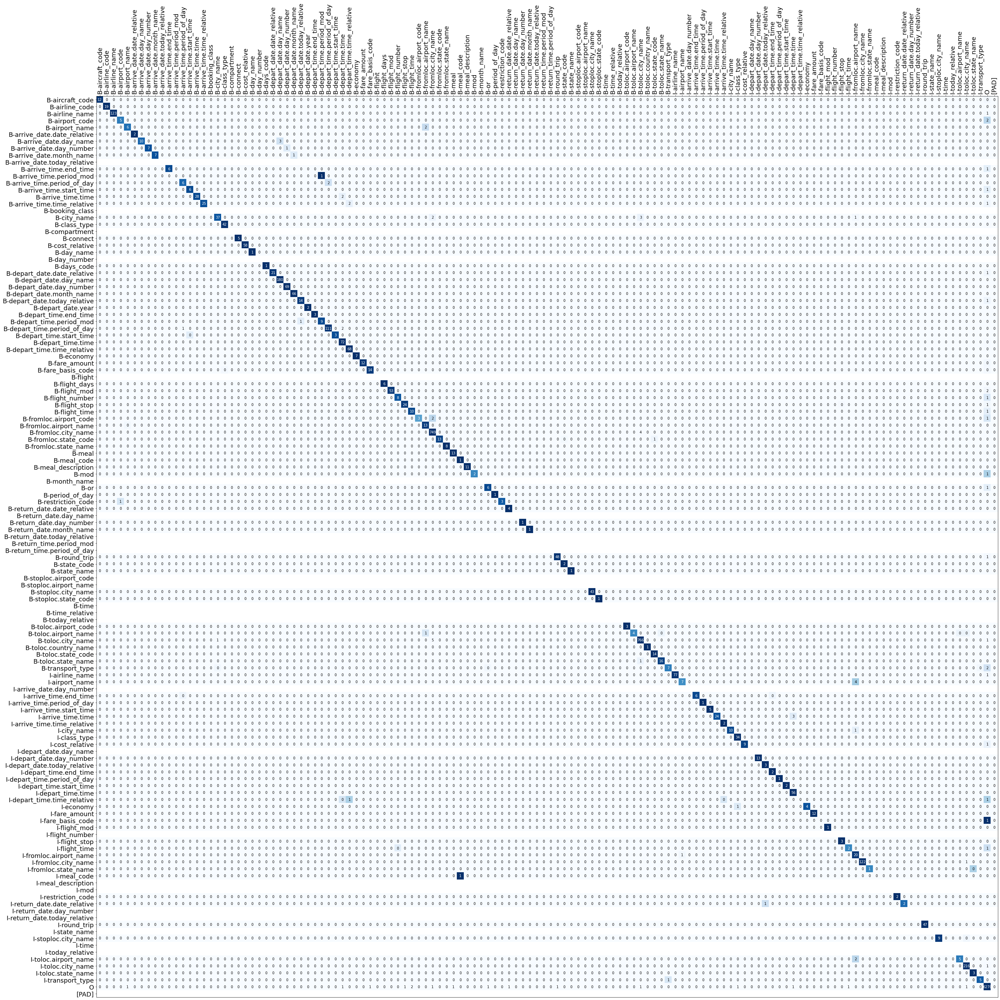

In [ ]:
slot_matrix_remix_ATIS_mean = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_remix_ATIS_norm =  slot_matrix_remix_ATIS_mean/ slot_matrix_remix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_remix_ATIS_norm.shape[0]):
    if np.sum(slot_matrix_remix_ATIS_norm[i]) > 0.0:
        for j in range(slot_matrix_remix_ATIS_norm.shape[1]):
            color = "white" if slot_matrix_remix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_remix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

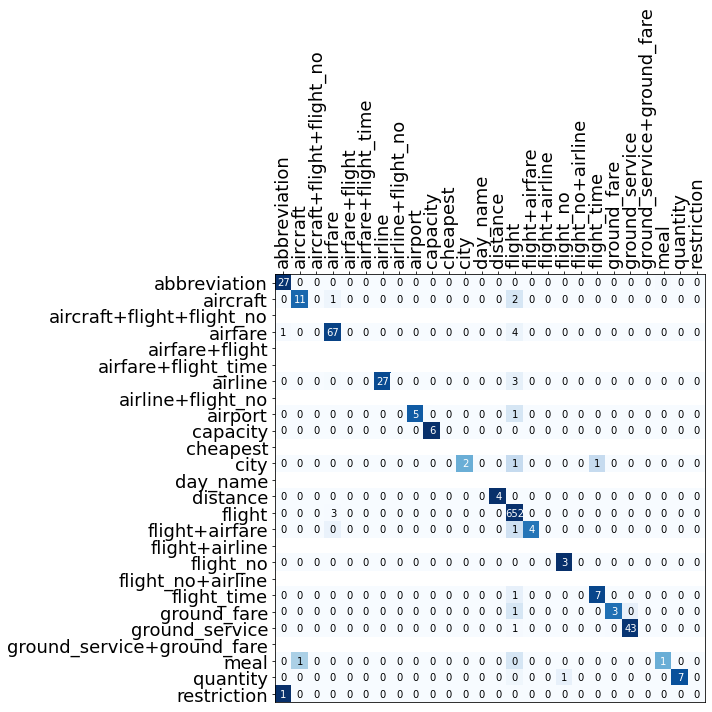

In [ ]:
intent_matrix_remix_ATIS_mean = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_remix_ATIS_norm =  intent_matrix_remix_ATIS_mean/ intent_matrix_remix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_remix_ATIS_norm.shape[0]):
    if np.sum(intent_matrix_remix_ATIS_norm[i]) > 0.0:
        for j in range(intent_matrix_remix_ATIS_norm.shape[1]):
            color = "white" if intent_matrix_remix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_remix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_remix_ATIS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_remix_ATIS)

((709,), (709, 600))
((669,), (669, 600))
((778,), (778, 600))
((674,), (674, 600))
((653,), (653, 600))
((709,), (709, 600))
((699,), (699, 600))
((750,), (750, 600))
((725,), (725, 600))
((755,), (755, 600))
((719,), (719, 600))
((728,), (728, 600))
((723,), (723, 600))
((687,), (687, 600))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_ATIS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_ATIS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_remix_ATIS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_remix_ATIS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


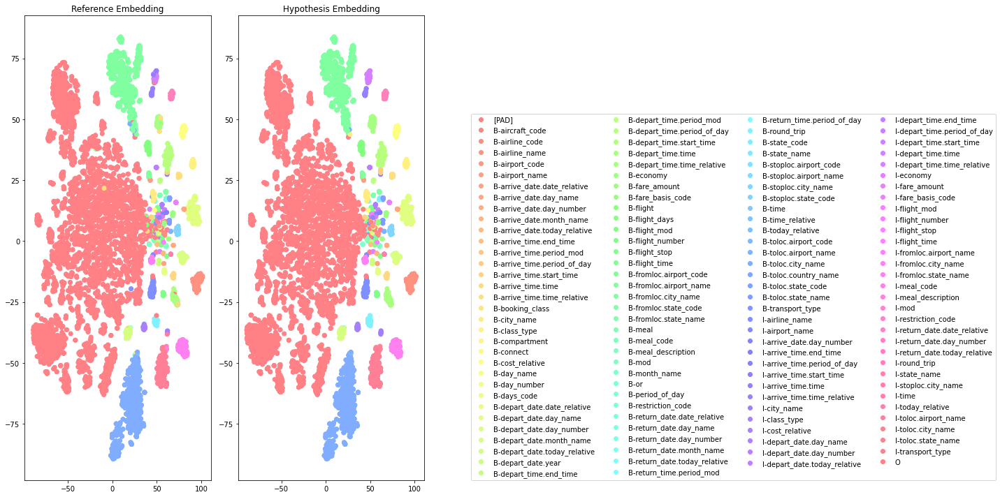

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='BiLSTM_slot_embeddings_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


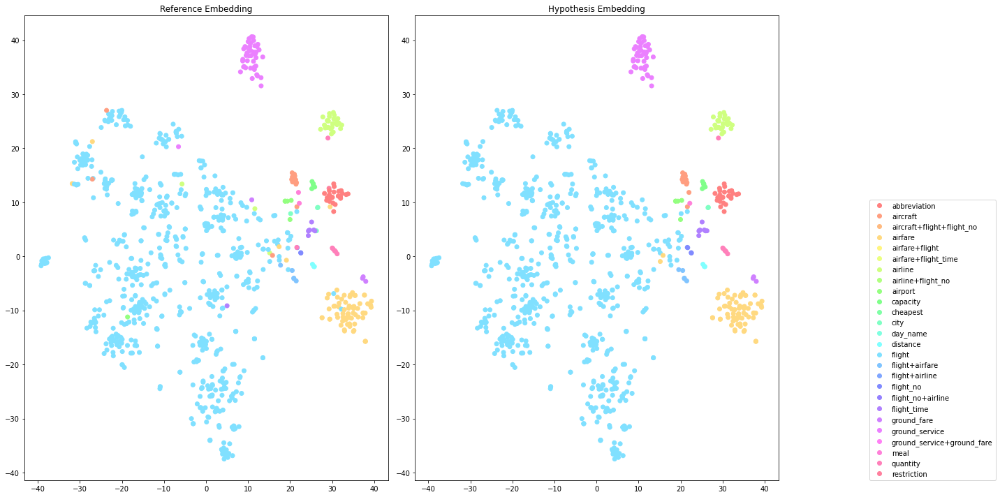

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='BiLSTM_intent_embeddings_remix_ATIS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_remix_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_remix_ATIS)

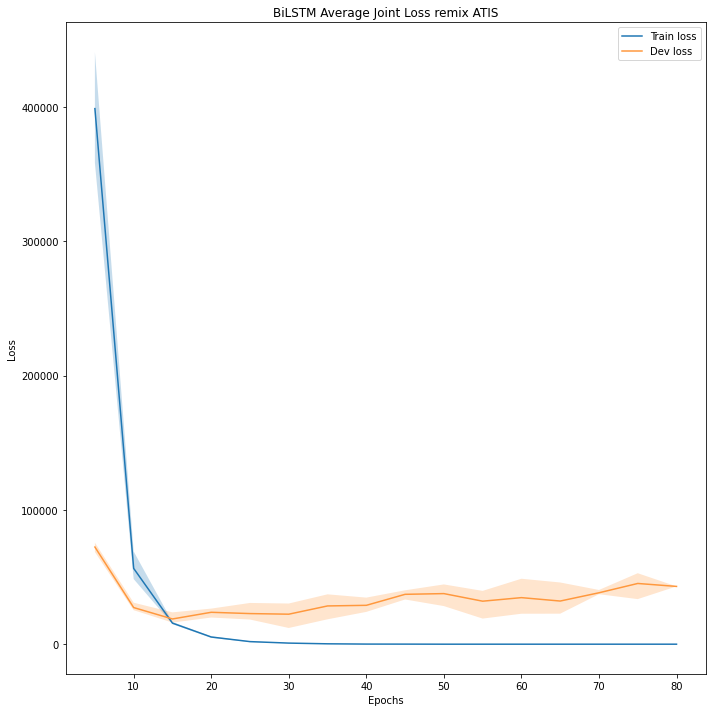

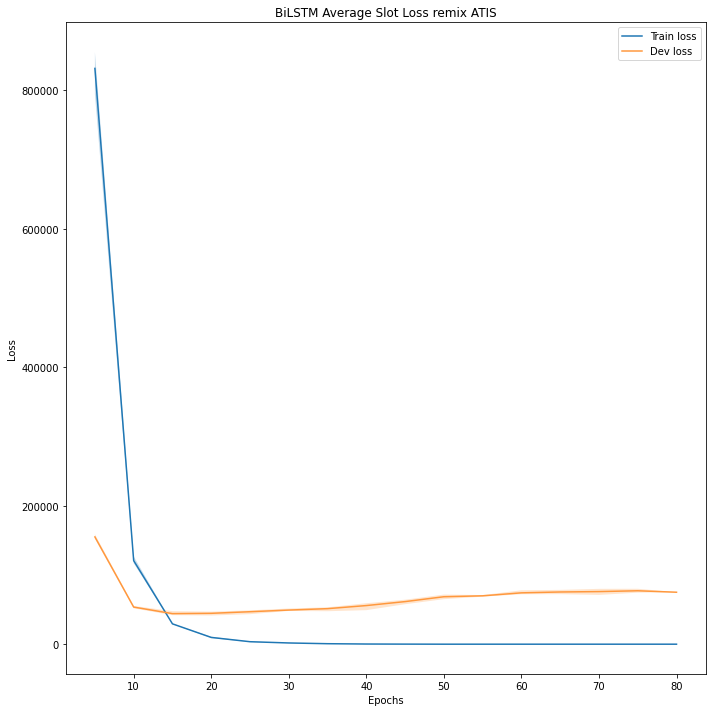

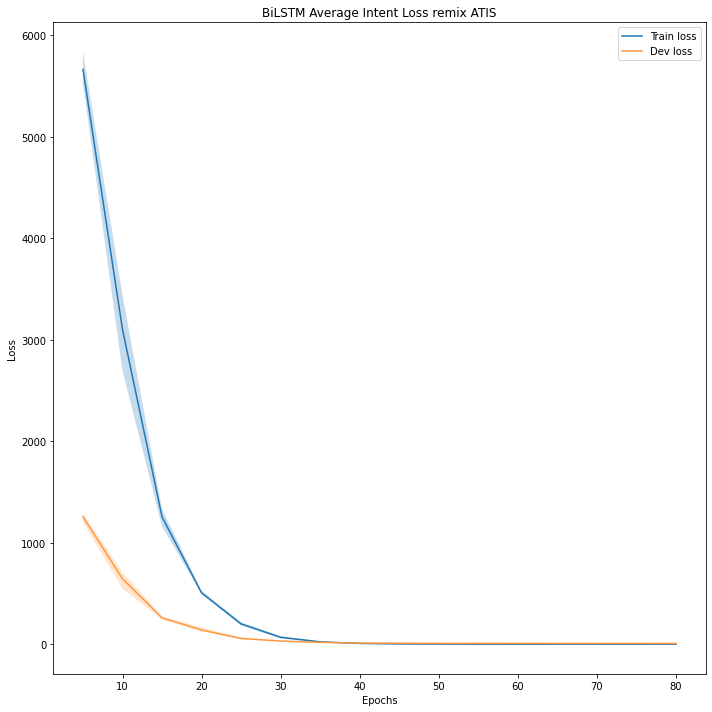

In [ ]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'BiLSTM Average Joint Loss remix ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'BiLSTM Average Slot Loss remix ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'BiLSTM Average Intent Loss remix ATIS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_ATIS,test_loader_ATIS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': 'on next wednesday flight from kansas city to chicago should '
              'arrive in chicago around 7 pm return flight on thursday'}


In [ ]:
pprint(len(test_slot_errors))

13


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'flight',
 'ref_intent': 'flight+airfare',
 'utterance': 'show flight and prices kansas city to chicago on next wednesday '
              'arriving in chicago by 7 pm'}


In [ ]:
pprint(len(test_intent_errors))

4


####SNIPS

Train multiple times on SNIPS

In [ ]:
models, slot_test_SNIPS,intent_test_SNIPS,losses_train_SNIPS,losses_dev_SNIPS, slot_matrix_SNIPS, intent_matrix_SNIPS, = train_multiple(runs,lang_SNIPS,n_epochs,train_loader_SNIPS,dev_loader_SNIPS,test_loader_SNIPS,criterion_slots,criterion_intents,clip,patience_max,sample_rate)

 27%|██▋       | 54/199 [04:40<12:32,  5.19s/it]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./BiLSTM_SNIPS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./BiLSTM_SNIPS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_SNIPS_mean = result_mean(slot_test_SNIPS)
intent_test_SNIPS_mean = result_mean(intent_test_SNIPS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_SNIPS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
best_rating,1.000,1.000,1.000,43.0
movie_type,1.000,1.000,1.000,33.0
rating_unit,1.000,1.000,1.000,40.0
party_size_number,0.993,1.000,0.997,50.0
rating_value,0.992,0.996,0.994,80.0
object_location_type,0.986,1.000,0.993,22.0
playlist_owner,0.986,0.995,0.991,70.0
current_location,1.000,0.976,0.988,14.0
service,0.963,1.000,0.980,24.0
condition_temperature,0.972,0.986,0.978,23.0


Display results on intent classification task

In [ ]:
intent_test_SNIPS_mean_no_acc = deepcopy(intent_test_SNIPS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_SNIPS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_SNIPS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
RateBook,0.992,0.992,0.992,80.0
AddToPlaylist,0.992,0.987,0.989,124.0
GetWeather,0.990,0.981,0.986,104.0
BookRestaurant,0.975,0.986,0.980,92.0
macro avg,0.962,0.963,0.962,700.0
weighted avg,0.963,0.961,0.962,700.0
PlayMusic,0.926,0.965,0.945,86.0
SearchScreeningEvent,0.973,0.900,0.935,107.0
SearchCreativeWork,0.887,0.928,0.907,107.0


In [ ]:
pprint(intent_test_SNIPS_mean['accuracy'])

0.9614285714285714


In [ ]:
slot_f1s_SNIPS = np.asarray([f['total']['f'] for f in slot_test_SNIPS])
intent_acc_SNIPS = np.asarray([f['accuracy'] for f in intent_test_SNIPS])
print('Slot F1', round(slot_f1s_SNIPS.mean(),9), '+-', round(slot_f1s_SNIPS.std(),9))
print('Intent Acc', round(intent_acc_SNIPS.mean(), 9), '+-', round(intent_acc_SNIPS.std(), 9))

Slot F1 0.870573474 +- 0.001099665
Intent Acc 0.961428571 +- 0.005832118


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

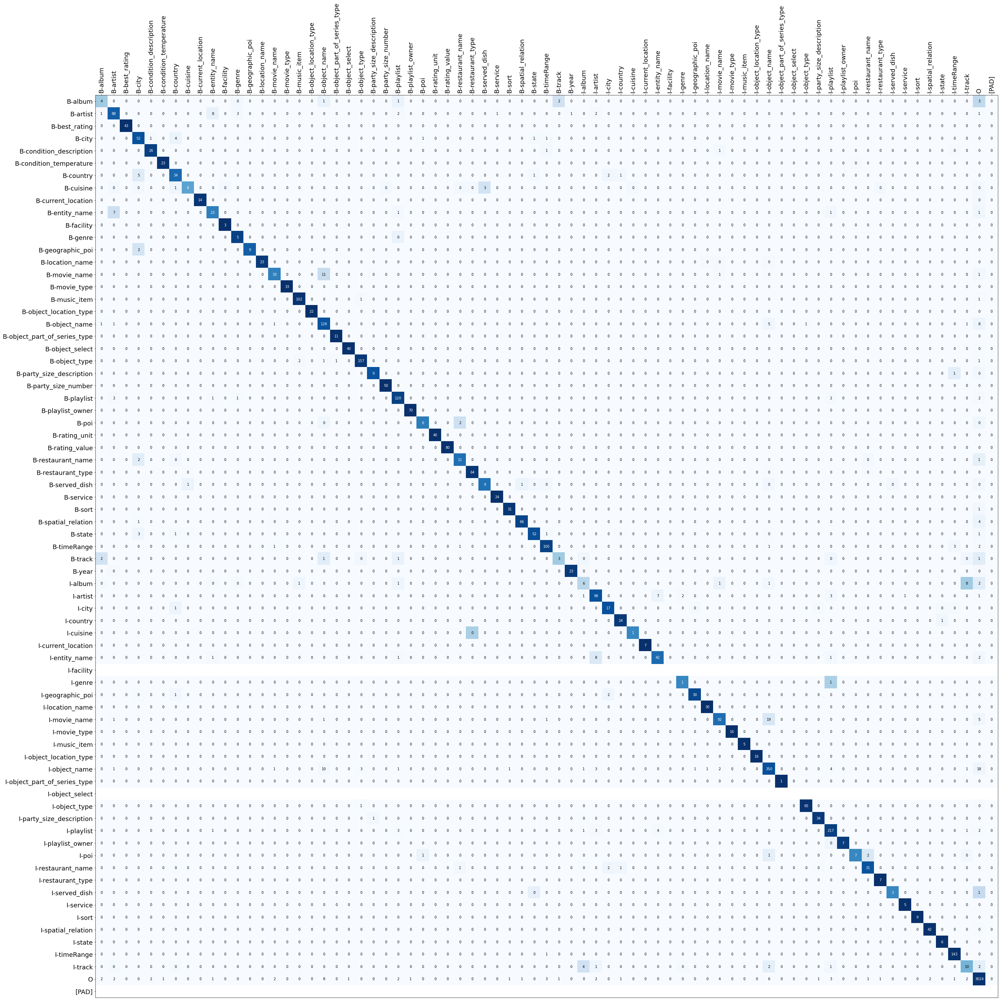

In [ ]:
slot_matrix_SNIPS_mean = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_mean/ slot_matrix_SNIPS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_SNIPS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_SNIPS_norm.shape[0]):
    if np.sum(slot_matrix_SNIPS_norm[i]) > 0.0:
        for j in range(slot_matrix_SNIPS_norm.shape[1]):
            color = "white" if slot_matrix_SNIPS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_SNIPS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_slot_SNIPS')

<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

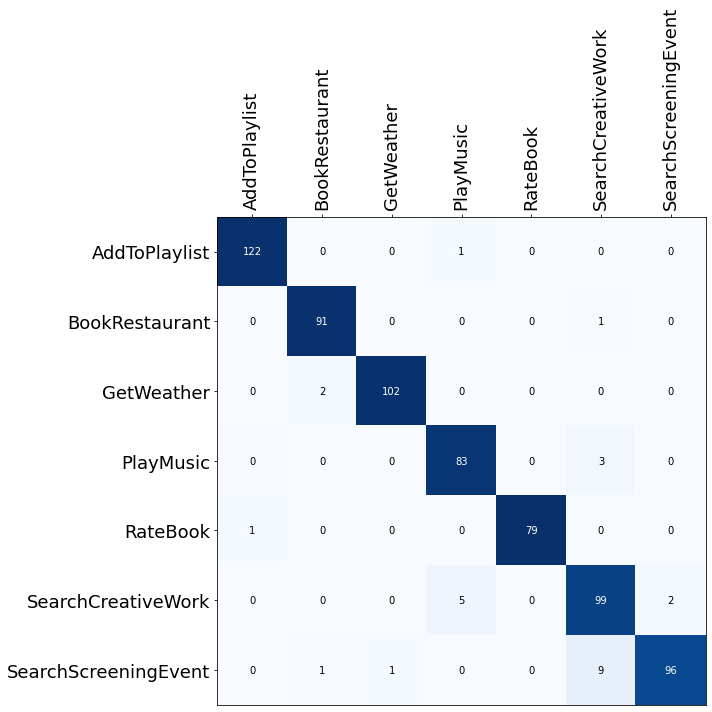

In [ ]:
intent_matrix_SNIPS_mean = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_mean/ intent_matrix_SNIPS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_SNIPS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_SNIPS_norm.shape[0]):
    if np.sum(intent_matrix_SNIPS_norm[i]) > 0.0:
        for j in range(intent_matrix_SNIPS_norm.shape[1]):
            color = "white" if intent_matrix_SNIPS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_SNIPS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BiLSTM_intent_SNIPS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_SNIPS)

((576,), (576, 600))
((551,), (551, 600))
((580,), (580, 600))
((599,), (599, 600))
((599,), (599, 600))
((610,), (610, 600))
((616,), (616, 600))
((566,), (566, 600))
((564,), (564, 600))
((550,), (550, 600))
((543,), (543, 600))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_SNIPS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_SNIPS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_SNIPS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_SNIPS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


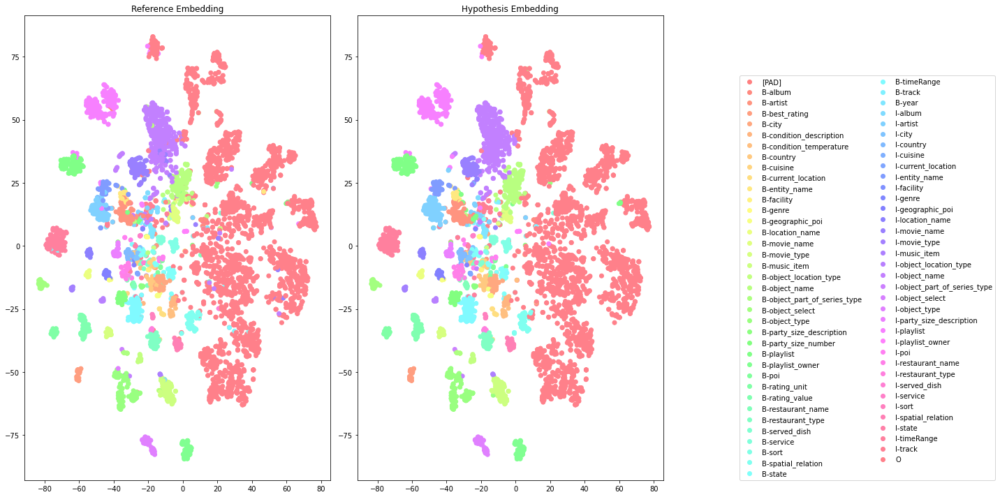

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='BiLSTM_slot_embeddings_SNIPS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


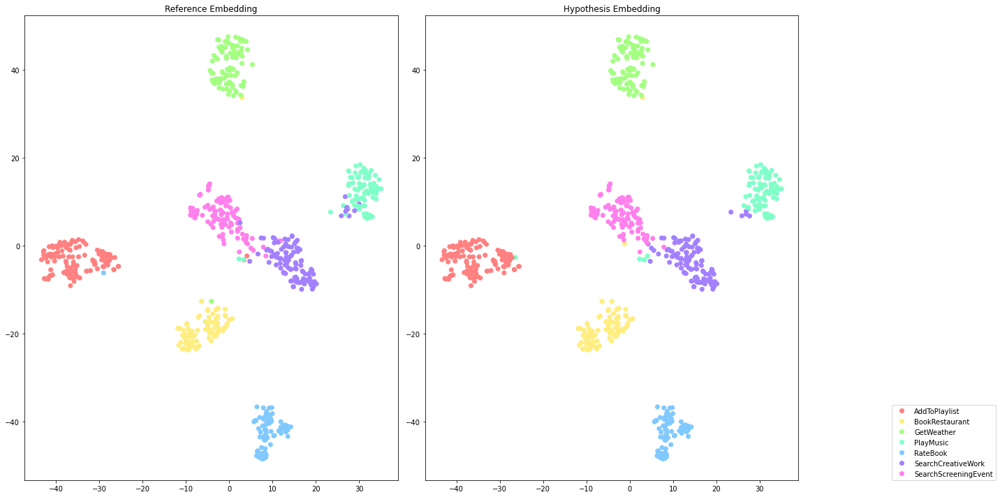

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='BiLSTM_intent_embeddings_SNIPS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_SNIPS = numpy_fillna(losses_train_SNIPS)
losses_dev_SNIPS = numpy_fillna(losses_dev_SNIPS)

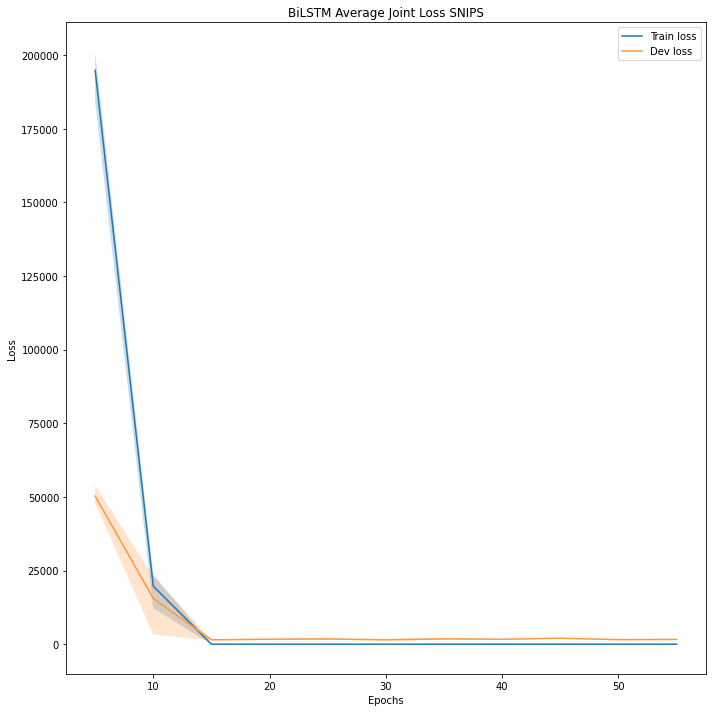

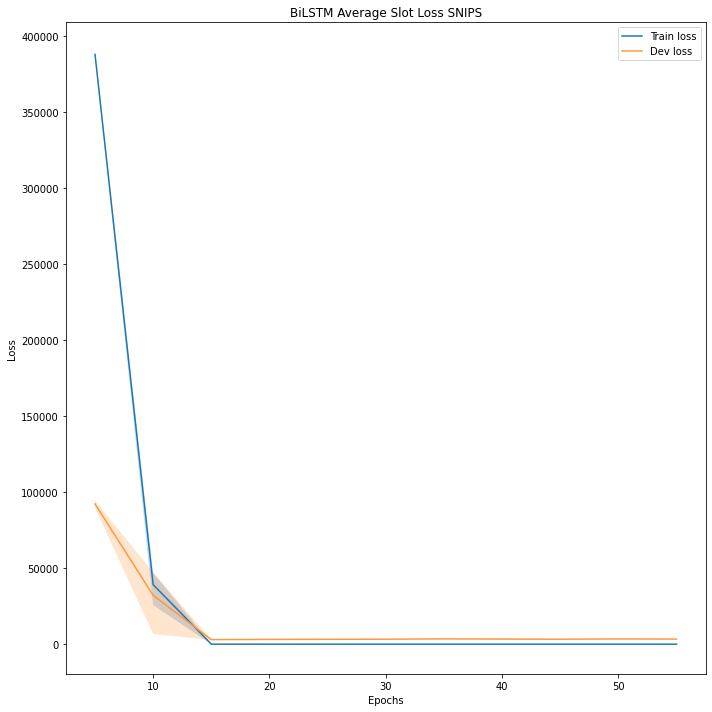

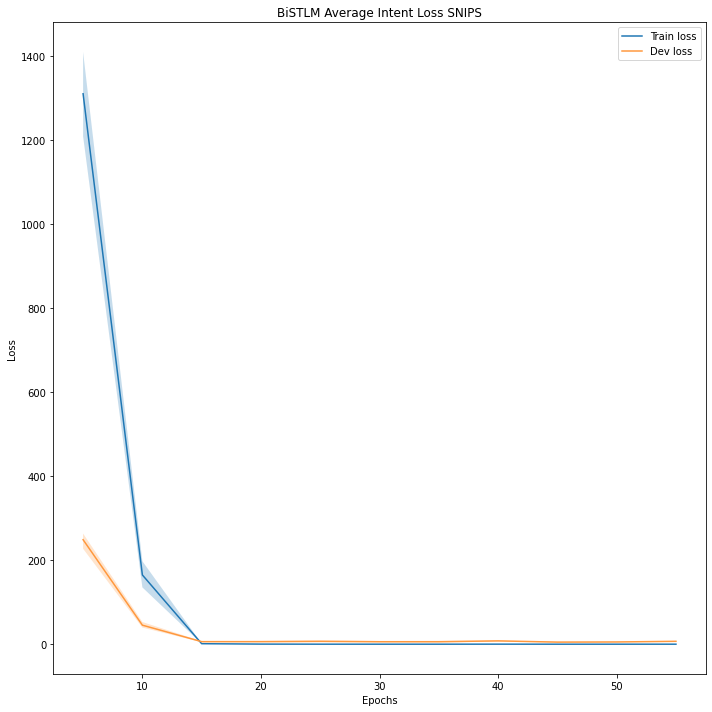

In [ ]:
plot_loss(losses_train_SNIPS[:,:,0],losses_dev_SNIPS[:,:,0],sample_rate,'BiLSTM Average Joint Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,1],losses_dev_SNIPS[:,:,1],sample_rate,'BiLSTM Average Slot Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,2],losses_dev_SNIPS[:,:,2],sample_rate,'BiSTLM Average Intent Loss SNIPS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_SNIPS,test_loader_SNIPS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O B-party_size_number O O O O O O B-spatial_relation O '
              'B-poi O O B-served_dish O',
 'ref_slots': 'O O O O B-party_size_number O O O O O O B-spatial_relation O '
              'B-poi O O B-restaurant_type O',
 'utterance': 'i want to bring four people to a place that s close to downtown '
              'that serves churrascaria cuisine'}


In [ ]:
pprint(len(test_slot_errors))

189


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'BookRestaurant',
 'ref_intent': 'SearchScreeningEvent',
 'utterance': 'find [UNK] [UNK] starting now at a movie house'}


In [ ]:
pprint(len(test_intent_errors))

22


# Proposal 2: BERT fine tuning

Here I try to use a model based on BERT. It consists of using a pretrained model, BERT, to perform the tasks. The key idea is that both ATIS and SNIPS are too small to learn correctly the semantics of different tokens. Instead using a pretrained model on a different, vast and varied dataset, may increase our performances. Like we humans, before understanding some tasks, we need to learn language first. 



This model is based on BERT. It uses pre-trained BERT model as encoder. The encoded results are used by two fully connected heads in order to perform slot filling and intent classification.

It also uses:

- pseudo Randomly Weighted Loss
- Focal Loss

Bert.svg

In [ ]:
class ModelBertSlotIntent(nn.Module):

    def __init__(self, out_slot, out_int, lang ,bert_output = 768, pad_index=0, n_layers=4):
        super(ModelBertSlotIntent, self).__init__()
        ##out_slot = number of slots (output size for slot filling)
        ##out_int = number of intents (ouput size for intent classification)
        ##bert model to get embeddings
        self.bert = BertModel.from_pretrained("bert-base-uncased",output_hidden_states=True)
        self.bert.requires_grad_(True)
        ##append two separate layers for downstream tasks
        
        ##dropout as regularizer
        self.layer_norm_slot = nn.LayerNorm(bert_output)
        self.layer_norm_intent = nn.LayerNorm(bert_output)
        
        self.slot_out = nn.Linear(bert_output, out_slot)
        self.intent_out = nn.Linear(bert_output, out_int)

        self.dropout = nn.Dropout(0.1)
        self.n_layers = n_layers
        self.lang = lang
       

    def forward(self, utterance,seq_lengths,mask,features=False):
        utt_emb = self.bert(utterance)
        slots = utt_emb.last_hidden_state
        slots = slots[mask==True]
        counter = 0
        # remove the extra tokens by bert
        slot_feats = torch.zeros((seq_lengths.shape[0],max(seq_lengths),slots.shape[-1])).to(device)
        for id,len in enumerate(seq_lengths):
            slot_feats[id,:len] = slots[counter:counter+len] 
            counter+=len

        slots = slot_feats
        intent_feats = utt_emb.pooler_output
        
        slots = self.layer_norm_slot(slots)
        slots = self.dropout(slots)
        slots = self.slot_out(slots)
        slots = slots.permute(0,2,1)

        intent = utt_emb.pooler_output
        intent = self.layer_norm_intent(intent)
        intent = self.dropout(intent)
        intent = self.intent_out(intent) 
        if features:
            return slots,intent,slot_feats,intent_feats
        else:
            return slots, intent

    

### Function to randomly initialize the weights

Because I'm fine tuning the weights, I only need to initialize the output layers for slot and intent classification.



In [ ]:
def init_weights(mat):
    torch.nn.init.uniform_(mat.slot_out.weight, -0.01, 0.01)
    if mat.slot_out.bias != None:
        mat.slot_out.bias.data.fill_(0.01)
    torch.nn.init.uniform_(mat.intent_out.weight, -0.01, 0.01)
    if mat.intent_out.bias != None:
        mat.intent_out.bias.data.fill_(0.01)

###BERT Dataset


Because BERT is pretrained using a different vocabulary than ATIS or SNIPS it also expects a specific word to id mapping.

If BertTokenizer is used to extract the word2id mapping, creates a different tokenization than whitespace tokenization. Specifically, utterances like 

```
i 'd like to leave from boston on tuesday and i 'd like to leave sometime in the morning
```
are tokenized by BertTokenizer as 
```
[CLS] i ' d like to leave from boston on tuesday and i ' d like to leave some time in the morning [SEP]
```
and 
```
 how many people fit on a 72s airplane
```
as
```
[CLS] how many people fit on a 72 ##s airplane [SEP]
```

splitting special characters `'` and increasing the number of tokens by separating suffixes. BERT specifically also requires each utterance to start and end with `[CLS] `and `[SEP]`.

This creates a problem with the slot filling, as the number of slots is no longer the same as the number of tokens. 

To solve this issue, extra tokens such as ''', '.' and suffix tokens such as '##s' are ignored for slot filling


In [ ]:
##extend dataset as normal dataset and dataloader
class IntentsAndSlotsTokenizer(data.Dataset):
    ##Mandatory methods are __init__, __len__ and __getitem__
    def __init__(self, dataset, lang, unk='[UNK]'):
        self.utterances = []
        self.intents = []
        self.slots = []
        self.unk = unk
        self.lang = lang
        for x in dataset:
            # self.utterances.append('[CLS] '+x['utterance']+' [SEP]')
            self.utterances.append(x['utterance'])
            self.slots.append(x['slots'])
            self.intents.append(x['intent'])
        self.utt_ids = tokenizer(self.utterances)['input_ids']
        # self.utt_ids = self.mapping_seq(self.utterances, lang.word2id)
        self.slot_ids = self.mapping_seq(self.slots, lang.slot2id)
        self.intent_ids = self.mapping_lab(self.intents, lang.intent2id)
    def __len__(self):
        return len(self.utterances)

    def __getitem__(self, idx):
        utt = torch.tensor(self.utt_ids[idx])
        slots = torch.tensor(self.slot_ids[idx],dtype=torch.int)
        intent = self.intent_ids[idx]
        sample = {'utterance': utt, 'slots': slots, 'intent': intent}
        return sample
    
    ##Auxiliary methods
    def mapping_lab(self, data, mapper):
        return [mapper[x] if x in mapper else mapper[self.unk] for x in data]
    
    def mapping_seq(self, data, mapper): ##Map sequences to number
        res = []
        for seq in data:
            tmp_seq = []
            for x in seq.split():
                if x in mapper:
                    tmp_seq.append(mapper[x])
                else:
                    # pprint(x)
                    tmp_seq.append(mapper[self.unk])
            res.append(tmp_seq)
        return res


In [ ]:
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

words = sum([x['utterance'].split() for x in train_raw_ATIS], []) ##No set() since we want to computethe cutoff
corpus = train_raw_ATIS + dev_raw_ATIS + test_raw_ATIS ##We do not want unk labels
slots = set(sum([line['slots'].split() for line in corpus],[]))
slots.add('[UNK]')
intents = set([line['intent'] for line in corpus])
lang_bert_ATIS = Lang(words, intents, slots, cutoff=0)
lang_bert_ATIS.word2id = {k: v for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}
lang_bert_ATIS.id2word = {v: k for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}

words = sum([x['utterance'].split() for x in train_raw_SNIPS], []) ##No set() since we want to compute the cutoff
corpus = train_raw_SNIPS + dev_raw_SNIPS + test_raw_SNIPS ##We do not want unk labels
slots = set(sum([line['slots'].split() for line in corpus],[]))
slots.add('[UNK]')
intents = set([line['intent'] for line in corpus])
lang_bert_SNIPS = Lang(words, intents, slots, cutoff=0)
lang_bert_SNIPS.word2id = {k: v for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}
lang_bert_SNIPS.id2word = {v: k for k, v in sorted(tokenizer.vocab.items(), key=lambda item: item[0])}

In [ ]:
##Create our datasets ATIS
train_dataset_bert_ATIS = IntentsAndSlotsTokenizer(train_raw_ATIS, lang_bert_ATIS)
dev_dataset_bert_ATIS = IntentsAndSlotsTokenizer(dev_raw_ATIS, lang_bert_ATIS)
test_dataset_bert_ATIS = IntentsAndSlotsTokenizer(test_raw_ATIS, lang_bert_ATIS)

##Create our datasets SNIPS
train_dataset_bert_SNIPS = IntentsAndSlotsTokenizer(train_raw_SNIPS, lang_bert_SNIPS)
dev_dataset_bert_SNIPS = IntentsAndSlotsTokenizer(dev_raw_SNIPS, lang_bert_SNIPS)
test_dataset_bert_SNIPS = IntentsAndSlotsTokenizer(test_raw_SNIPS, lang_bert_SNIPS)

In [ ]:
# function to extract tokens to be ignored for slot filling, because BERT tokenization creates more tokens than whitespace tokenization.
def ignore(lang):
    li = set()
    for k,v in lang.word2id.items():
        if k[0:2] == "##":
            li.add(v)
    li.add(lang.word2id["'"])
    li.add(lang.word2id["."])
    li.add(lang.word2id["[SEP]"])
    li.add(lang.word2id["[CLS]"])
    li.add(lang.word2id["[PAD]"])
    return li

def collate_fn_bert(data,lang,ignore_set):
    # function to remove extra tokens generated by BertTokenization
    def remove_extra_tokens(utterance,seq_lengths):
        mask = torch.zeros(utterance.shape,dtype=torch.bool).to(device)
        for (b_id,utter),leng in zip(enumerate(utterance),seq_lengths):
            sent = []
            last = torch.zeros((1),dtype=torch.bool).to(device)
            for w_id,token in enumerate(utter):
                if token.item() not in ignore_set:
                    if last.item() != lang.word2id["'"] and token.item() != lang.word2id["clock"] : 
                        last = token
                        mask[b_id,w_id] = True
                        sent.append(token.item())
            if sum(mask[b_id])!=leng:
                f"lengths do not match, check the tokenizer{sum(mask[b_id]),leng, [lang.id2word[t] for t in sent]}"
                while(sum(mask[b_id])>leng):
                    mask[b_id,w_id] = False
                    w_id -=1
                while(sum(mask[b_id])<leng):
                    mask[b_id,w_id] = True
                    w_id +=1
                assert sum(mask[b_id])==leng,f"lengths do not match, check the tokenizer{sum(mask[b_id]),leng, [lang.id2word[t] for t in sent]}"
        return mask

    def merge(sequences):
        '''
        merge from batch * sent_len to batch * max_len 
        '''
        lengths = [len(seq) for seq in sequences]
        max_len = 1 if max(lengths)==0 else max(lengths)
        ##Pad token is zero in our case
        ##So we create a matrix full of PAD_TOKEN (i.e. 0) with the shape 
        ##batch_size X maximum length of a sequence
        padded_seqs = torch.LongTensor(len(sequences),max_len).fill_(PAD_TOKEN)
        for i, seq in enumerate(sequences):
            end = lengths[i]
            padded_seqs[i, :end] = seq ##We copy each sequence into the matrix
        ##print(padded_seqs)
        padded_seqs = padded_seqs.detach()  ##We remove these tensors from the computational graph
        return padded_seqs, lengths
    ##Sort data by seq lengths
    data.sort(key=lambda x: len(x['slots']), reverse=True) 
    new_item = {}
    for key in data[0].keys():
        new_item[key] = [d[key] for d in data]
    ##We just need one length for packed pad seq, since len(utt) == len(slots)
    src_utt, _ = merge(new_item['utterance'])
    y_slots, y_lengths = merge(new_item["slots"])
    intent = torch.LongTensor(new_item["intent"])
    
    src_utt = src_utt.to(device) ##We load the Tensor on our seleceted device
    y_slots = y_slots.to(device)
    intent = intent.to(device)
    y_lengths = torch.LongTensor(y_lengths).to(device)
    
    new_item["utterances"] = src_utt
    new_item["intents"] = intent
    new_item["y_slots"] = y_slots
    new_item["slots_len"] = y_lengths

    new_item['slot_mask'] = remove_extra_tokens(src_utt,y_lengths)

    return new_item


In [ ]:
ignore_set_ATIS = ignore(lang_bert_ATIS)

train_loader_bert_ATIS = DataLoader(train_dataset_bert_ATIS, batch_size=128,collate_fn=partial(collate_fn_bert,lang= lang_bert_ATIS,ignore_set=ignore_set_ATIS), shuffle=True)
dev_loader_bert_ATIS = DataLoader(dev_dataset_bert_ATIS, batch_size=64,collate_fn=partial(collate_fn_bert,lang= lang_bert_ATIS,ignore_set=ignore_set_ATIS))
test_loader_bert_ATIS = DataLoader(test_dataset_bert_ATIS, batch_size=64,collate_fn=partial(collate_fn_bert,lang= lang_bert_ATIS,ignore_set=ignore_set_ATIS))

ignore_set_SNIPS = ignore(lang_bert_SNIPS)
train_loader_bert_SNIPS = DataLoader(train_dataset_bert_SNIPS, batch_size=128,collate_fn=partial(collate_fn_bert,lang= lang_bert_SNIPS,ignore_set=ignore_set_SNIPS), shuffle=True)
dev_loader_bert_SNIPS = DataLoader(dev_dataset_bert_SNIPS, batch_size=64,collate_fn=partial(collate_fn_bert,lang= lang_bert_SNIPS,ignore_set=ignore_set_SNIPS))
test_loader_bert_SNIPS = DataLoader(test_dataset_bert_SNIPS, batch_size=64,collate_fn=partial(collate_fn_bert,lang= lang_bert_SNIPS,ignore_set=ignore_set_SNIPS))

In [ ]:
##Create our balanced datasets ATIS
train_dataset_bert_remix_ATIS = IntentsAndSlotsTokenizer(train_raw_remix_ATIS, lang_bert_ATIS)
dev_dataset_bert_remix_ATIS = IntentsAndSlotsTokenizer(dev_raw_remix_ATIS, lang_bert_ATIS)
test_dataset_bert_remix_ATIS = IntentsAndSlotsTokenizer(test_raw_remix_ATIS, lang_bert_ATIS)

train_loader_bert_remix_ATIS = DataLoader(train_dataset_bert_remix_ATIS, batch_size=128,collate_fn=partial(collate_fn_bert,lang= lang_bert_ATIS,ignore_set=ignore_set_ATIS), shuffle=True)
dev_loader_bert_remix_ATIS = DataLoader(dev_dataset_bert_remix_ATIS, batch_size=64,collate_fn=partial(collate_fn_bert,lang= lang_bert_ATIS,ignore_set=ignore_set_ATIS))
test_loader_bert_remix_ATIS = DataLoader(test_dataset_bert_remix_ATIS, batch_size=64,collate_fn=partial(collate_fn_bert,lang= lang_bert_ATIS,ignore_set=ignore_set_ATIS))


In [ ]:
# function to check that the mapping was correct
def re_bert(sample,lang):
    intent = lang.id2intent[sample['intent']]
    slots = [lang.id2slot[x.item()] for x in sample['slots']]
    utterance = [lang.id2word[x.item()] for x in sample['utterance']]
    return {'intent':intent,'slots':slots,'utterance':utterance}

In [ ]:
re_bert(train_dataset_bert_ATIS[0],lang_bert_ATIS)

{'intent': 'flight',
 'slots': ['O',
  'O',
  'O',
  'O',
  'B-fromloc.city_name',
  'O',
  'B-toloc.city_name',
  'B-toloc.state_name'],
 'utterance': ['[CLS]',
  'which',
  'flights',
  'are',
  'between',
  'boston',
  'and',
  'baltimore',
  'washington',
  '[SEP]']}

###Train Loop and Evaluation Loop
Two functions `train_loop()` and `evaluate_loop()` one for training the model and the other for evaluating it.

To compute the performances on the slot filling task it will used the evaluate function from the **conll script**, while for the intent classification **classification_report** from scikitlearn. 

In [ ]:
def train_loop(data, optimizer, criterion_slots, criterion_intents,clip, model):
    '''
    function to train the model

    input
    - data : dataset
    - optimizer : optimizer 
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - model : model to be trained

    output
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    '''
    model.train()
    loss_array = []

    for sample in data:
        optimizer.zero_grad() ##Zeroing the gradient
        slots, intent = model(sample['utterances'], sample['slots_len'],sample['slot_mask'])
        loss_intent = criterion_intents(intent, sample['intents'])
        loss_slot = criterion_slots(slots, sample['y_slots'])
        weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
        torch.sort(weight)
        if loss_slot<loss_intent:
            loss = weight[0]*loss_slot+ weight[1]*loss_intent
        else: 
            loss = weight[0]*loss_intent+ weight[1]*loss_slot
        loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
        loss.backward() ##Compute the gradient
        ##clip the gradient to avoid explosioning gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)  
        optimizer.step() ##Update the weights
    return np.asarray(loss_array)

def eval_loop(data, criterion_slots, criterion_intents, model, lang):
    '''
    function to evaluate the model
    
    input
    - data : dataset
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - model : model to be trained
    - lang : language class Lang used for the dataset

    output
    - results_slot : evaluation of slot filling using conll evaluate,
    - report_intent: evaluation of intent classification using scikitlearn classification report,
    - loss_array: numpy array of losses. Shape (dataset size,3) Triplet of losses (joint, slot, intent) for each element of data.
    - matrix_slot: confusion matrix on slot filling
    - matrix_intent confusion matrix on intent classification
    '''
    model.eval()
    loss_array = []
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    #softmax = nn.Softmax(dim=1) ##Use Softmax if you need the actual probability
    with torch.no_grad(): ##It used to avoid the creation of computational graph
        for sample in data:
            slots, intents = model(sample['utterances'], sample['slots_len'],sample['slot_mask'])
            loss_intent = criterion_intents(intents, sample['intents'])
            loss_slot = criterion_slots(slots, sample['y_slots'])
            weight = nn.functional.softmax(torch.randn(2).to(device),dim=-1).to(device) ##RLW is only this!
            torch.sort(weight)
            if loss_slot<loss_intent:
                loss = weight[0]*loss_slot+weight[1]*loss_intent
            else: 
                loss = weight[0]*loss_intent+weight[1]*loss_slot
            ##loss = loss_intent
            loss_array.append((loss.item(),loss_slot.item(),loss_intent.item()))
            
            ##Intent inference
            out_intents = [lang.id2intent[x] 
                           for x in torch.argmax(intents, dim=1).tolist()] 
            gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
            ref_intents.extend(gt_intents)
            hyp_intents.extend(out_intents)
            
            ##Slot inference 
            output_slots = torch.argmax(slots, dim=1)
            for id_seq, seq in enumerate(output_slots):
                length = sample['slots_len'].tolist()[id_seq]
                # shift because [CLS] should be ignored
                utt_ids = sample['utterance'][id_seq][:length].tolist()
                gt_ids = sample['y_slots'][id_seq].tolist()
                gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
                utterance = [lang.id2word[elem] for elem in utt_ids]
                to_decode = seq[:length].tolist()
                ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
                tmp_seq = []
                for id_el, elem in enumerate(to_decode):
                    ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                    tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
                hyp_slots.append(tmp_seq)
    try:            
        results_slot = evaluate(ref_slots, hyp_slots)
    except Exception as ex:
        ##Sometimes the model predics a class that is not in REF
        print(ex)
        ref_s = set([x[1] for x in ref_slots])
        hyp_s = set([x[1] for x in hyp_slots])
        print(hyp_s.difference(ref_s))
        
    report_intent = classification_report(ref_intents, hyp_intents, 
                                          zero_division=False, output_dict=True)
    
    matrix_slot = confusion_matrix([token[1] for sent in ref_slots for token in sent], [token[1] for sent in hyp_slots for token in sent],labels=list(lang.slot2id.keys()))
    matrix_intent = confusion_matrix(ref_intents, hyp_intents,labels=list(lang.intent2id.keys()))
    
    return results_slot, report_intent, np.asarray(loss_array), matrix_slot, matrix_intent


In [ ]:
def train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate):
    '''
    function to train a model using patience as early stopping.
    input
    - model : model to be trained
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - losses_train : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    '''
    ##list of recorded losses
    losses_train = []
    losses_dev = []
    ##list of epochs that were sampled for validation
    sampled_epochs = []
    ##early stopping on joint loss
    best_loss_slot,best_loss_intent = float('inf'),float('inf')
    ##patience
    patience_intent,patience_slot = patience,patience
    for x in tqdm(range(1,n_epochs)):
        ##train
        loss = train_loop(train_loader, optimizer, criterion_slots, criterion_intents,clip, model)
        ##every sample rate
        if x % sample_rate == 0:
            ##record epoch
            sampled_epochs.append(x)
            ##record losses on train ( 3 loss array)
            losses_train.append(loss.mean(axis=0))
            ##record losses on dev (3 loss array )
            slot_dev, intent_dev, loss_dev,_,_ = eval_loop(dev_loader, criterion_slots, criterion_intents, model, lang)
            losses_dev.append(loss_dev.mean(axis=0))
            ##early stopping considering mean joint loss on dev set
            if loss_dev.mean(axis=0)[1] < best_loss_slot:
                best_loss_slot = loss_dev.mean(axis=0)[1]
            else:
                patience_slot -= 1
            if loss_dev.mean(axis=0)[2] < best_loss_intent:
                best_loss_intent = loss_dev.mean(axis=0)[2]
            else:
                patience_intent -= 1
            if patience_slot <= 0 and patience_intent <=0:
            # if patience_intent <=0:
                break 
    return losses_train,losses_dev

In [ ]:
def train_multiple(runs,lang,n_epochs,train_loader,dev_loader,test_loader,criterion_slots,criterion_intents,n_layers,clip,patience,sample_rate):
    '''
    function to a model using patience as early stopping multiple times
    input
    - runs: number of runs
    - lang : Lang class object used for the dataset
    - n_epochs : maximum number of epochs to train the model
    - train_loader : train set dataloader object
    - dev_loader : dev set dataloader object
    - test_loader : test set dataloader object
    - criterion_slots : loss criteria for slot filling
    - criterion_intents : loss criteria for intent classification
    - clip : value for gradient clipping
    - patience : value for patience
    - sample rate : number of epochs to skip before doing an evaluation using the dev set.
    output:
    - models : list of models trained
    - results_slots : a list of evaluation of slot filling using conll evaluate of length runs,
    - reports_intents: a list of evaluation of intent classification using scikitlearn classification report of length runs,
    - losses_train_mul : losses on training set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - losses_dev_mul : losses on validation set. List of losses, each item a loss triplet computed during training every sample rate epochs
    - matrix_slot: a list of confusion matrixes on slot filling of length runs
    - matrix_intent: a list confusion matrixes on intent classification of length runs
    '''
    out_slot = len(lang.slot2id)
    out_int = len(lang.intent2id)
    vocab_len = len(lang.word2id)
    ##list of test results
    results_slots, results_intents = [],[]
    ##list of losses through the run
    losses_train_mul = []
    losses_dev_mul = []
    ##models
    models = []
    slot_matrix = np.zeros((runs,out_slot,out_slot))
    intent_matrix = np.zeros((runs,out_int,out_int))
    for x in range(0, runs):
        model = ModelBertSlotIntent(out_slot, out_int,lang, 768,pad_index=PAD_TOKEN,n_layers=n_layers).to(device)
        # model.apply(init_weights)
        init_weights(model)
        # I'm using a different learning rate for the last layers
        optimizer = optim.Adam([
                {'params': model.bert.parameters()},
                {'params': model.slot_out.parameters(), 'lr': lr},
                {'params': model.intent_out.parameters(), 'lr': lr}
            ], lr=lr/10)
        ##train
        losses_train,losses_dev = train_model(model,lang,n_epochs,train_loader,dev_loader,optimizer,criterion_slots,criterion_intents,clip,patience,sample_rate)
        losses_train_mul.append(losses_train)
        losses_dev_mul.append(losses_dev)
        ##test results
        slot_test, intent_test, loss_test, slot_m, intent_m = eval_loop(test_loader, criterion_slots, criterion_intents, model, lang)
        slot_matrix[x] += slot_m
        intent_matrix[x] += intent_m
        results_slots.append(slot_test)
        results_intents.append(intent_test)
        models.append(model)
    return models,results_slots,results_intents,losses_train_mul,losses_dev_mul,slot_matrix,intent_matrix

In [ ]:
# error function to test the model and sample the predictions used for error
def eval_loop_complete(model, lang, data):
    ref_intents = []
    hyp_intents = []
    ref_slots = []
    hyp_slots = []
    for sample in data:
        ##Intent inference
        slots,intents = model.forward(sample['utterances'],sample['slots_len'],sample['slot_mask'])

        out_intents = [lang.id2intent[x] 
                        for x in torch.argmax(intents, dim=1).tolist()] 
        gt_intents = [lang.id2intent[x] for x in sample['intents'].tolist()]
        ref_intents.extend(gt_intents)
        hyp_intents.extend(out_intents)

        ##Slot inference 
        output_slots = torch.argmax(slots, dim=1)
        for id_seq, seq in enumerate(output_slots):
            length = sample['slots_len'].tolist()[id_seq]
            # i need ignore the [CLS] and [SEP] tokens!
            utt_ids = sample['utterance'][id_seq][:length].tolist()
            gt_ids = sample['y_slots'][id_seq].tolist()
            gt_slots = [lang.id2slot[elem] for elem in gt_ids[:length]]
            utterance = [lang.id2word[elem] for elem in utt_ids]
            to_decode = seq[:length].tolist()
            ref_slots.append([(utterance[id_el], elem) for id_el, elem in enumerate(gt_slots)])
            tmp_seq = []
            for id_el, elem in enumerate(to_decode):
                ##tmp_seq.append((utterance[id_el], lang.id2slot[elem]))
                tmp_seq.append((utterance[id_el], lang.id2slot[elem]) if elem != 0 else (utterance[id_el], 'O'))
            hyp_slots.append(tmp_seq)
    return ref_slots,hyp_slots,ref_intents,hyp_intents,
                

###Training

To have reliable results on small corpora train and test the model will be done several times over. At the end, the results are averaged.

In [ ]:
##parameters for training
lr = 0.0001 ##learning rate
clip = 5 ##Clip the gradient
runs = 1 ##runs
n_epochs = 100 ##epochs for each run
patience_max = 5 ##patience for early stopping for each run. Computed every sample_rate steps
sample_rate = 3
n_layers = 1

# criterion_slots = nn.CrossEntropyLoss(ignore_index=PAD_TOKEN)
# criterion_intents =  nn.CrossEntropyLoss()
criterion_slots = FocalLoss(gamma=2,reduction='sum',ignore_index=PAD_TOKEN)
criterion_intents =  FocalLoss(gamma=2,reduction='sum')

####ATIS

Train multiple times on ATIS

In [ ]:
models, slot_test_ATIS,intent_test_ATIS,losses_train_ATIS,losses_dev_ATIS, slot_matrix_ATIS, intent_matrix_ATIS, = train_multiple(runs,lang_bert_ATIS,n_epochs,train_loader_bert_ATIS,dev_loader_bert_ATIS,test_loader_bert_ATIS,criterion_slots,criterion_intents,n_layers,clip,patience_max,sample_rate)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
 69%|██████▊   | 68/99 [31:45<14:28, 28.02s/it]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./BERT_ATIS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./BERT_ATIS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_ATIS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
fare_amount,1.0,1.0,1.0,2.0
arrive_date.date_relative,1.0,1.0,1.0,2.0
toloc.country_name,1.0,1.0,1.0,1.0
toloc.airport_name,1.0,1.0,1.0,3.0
restriction_code,1.0,1.0,1.0,4.0
...,...,...,...,...
booking_class,1.0,0.0,0.0,1.0
stoploc.airport_code,1.0,0.0,0.0,1.0
flight,1.0,0.0,0.0,1.0
meal_code,1.0,0.0,0.0,1.0


Display results on intent classification task

In [ ]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
airline,1.000,1.000,1.000,38.0
airport,1.000,1.000,1.000,18.0
capacity,1.000,1.000,1.000,21.0
distance,1.000,1.000,1.000,10.0
flight_no,1.000,1.000,1.000,8.0
flight_time,1.000,1.000,1.000,1.0
ground_service,1.000,1.000,1.000,36.0
meal,1.000,1.000,1.000,6.0
flight,0.986,0.992,0.989,632.0
weighted avg,0.972,0.973,0.970,893.0


In [ ]:
pprint(intent_test_ATIS_mean['accuracy'])

0.973124300111982


In [ ]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.954992968 +- 0.0
Intent Acc 0.9731243 +- 0.0


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

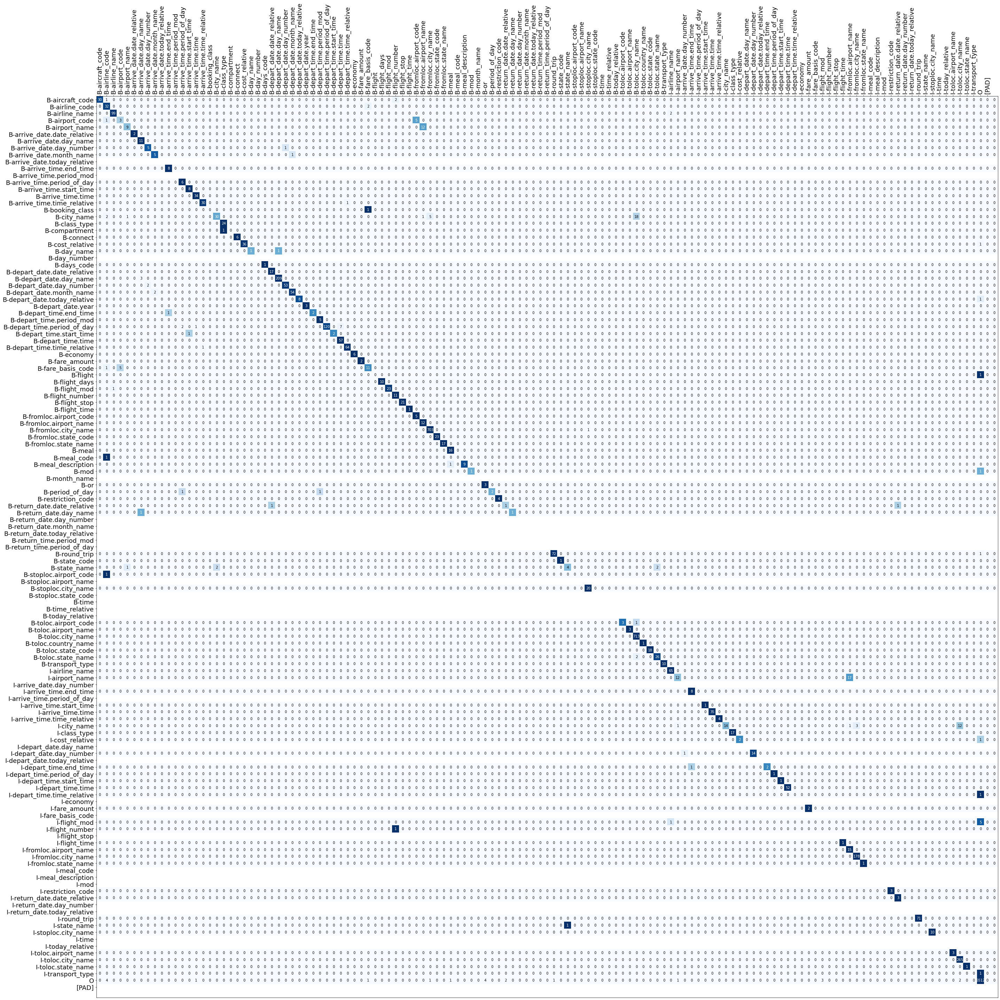

In [ ]:
slot_matrix_ATIS_mean = np.mean(slot_matrix_ATIS,axis=0)
slot_matrix_ATIS_norm =  slot_matrix_ATIS_mean/ slot_matrix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_ATIS_norm.shape[0]):
    if np.sum(slot_matrix_ATIS_norm[i]) > 0.0:
        for j in range(slot_matrix_ATIS_norm.shape[1]):
            color = "white" if slot_matrix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

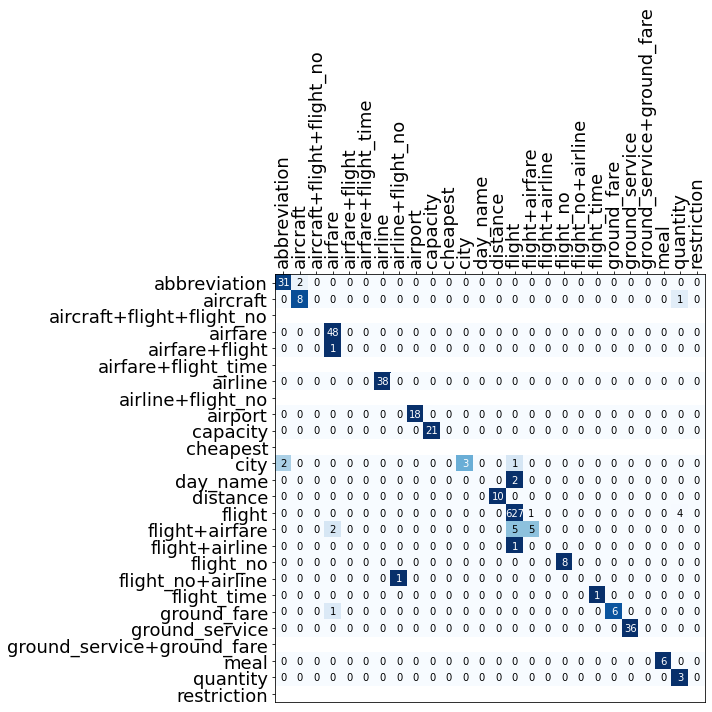

In [ ]:
intent_matrix_ATIS_mean = np.mean(intent_matrix_ATIS,axis=0)
intent_matrix_ATIS_norm =  intent_matrix_ATIS_mean/ intent_matrix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_ATIS_norm.shape[0]):
    if np.sum(intent_matrix_ATIS_norm[i]) > 0.0:
        for j in range(intent_matrix_ATIS_norm.shape[1]):
            color = "white" if intent_matrix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_ATIS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_bert_ATIS)

((744,), (744, 768))
((861,), (861, 768))
((708,), (708, 768))
((637,), (637, 768))
((667,), (667, 768))
((649,), (649, 768))
((595,), (595, 768))
((679,), (679, 768))
((520,), (520, 768))
((463,), (463, 768))
((651,), (651, 768))
((564,), (564, 768))
((667,), (667, 768))
((793,), (793, 768))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_bert_ATIS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_bert_ATIS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_bert_ATIS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_bert_ATIS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


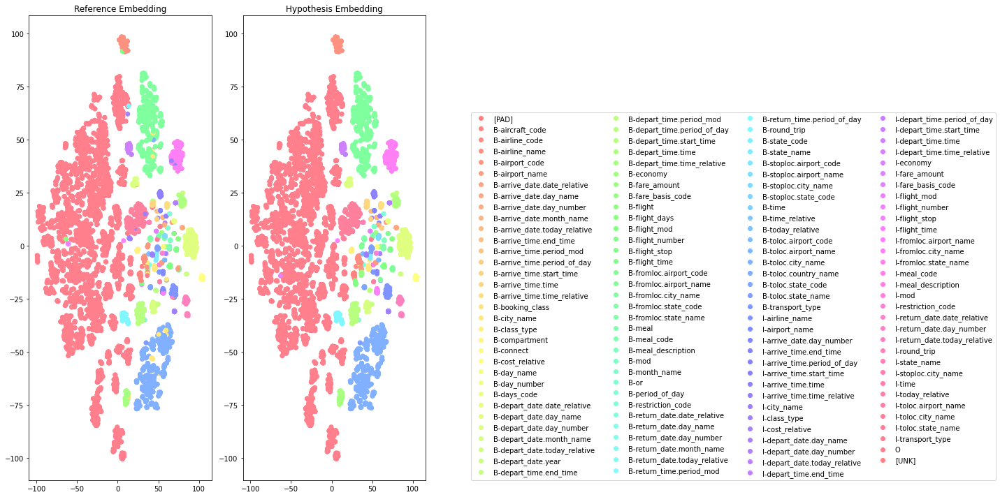

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='BERT_slot_embeddings_ATIS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


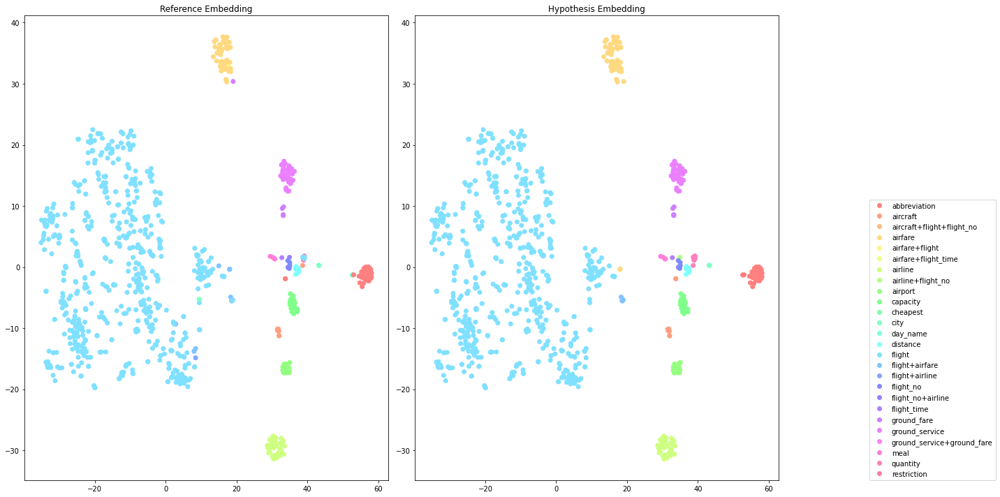

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='BERT_intent_embeddings_ATIS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_ATIS)

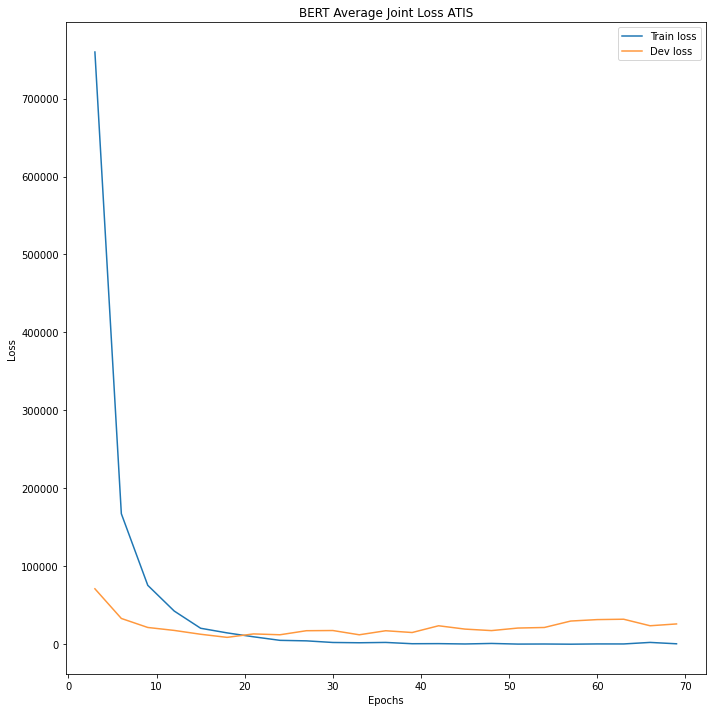

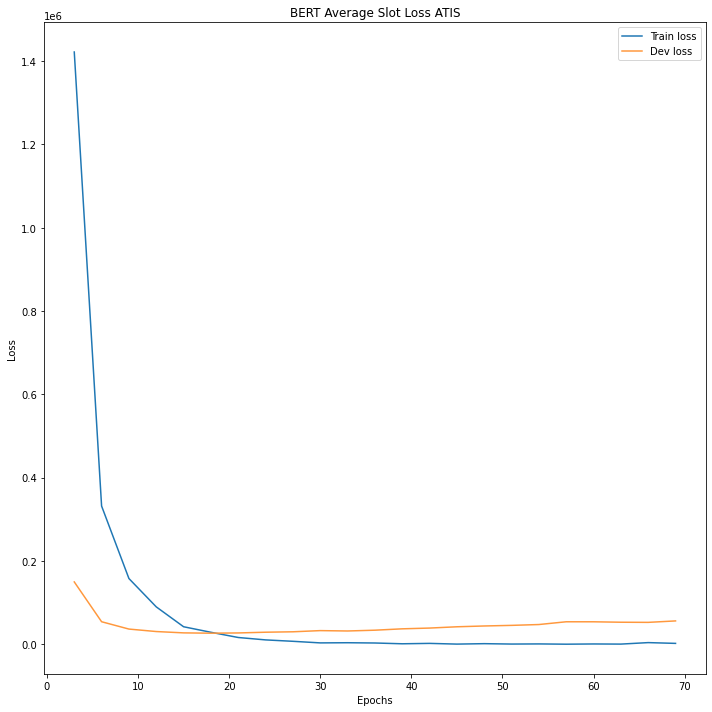

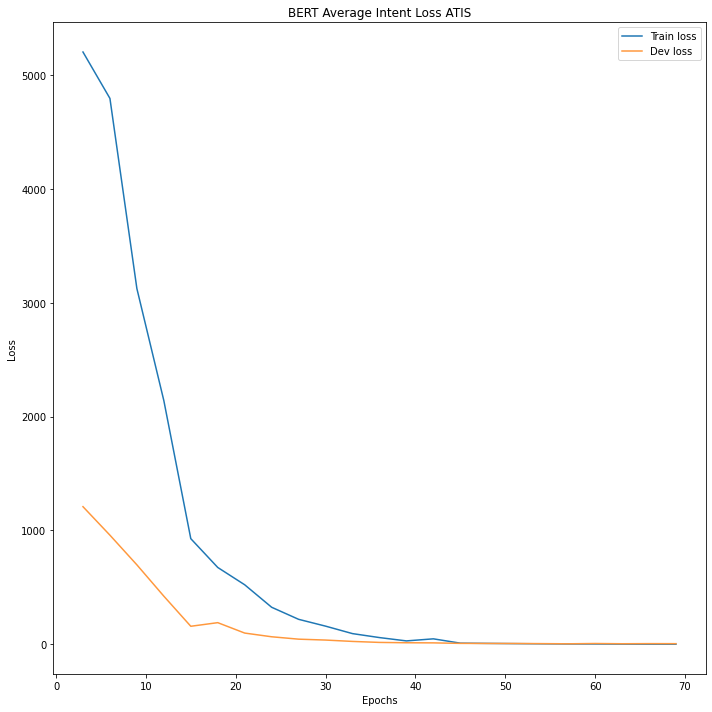

In [ ]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'BERT Average Joint Loss ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'BERT Average Slot Loss ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'BERT Average Intent Loss ATIS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_bert_ATIS,test_loader_bert_ATIS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time B-round_trip O O '
              'B-arrive_date.day_name',
 'ref_slots': 'O B-depart_date.date_relative B-depart_date.day_name O O '
              'B-fromloc.city_name I-fromloc.city_name O B-toloc.city_name O O '
              'O B-toloc.city_name B-arrive_time.time_relative '
              'B-arrive_time.time I-arrive_time.time O O O '
              'B-return_date.day_name',
 'utterance': '[CLS] on next wednesday flight from kansas city to chicago '
              'should arrive in chicago around 7 pm return flight on'}


In [ ]:
pprint(len(test_slot_errors))

103


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'flight',
 'ref_intent': 'flight+airfare',
 'utterance': '[CLS] show flight and prices kansas city to chicago on next '
              'wednesday arriving in chicago by 7'}


In [ ]:
pprint(len(test_intent_errors))

24


#### Remix ATIS

Here is tried a new divison of ATIS, but more balanced, in order to avoid the case of having labels that are present in the test set but not in the train or dev sets.

Train multiple times on remix ATIS

In [ ]:
models, slot_test_remix_ATIS,intent_test_remix_ATIS,losses_train_remix_ATIS,losses_dev_remix_ATIS, slot_matrix_remix_ATIS, intent_matrix_remix_ATIS, = train_multiple(runs,lang_bert_ATIS,n_epochs,train_loader_bert_remix_ATIS,dev_loader_bert_remix_ATIS,test_loader_bert_remix_ATIS,criterion_slots,criterion_intents,n_layers,clip,patience_max,sample_rate)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
 69%|██████▊   | 68/99 [31:27<14:20, 27.75s/it]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./BERT_remix_ATIS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./BERT_remix_ATIS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_ATIS_mean = result_mean(slot_test_remix_ATIS)
intent_test_ATIS_mean = result_mean(intent_test_remix_ATIS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_ATIS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
stoploc.state_code,1.000,1.000,1.000,1.0
fare_amount,1.000,1.000,1.000,12.0
depart_date.day_name,1.000,1.000,1.000,180.0
arrive_date.date_relative,1.000,1.000,1.000,2.0
toloc.country_name,1.000,1.000,1.000,1.0
...,...,...,...,...
depart_time.start_time,1.000,0.667,0.800,3.0
airport_name,0.857,0.750,0.800,8.0
arrive_time.period_mod,0.500,1.000,0.667,1.0
return_date.date_relative,0.429,0.750,0.545,4.0


Display results on intent classification task

In [ ]:
intent_test_ATIS_mean_no_acc = deepcopy(intent_test_ATIS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_ATIS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_ATIS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
capacity,1.000,1.000,1.000,6.0
distance,1.000,1.000,1.000,4.0
meal,1.000,1.000,1.000,2.0
flight,0.995,0.994,0.995,655.0
airfare,1.000,0.986,0.993,72.0
airline,0.968,1.000,0.984,30.0
weighted avg,0.985,0.984,0.983,893.0
ground_service,0.977,0.977,0.977,44.0
abbreviation,0.900,1.000,0.947,27.0
quantity,1.000,0.875,0.933,8.0


In [ ]:
pprint(intent_test_ATIS_mean['accuracy'])

0.9843225083986562


In [ ]:
slot_f1s_ATIS = np.asarray([f['total']['f'] for f in slot_test_remix_ATIS])
intent_acc_ATIS = np.asarray([f['accuracy'] for f in intent_test_remix_ATIS])
print('Slot F1', round(slot_f1s_ATIS.mean(),9), '+-', round(slot_f1s_ATIS.std(),9))
print('Intent Acc', round(intent_acc_ATIS.mean(), 9), '+-', round(intent_acc_ATIS.std(), 9))

Slot F1 0.983639737 +- 0.0
Intent Acc 0.984322508 +- 0.0


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

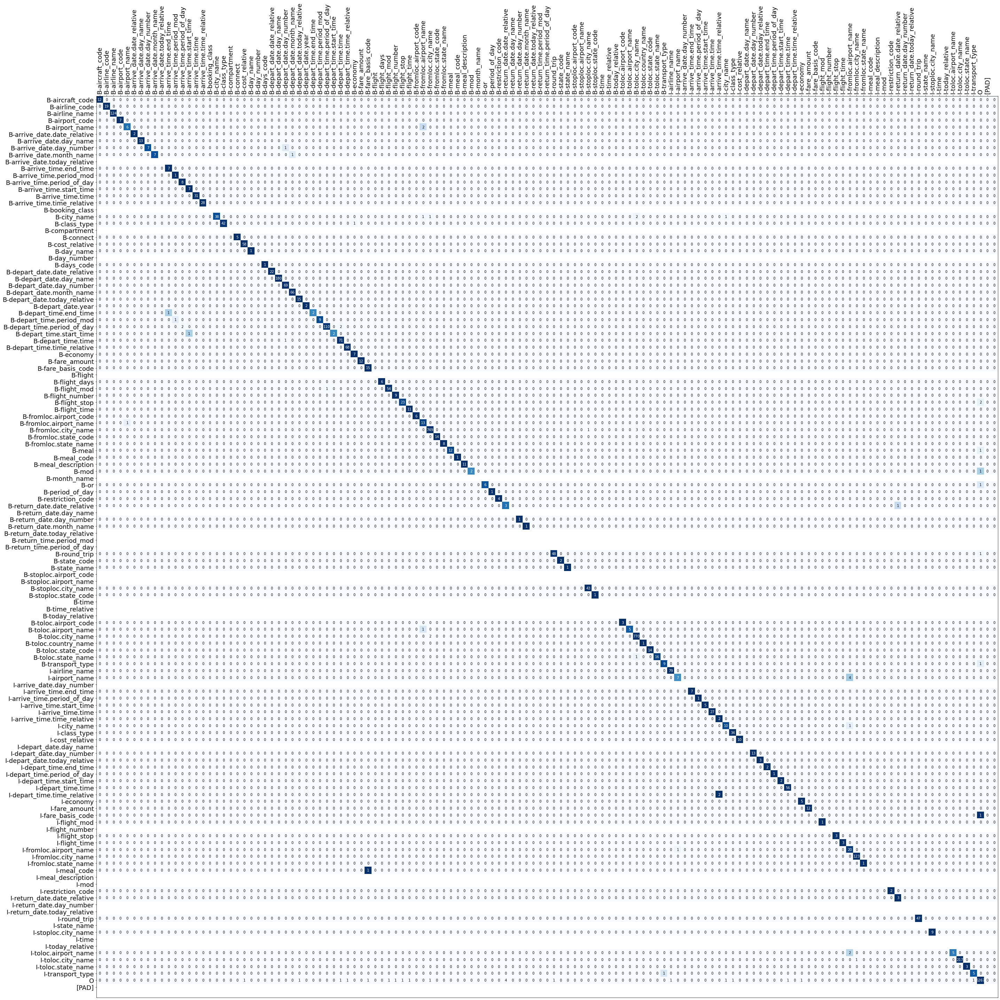

In [ ]:
slot_matrix_remix_ATIS_mean = np.mean(slot_matrix_remix_ATIS,axis=0)
slot_matrix_remix_ATIS_norm =  slot_matrix_remix_ATIS_mean/ slot_matrix_remix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_remix_ATIS_norm.shape[0]):
    if np.sum(slot_matrix_remix_ATIS_norm[i]) > 0.0:
        for j in range(slot_matrix_remix_ATIS_norm.shape[1]):
            color = "white" if slot_matrix_remix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_remix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

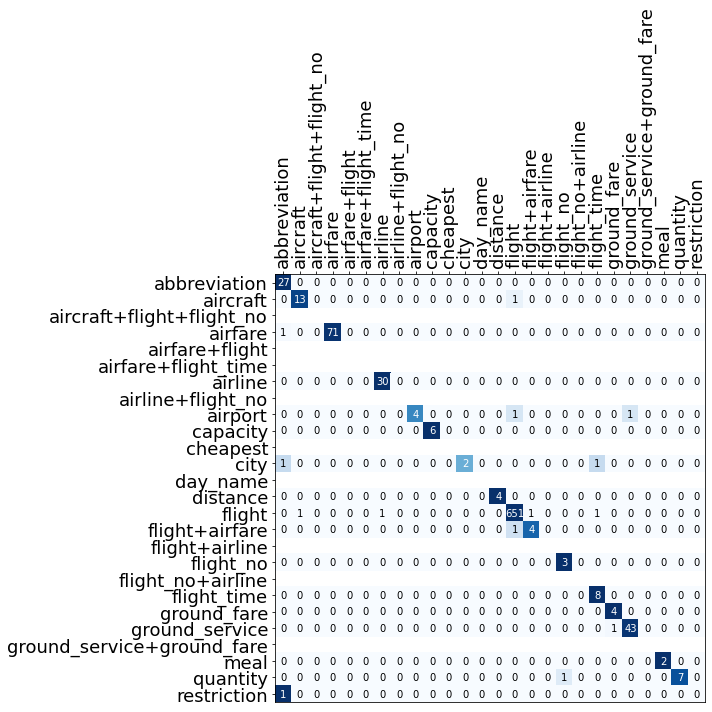

In [ ]:
intent_matrix_remix_ATIS_mean = np.mean(intent_matrix_remix_ATIS,axis=0)
intent_matrix_remix_ATIS_norm =  intent_matrix_remix_ATIS_mean/ intent_matrix_remix_ATIS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_ATIS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_remix_ATIS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_remix_ATIS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_remix_ATIS_norm.shape[0]):
    if np.sum(intent_matrix_remix_ATIS_norm[i]) > 0.0:
        for j in range(intent_matrix_remix_ATIS_norm.shape[1]):
            color = "white" if intent_matrix_remix_ATIS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_remix_ATIS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_remix_ATIS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_bert_remix_ATIS)

((709,), (709, 768))
((669,), (669, 768))
((778,), (778, 768))
((674,), (674, 768))
((653,), (653, 768))
((709,), (709, 768))
((699,), (699, 768))
((750,), (750, 768))
((725,), (725, 768))
((755,), (755, 768))
((719,), (719, 768))
((728,), (728, 768))
((723,), (723, 768))
((687,), (687, 768))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_bert_ATIS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_bert_ATIS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_bert_remix_ATIS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_bert_remix_ATIS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


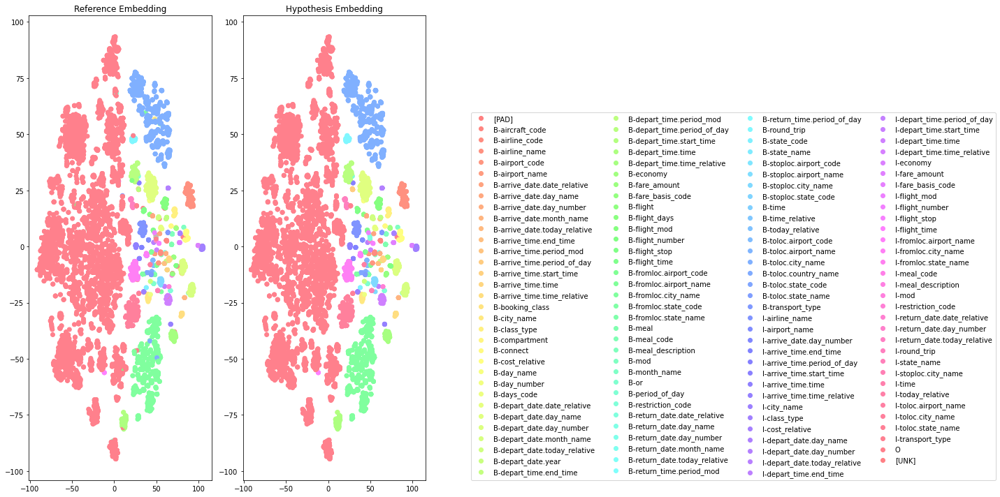

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='BERT_slot_embeddings_remix_ATIS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


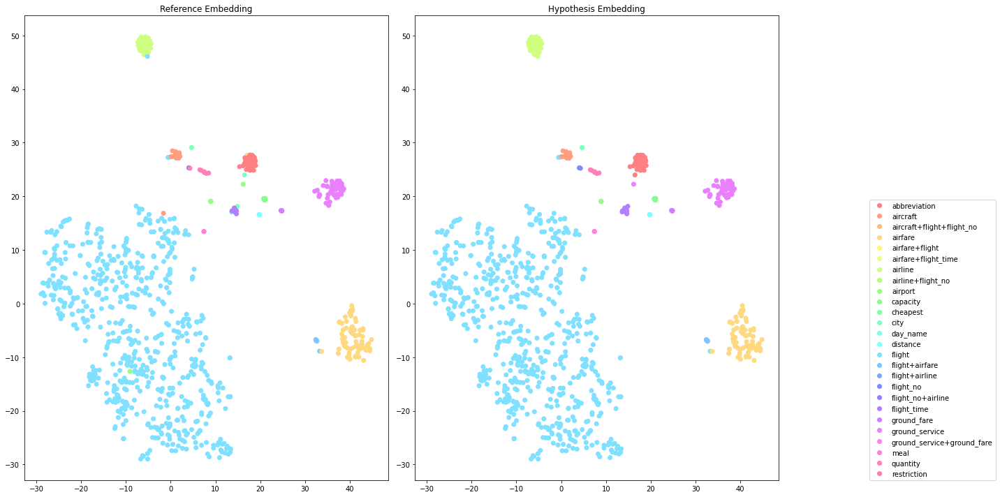

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='BERT_intent_embeddings_remix_ATIS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_ATIS = numpy_fillna(losses_train_remix_ATIS)
losses_dev_ATIS = numpy_fillna(losses_dev_remix_ATIS)

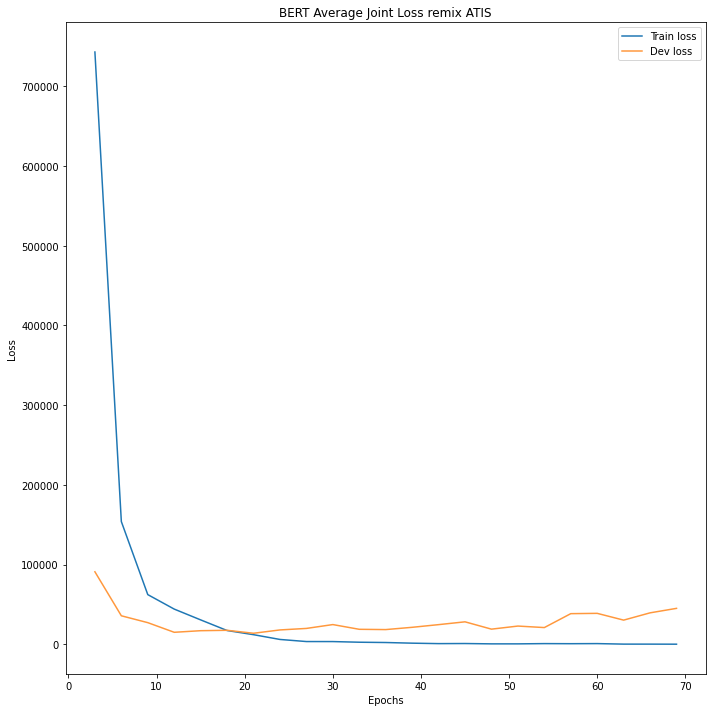

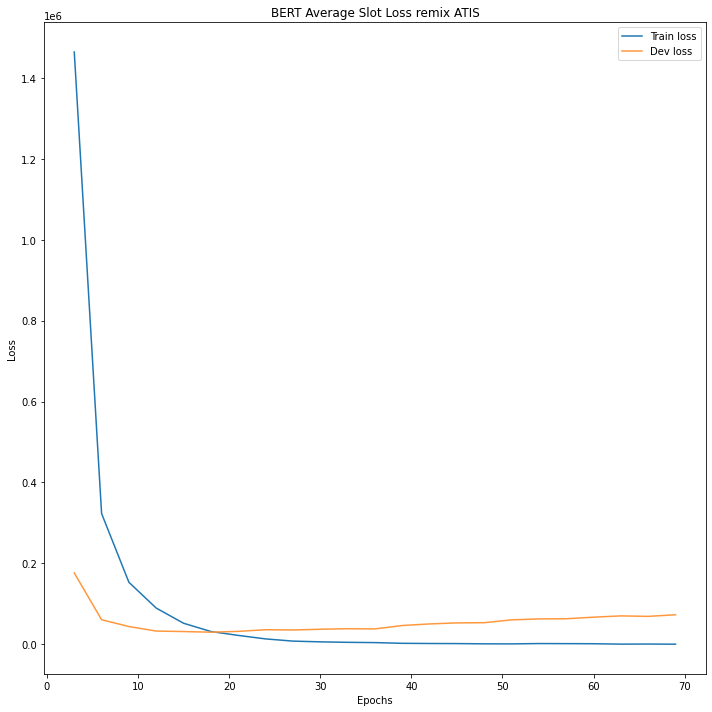

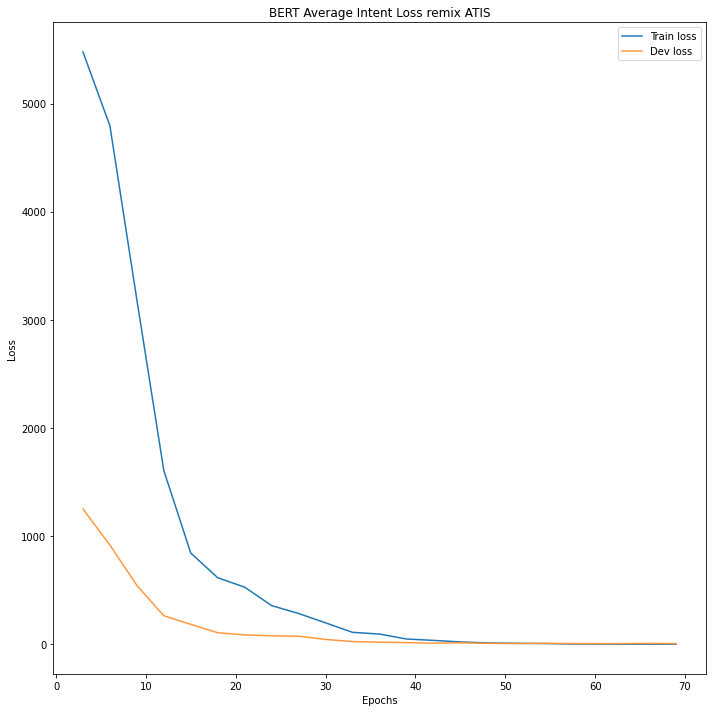

In [ ]:
plot_loss(losses_train_ATIS[:,:,0],losses_dev_ATIS[:,:,0],sample_rate,'BERT Average Joint Loss remix ATIS')
plot_loss(losses_train_ATIS[:,:,1],losses_dev_ATIS[:,:,1],sample_rate,'BERT Average Slot Loss remix ATIS')
plot_loss(losses_train_ATIS[:,:,2],losses_dev_ATIS[:,:,2],sample_rate,'BERT Average Intent Loss remix ATIS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_bert_ATIS,test_loader_bert_remix_ATIS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O O O B-class_type I-class_type O O B-fromloc.city_name O '
              'B-toloc.city_name I-toloc.city_name O O',
 'ref_slots': 'O O O O O O B-class_type I-class_type O O B-fromloc.city_name O '
              'B-toloc.city_name I-toloc.city_name O B-round_trip',
 'utterance': '[CLS] show me the cost of a first class ticket from detroit to '
              'las vegas and'}


In [ ]:
pprint(len(test_slot_errors))

46


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'abbreviation',
 'ref_intent': 'airfare',
 'utterance': '[CLS] display all fare'}


In [ ]:
pprint(len(test_intent_errors))

14


####SNIPS

Train multiple times on SNIPS

In [ ]:
models, slot_test_SNIPS,intent_test_SNIPS,losses_train_SNIPS,losses_dev_SNIPS, slot_matrix_SNIPS, intent_matrix_SNIPS, = train_multiple(runs,lang_bert_SNIPS,n_epochs,train_loader_bert_SNIPS,dev_loader_bert_SNIPS,test_loader_bert_SNIPS,criterion_slots,criterion_intents,n_layers,clip,patience_max,sample_rate)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
 41%|████▏     | 41/99 [48:53<1:09:10, 71.55s/it]


 save and load models

In [ ]:
for i,model in enumerate(models):
    torch.save(model,f"./BERT_SNIPS_{i}.pth")

In [ ]:
models = []
for i in range(runs):
    models.append(torch.load(f"./BERT_SNIPS_{i}.pth").to(device))

#####Results

In [ ]:
##average the results over multiple runs
slot_test_SNIPS_mean = result_mean(slot_test_SNIPS)
intent_test_SNIPS_mean = result_mean(intent_test_SNIPS)

Display results on slot filling task

In [ ]:
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(slot_test_SNIPS_mean.items(), key=lambda x: x[1]['f'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,p,r,f,s
object_part_of_series_type,1.000,1.000,1.000,11.0
party_size_description,1.000,1.000,1.000,10.0
facility,1.000,1.000,1.000,3.0
year,1.000,1.000,1.000,24.0
condition_temperature,1.000,1.000,1.000,23.0
rating_unit,1.000,1.000,1.000,40.0
object_select,1.000,1.000,1.000,40.0
movie_type,1.000,1.000,1.000,33.0
condition_description,1.000,1.000,1.000,28.0
geographic_poi,1.000,1.000,1.000,11.0


Display results on intent classification task

In [ ]:
intent_test_SNIPS_mean_no_acc = deepcopy(intent_test_SNIPS_mean)
##need to remove this key 'accuracy' and display separately
del intent_test_SNIPS_mean_no_acc['accuracy']
pd_tbl = pd.DataFrame().from_dict({k: v for k, v in sorted(intent_test_SNIPS_mean_no_acc.items(), key=lambda x: x[1]['f1-score'], reverse = True)}, orient='index')
pd_tbl.round(decimals=3)

,precision,recall,f1-score,support
RateBook,1.000,1.000,1.000,80.0
AddToPlaylist,1.000,0.992,0.996,124.0
GetWeather,1.000,0.981,0.990,104.0
BookRestaurant,0.979,1.000,0.989,92.0
macro avg,0.978,0.978,0.978,700.0
weighted avg,0.978,0.977,0.977,700.0
PlayMusic,0.955,0.988,0.971,86.0
SearchScreeningEvent,0.990,0.925,0.957,107.0
SearchCreativeWork,0.920,0.963,0.941,107.0


In [ ]:
pprint(intent_test_SNIPS_mean['accuracy'])

0.9771428571428571


In [ ]:
slot_f1s_SNIPS = np.asarray([f['total']['f'] for f in slot_test_SNIPS])
intent_acc_SNIPS = np.asarray([f['accuracy'] for f in intent_test_SNIPS])
print('Slot F1', round(slot_f1s_SNIPS.mean(),9), '+-', round(slot_f1s_SNIPS.std(),9))
print('Intent Acc', round(intent_acc_SNIPS.mean(), 9), '+-', round(intent_acc_SNIPS.std(), 9))

Slot F1 0.942291609 +- 0.0
Intent Acc 0.977142857 +- 0.0


Plot confusion matrixes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


<Figure size 432x288 with 0 Axes>

<Figure size 2880x2880 with 0 Axes>

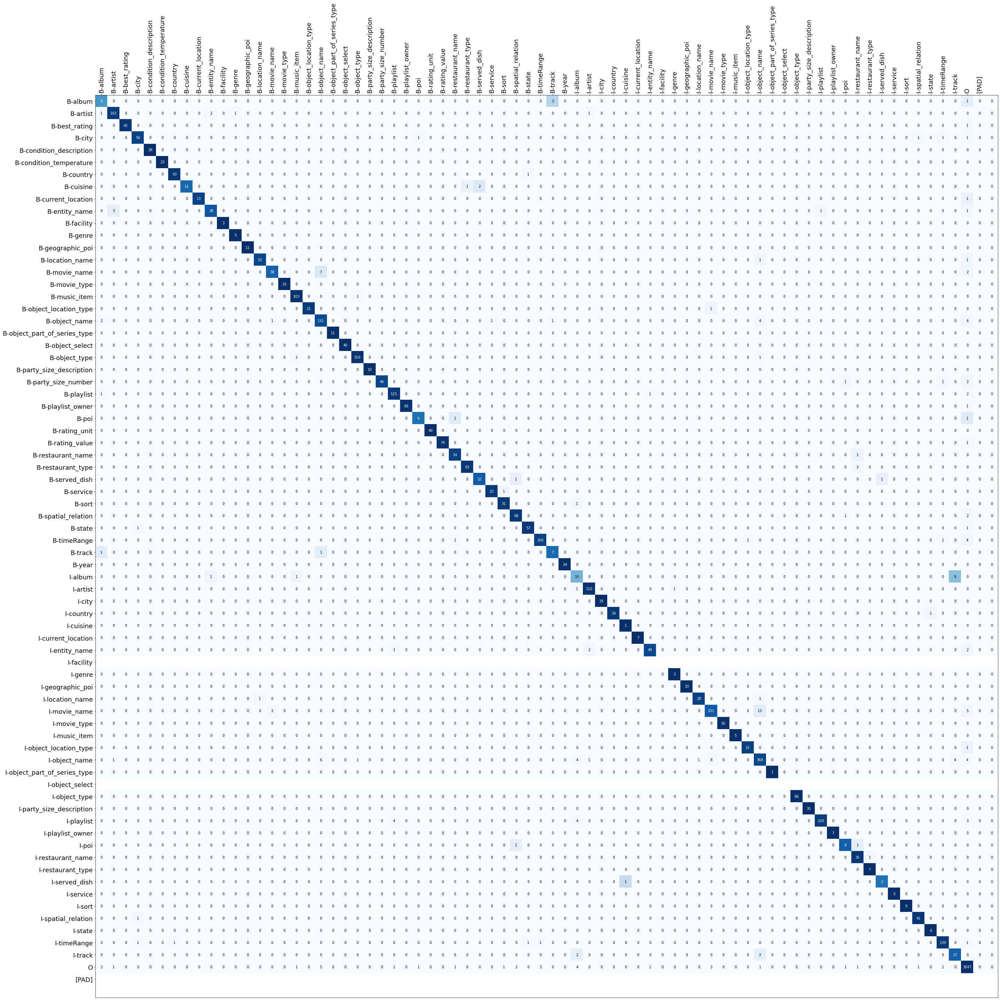

In [ ]:
slot_matrix_SNIPS_mean = np.mean(slot_matrix_SNIPS,axis=0)
slot_matrix_SNIPS_norm =  slot_matrix_SNIPS_mean/ slot_matrix_SNIPS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_SNIPS.slot2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (40,40))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(slot_matrix_SNIPS_norm, cmap=plt.cm.Blues)
for i in range(slot_matrix_SNIPS_norm.shape[0]):
    if np.sum(slot_matrix_SNIPS_norm[i]) > 0.0:
        for j in range(slot_matrix_SNIPS_norm.shape[1]):
            color = "white" if slot_matrix_SNIPS_norm[i, j] >= 0.5 else "black"
            number = f"{slot_matrix_SNIPS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color,) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_slot_SNIPS')

<Figure size 432x288 with 0 Axes>

<Figure size 720x720 with 0 Axes>

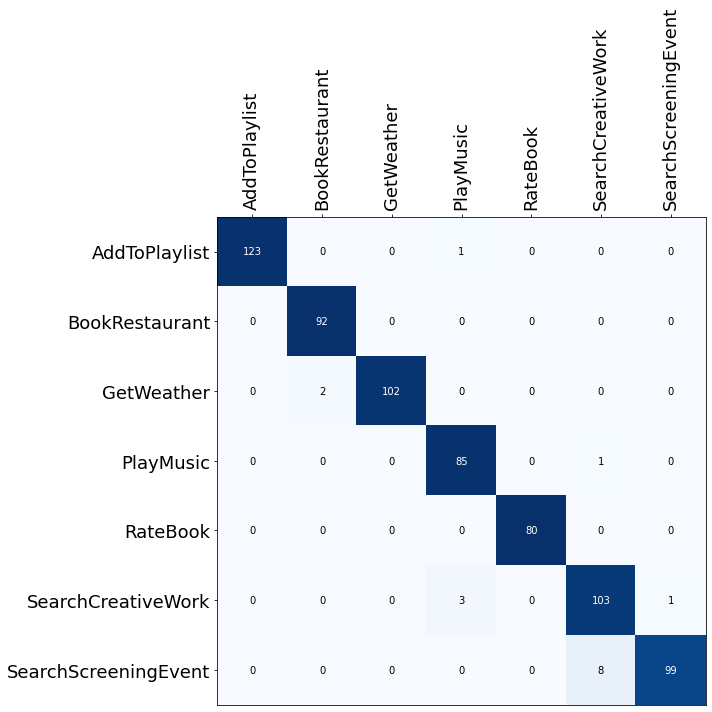

In [ ]:
intent_matrix_SNIPS_mean = np.mean(intent_matrix_SNIPS,axis=0)
intent_matrix_SNIPS_norm =  intent_matrix_SNIPS_mean/ intent_matrix_SNIPS_mean.sum(axis=1)[:, np.newaxis]
labels = lang_SNIPS.intent2id.keys()

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.Blues)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_SNIPS_labeless')

plt.clf()
fig, ax = plt.subplots(figsize = (10,10))
ax.xaxis.set_ticks_position('top')
heatmap = ax.pcolormesh(intent_matrix_SNIPS_norm, cmap=plt.cm.Blues)
for i in range(intent_matrix_SNIPS_norm.shape[0]):
    if np.sum(intent_matrix_SNIPS_norm[i]) > 0.0:
        for j in range(intent_matrix_SNIPS_norm.shape[1]):
            color = "white" if intent_matrix_SNIPS_norm[i, j] >= 0.5 else "black"
            number = f"{intent_matrix_SNIPS_mean[i, j]:.0f}" 
            plt.text(j+0.5, i+0.5, number, ha="center", va="center", color=color) 
plt.xticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=90)
plt.yticks([ i+0.5 for i in list(range(len(labels)))], labels,fontsize=18,rotation=0)
plt.gca().invert_yaxis()
plt.savefig('CM_BERT_intent_SNIPS')

Feature embeddings

Here i plot the embeddings using TSNE. If the model is able to learn correclty, the features should be well separated from each other

In [ ]:
# compute the embeddings
slot,intent,slot_embeddings,intent_embeddings = embeddings_extractor_np(models[0],test_loader_bert_SNIPS)

((576,), (576, 768))
((551,), (551, 768))
((580,), (580, 768))
((599,), (599, 768))
((599,), (599, 768))
((610,), (610, 768))
((616,), (616, 768))
((566,), (566, 768))
((564,), (564, 768))
((550,), (550, 768))
((543,), (543, 768))


In [ ]:
slot_classes = {k: v for k, v in sorted(lang_bert_SNIPS.slot2id.items(), key=lambda item: item[1])}
slot_colormap =  color_map(slot_classes)
intent_classes = {k: v for k, v in sorted(lang_bert_SNIPS.intent2id.items(), key=lambda item: item[1])}
intent_colormap =  color_map(intent_classes)
# slot = slot.cpu().detach().numpy()
# intent = intent.cpu().detach().numpy()
# slot_embeddings = slot_embeddings.cpu().detach().numpy()
# intent_embeddings = intent_embeddings.cpu().detach().numpy()
# reference
ref_slots = []
for i in test_loader_bert_SNIPS:
    for sent in i['slots']:
        ref_slots.append(sent)
ref_slots = torch.cat(ref_slots)
ref_slots = ref_slots.cpu().detach().numpy()
ref_intents = []
for i in test_loader_bert_SNIPS:
    ref_intents.append(i['intents'])
ref_intents = torch.cat(ref_intents,dim=0)
ref_intents = ref_intents.cpu().detach().numpy()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


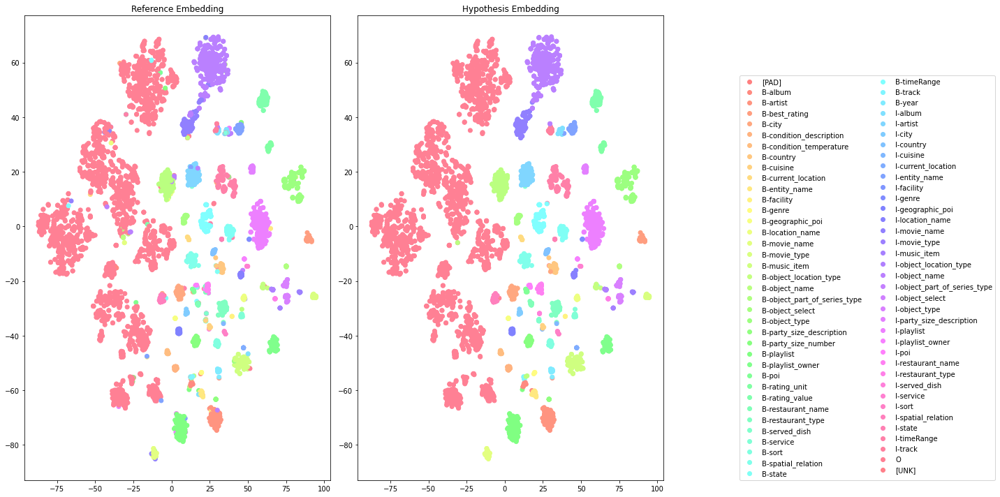

In [ ]:
plot_features(slot_embeddings,ref_slots,slot,slot_classes,slot_colormap,name='BERT_slot_embeddings_SNIPS')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


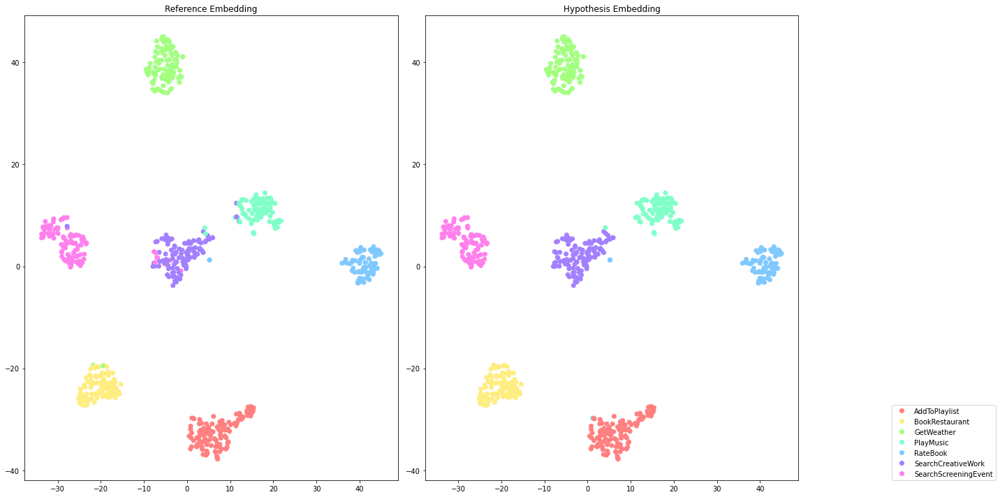

In [ ]:
plot_features(intent_embeddings,ref_intents,intent,intent_classes,intent_colormap,name='BERT_intent_embeddings_SNIPS')

In [ ]:
##note that because of early stopping some iterations have less data
##this creates ragged lists, that need to be filled with values in order to properly used as numpy arrays
##The values used are NaN, because thus it is possible to exclude them from the computation using numpy specific operators 
losses_train_SNIPS = numpy_fillna(losses_train_SNIPS)
losses_dev_SNIPS = numpy_fillna(losses_dev_SNIPS)

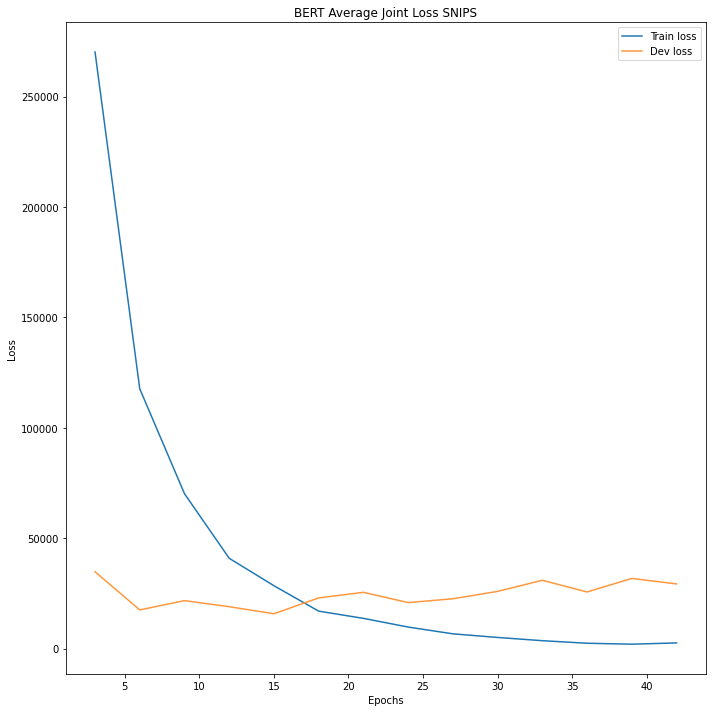

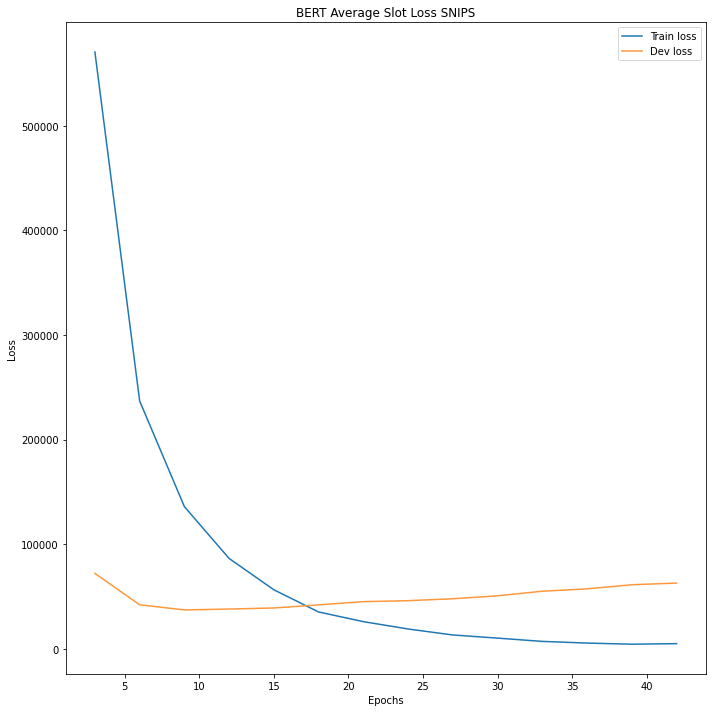

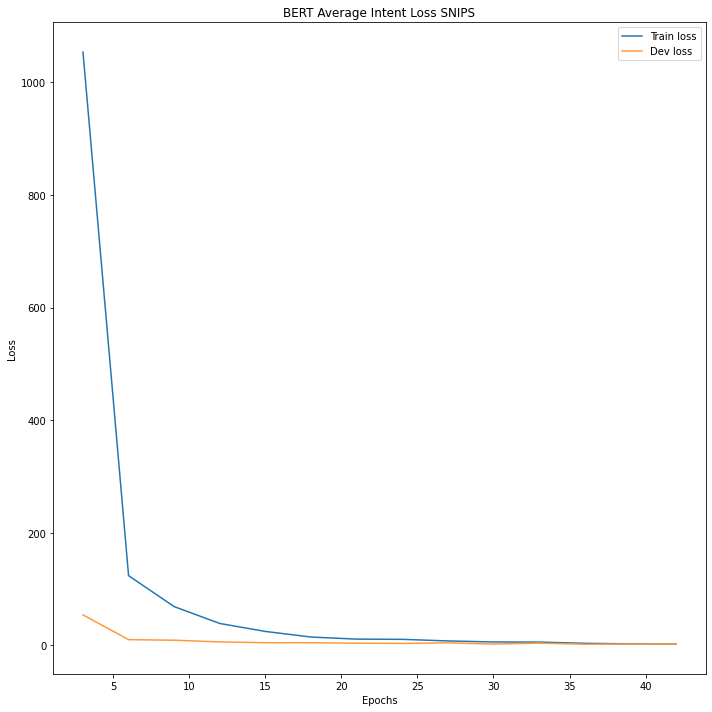

In [ ]:
plot_loss(losses_train_SNIPS[:,:,0],losses_dev_SNIPS[:,:,0],sample_rate,'BERT Average Joint Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,1],losses_dev_SNIPS[:,:,1],sample_rate,'BERT Average Slot Loss SNIPS')
plot_loss(losses_train_SNIPS[:,:,2],losses_dev_SNIPS[:,:,2],sample_rate,'BERT Average Intent Loss SNIPS') 

##### Errors

Check what errors the model makes

In [ ]:
ref_slots,hyp_slots,ref_intents,hyp_intents, = eval_loop_complete(models[0],lang_bert_SNIPS,test_loader_bert_SNIPS)

In [ ]:
test_slot_errors = slot_errors(ref_slots,hyp_slots)
test_intent_errors = intent_errors(ref_intents,hyp_intents,ref_slots)

In [ ]:
pprint(test_slot_errors[0])

{'hyp_slots': 'O O O O B-party_size_number O O B-sort B-restaurant_type '
              'B-restaurant_type B-spatial_relation B-city B-spatial_relation '
              'I-spatial_relation',
 'ref_slots': 'O O O O B-party_size_number O O B-sort B-cuisine '
              'B-restaurant_type B-spatial_relation I-spatial_relation O '
              'B-city',
 'utterance': '[CLS] book a spot for ten at a top - rated caucasian restaurant '
              'not'}


In [ ]:
pprint(len(test_slot_errors))

79


In [ ]:
pprint(test_intent_errors[0])

{'hyp_intent': 'SearchCreativeWork',
 'ref_intent': 'SearchScreeningEvent',
 'utterance': '[CLS] in one hour find king of'}


In [ ]:
pprint(len(test_intent_errors))

16
